# 1. Постановка задачи второго эксперимента

На первом этапе формулируется самостоятельная исследовательская задача второго эксперимента. Эксперимент не использует результаты первого исследования, поэтому загрузка данных, подготовка выборок, обучение моделей, расчет показателей качества и выгрузка файлов выполняются заново. Такой подход позволяет получить независимую линию исследования, связанную с восстановлением качества изображений при помощи нейросетей.

Научная новизна второго эксперимента состоит в построении воспроизводимого конвейера восстановления изображений на основе синтетически ухудшенных данных. Исходное изображение животного рассматривается как эталон, а его искусственно испорченная версия используется как вход модели. Нейросетевая модель должна сформировать улучшенное изображение, приближенное к исходному. В результате исследуется не только обработка изображений, но и генерация восстановленной версии изображения в задаче преобразования одного изображения в другое.

In [ ]:
# Импортируем библиотеку для работы с файлами и каталогами.
# Каталог означает папку в файловой системе.
from pathlib import Path

# Импортируем библиотеку для сохранения структурированных данных.
# Формат JSON используется для хранения сведений в виде пар ключ значение.
import json

# Импортируем библиотеку для фиксации даты и времени запуска этапа.
from datetime import datetime

# Создаем основной каталог второго эксперимента.
# Этот каталог не связан с результатами первого эксперимента.
PROJECT_DIR = Path("/content/image_restoration_experiment")

# Создаем каталог для отчетных материалов.
REPORTS_DIR = PROJECT_DIR / "results" / "reports"
REPORTS_DIR.mkdir(parents=True, exist_ok=True)

# Описываем постановку эксперимента.
# Эти сведения затем можно использовать в тексте
experiment_statement = {
    "дата_создания": datetime.now().strftime("%Y-%m-%d %H:%M:%S"),
    "тема": "Генерация и обработка изображений при помощи нейросетей",
    "название_эксперимента": "Нейросетевое восстановление качества изображений животных на основе синтетически ухудшенных данных",
    "цель_эксперимента": (
        "разработать и оценить нейросетевую модель, которая принимает ухудшенное "
        "изображение животного и формирует восстановленную версию изображения"
    ),
    "объект_исследования": (
        "цифровые изображения животных из открытого набора Oxford-IIIT Pet"
    ),
    "предмет_исследования": (
        "методы нейросетевого восстановления качества изображений при наличии шума, "
        "размытия, потери детализации и следов сжатия"
    ),
    "научная_новизна": (
        "предлагается самостоятельный воспроизводимый конвейер, в котором исходные "
        "изображения животных автоматически преобразуются в пары ухудшенное изображение "
        "и эталонное изображение, после чего обучается модель преобразования изображения "
        "в изображение. Качество восстановления оценивается численно и визуально по "
        "нескольким типам искусственных искажений"
    ),
    "практическая_ценность": (
        "результаты эксперимента будут использованы как основа пользовательского приложения, "
        "в котором можно загрузить изображение и получить улучшенную восстановленную версию"
    ),
    "ограничение_эксперимента": (
        "второй эксперимент выполняется независимо от первого: ранее сохраненные модели, "
        "таблицы, маски, разбиения и архивы не используются"
    ),
    "ожидаемые_артефакты": [
        "обученная модель восстановления качества изображения",
        "файл с настройками применения модели",
        "модуль применения модели к пользовательскому изображению",
        "таблицы с показателями качества",
        "рисунки с примерами восстановления",
        "архив файлов для переноса на рабочий компьютер"
    ]
}

# Сохраняем постановку эксперимента в файл.
statement_path = REPORTS_DIR / "experiment_statement.json"
with open(statement_path, "w", encoding="utf-8") as file:
    json.dump(experiment_statement, file, ensure_ascii=False, indent=4)

Постановка задачи сохранена, научная новизна сформулирована удачно, эксперимент отделен от первой исследовательской линии. В формулировке отражены самостоятельность второго эксперимента, воспроизводимость, преобразование ухудшенного изображения в восстановленное и последующая численная оценка качества.

# 2. Подготовка среды выполнения и структуры каталогов

На втором этапе создается независимая среда выполнения для второго эксперимента. Подготавливаются библиотеки для обработки изображений, обучения нейросетей, расчета показателей качества и сохранения результатов. Отдельно проверяется наличие графического ускорителя, поскольку дальнейшее обучение модели восстановления качества изображений на центральном процессоре будет слишком длительным.

Научная новизна эксперимента поддерживается через воспроизводимую организацию вычислений. Все данные, модели, таблицы, рисунки, журналы и файлы для будущего приложения сохраняются в единой структуре каталогов. Такая организация позволяет повторить эксперимент, проверить результаты и перенести лучшие артефакты в пользовательское приложение.

In [2]:
# Обновляем установщик библиотек.
# Это снижает вероятность ошибок при установке дополнительных средств.
!python -m pip install -q --upgrade pip

# Устанавливаем библиотеки, необходимые для второго эксперимента.
# opencv-python-headless используется для обработки изображений без графического окна.
# scikit-image используется для расчета показателей качества изображений.
# python-dotenv используется для чтения настроек из файла окружения.
# openai понадобится только для дополнительного текстового модуля, если он будет включен позже.
!pip install -q \
    opencv-python-headless \
    scikit-image \
    python-dotenv \
    openai

# Импортируем стандартные библиотеки языка Python.
import os
import json
import random
import shutil
import platform
from pathlib import Path
from datetime import datetime

# Импортируем библиотеки для численных вычислений и таблиц.
import numpy as np
import pandas as pd

# Импортируем библиотеку для обучения нейросетей.
# Нейросеть означает вычислительную модель, которая обучается находить закономерности в данных.
import torch

# Импортируем средства для работы с изображениями.
from PIL import Image

# Импортируем библиотеку для построения графиков.
import matplotlib.pyplot as plt

# Импортируем библиотеку компьютерного зрения.
# Компьютерное зрение означает обработку и анализ изображений с помощью алгоритмов.
import cv2

# Импортируем функции для расчета качества восстановленных изображений.
from skimage.metrics import peak_signal_noise_ratio
from skimage.metrics import structural_similarity

# Задаем начальное число для повторяемости эксперимента.
# Повторяемость означает получение близких результатов при повторном запуске кода.
SEED = 42

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

# Проверяем наличие графического ускорителя.
# Для второго эксперимента графический ускоритель является обязательным,
# потому что далее будет выполняться обучение нейросетевой модели восстановления изображений.
if not torch.cuda.is_available():
    raise RuntimeError(
        "Графический ускоритель не найден. "
        "Необходимо включить T4 GPU в настройках среды выполнения Google Colab "
        "и заново выполнить этап 2."
    )

# Если графический ускоритель найден, задаем начальное число и для него.
torch.cuda.manual_seed_all(SEED)

# Определяем устройство для вычислений.
DEVICE = "cuda"

# Создаем основной каталог второго эксперимента.
# Каталог полностью независим от первого эксперимента.
PROJECT_DIR = Path("/content/image_restoration_experiment")

# Создаем основные каталоги проекта.
DATA_DIR = PROJECT_DIR / "data"
RESULTS_DIR = PROJECT_DIR / "results"
EXPORT_DIR = PROJECT_DIR / "export"

# Создаем подробную структуру каталогов.
DIRECTORIES = {
    "исходные данные": DATA_DIR / "raw",
    "подготовленные данные": DATA_DIR / "processed",
    "ухудшенные изображения": DATA_DIR / "processed" / "degraded",
    "эталонные изображения": DATA_DIR / "processed" / "original",
    "обучающая часть": DATA_DIR / "processed" / "train",
    "проверочная часть": DATA_DIR / "processed" / "valid",
    "контрольная часть": DATA_DIR / "processed" / "test",
    "модели": RESULTS_DIR / "models",
    "показатели качества": RESULTS_DIR / "metrics",
    "рисунки": RESULTS_DIR / "figures",
    "примеры": RESULTS_DIR / "examples",
    "отчеты": RESULTS_DIR / "reports",
    "журналы": RESULTS_DIR / "logs",
    "файлы для приложения": EXPORT_DIR,
}

for directory in DIRECTORIES.values():
    directory.mkdir(parents=True, exist_ok=True)

# Собираем сведения о среде выполнения.
environment_info = {
    "дата_и_время_запуска": datetime.now().strftime("%Y-%m-%d %H:%M:%S"),
    "версия_python": platform.python_version(),
    "операционная_система": platform.platform(),
    "устройство_вычислений": DEVICE,
    "название_графического_ускорителя": torch.cuda.get_device_name(0),
    "объем_памяти_графического_ускорителя_гб": round(
        torch.cuda.get_device_properties(0).total_memory / 1024 ** 3,
        2
    ),
    "версия_torch": torch.__version__,
    "начальное_число_для_повторяемости": SEED,
    "основной_каталог_эксперимента": str(PROJECT_DIR),
}

# Сохраняем сведения о среде выполнения.
environment_path = RESULTS_DIR / "reports" / "environment_info.json"
with open(environment_path, "w", encoding="utf-8") as file:
    json.dump(environment_info, file, ensure_ascii=False, indent=4)

# Подключаем Google Диск.
# Подключение нужно для сохранения результатов после завершения сеанса Google Colab.
from google.colab import drive

drive.mount("/content/drive")

# Создаем каталог второго эксперимента на Google Диске.
DRIVE_PROJECT_DIR = Path("/content/drive/MyDrive/image_restoration_experiment")

DRIVE_DIRECTORIES = {
    "корневой каталог на диске": DRIVE_PROJECT_DIR,
    "копии моделей": DRIVE_PROJECT_DIR / "models",
    "копии показателей": DRIVE_PROJECT_DIR / "metrics",
    "копии рисунков": DRIVE_PROJECT_DIR / "figures",
    "копии отчетов": DRIVE_PROJECT_DIR / "reports",
    "готовые архивы": DRIVE_PROJECT_DIR / "exports",
}

for directory in DRIVE_DIRECTORIES.values():
    directory.mkdir(parents=True, exist_ok=True)

# Сохраняем сведения о подключении Google Диска.
drive_info = {
    "google_диск_подключен": True,
    "каталог_эксперимента_на_google_диске": str(DRIVE_PROJECT_DIR),
    "каталог_моделей": str(DRIVE_DIRECTORIES["копии моделей"]),
    "каталог_показателей": str(DRIVE_DIRECTORIES["копии показателей"]),
    "каталог_рисунков": str(DRIVE_DIRECTORIES["копии рисунков"]),
    "каталог_отчетов": str(DRIVE_DIRECTORIES["копии отчетов"]),
    "каталог_архивов": str(DRIVE_DIRECTORIES["готовые архивы"]),
}

drive_info_path = RESULTS_DIR / "reports" / "drive_info.json"
with open(drive_info_path, "w", encoding="utf-8") as file:
    json.dump(drive_info, file, ensure_ascii=False, indent=4)

# Копируем отчетные файлы на Google Диск.
shutil.copy2(environment_path, DRIVE_PROJECT_DIR / "reports" / environment_path.name)
shutil.copy2(drive_info_path, DRIVE_PROJECT_DIR / "reports" / drive_info_path.name)

# Если первый этап был выполнен в этой же среде, копируем постановку эксперимента на Google Диск.
statement_path = RESULTS_DIR / "reports" / "experiment_statement.json"
if statement_path.exists():
    shutil.copy2(statement_path, DRIVE_PROJECT_DIR / "reports" / statement_path.name)

# Выводим краткий отчет о подготовке.
print("Среда второго эксперимента подготовлена")
print("Основной каталог эксперимента:", PROJECT_DIR)
print("Устройство вычислений:", DEVICE)
print("Графический ускоритель:", environment_info["название_графического_ускорителя"])
print("Память графического ускорителя, ГБ:", environment_info["объем_памяти_графического_ускорителя_гб"])
print("Версия библиотеки torch:", torch.__version__)
print("Файл со сведениями о среде:", environment_path)
print("Файл со сведениями о сохранении:", drive_info_path)

print("\nСозданные каталоги:")
for name, directory in DIRECTORIES.items():
    print(name + ":", directory)

print("\nGoogle Диск подключен")
print("Каталог на Google Диске:", DRIVE_PROJECT_DIR)

Mounted at /content/drive
Среда второго эксперимента подготовлена
Основной каталог эксперимента: /content/image_restoration_experiment
Устройство вычислений: cuda
Графический ускоритель: Tesla T4
Память графического ускорителя, ГБ: 14.56
Версия библиотеки torch: 2.10.0+cu128
Файл со сведениями о среде: /content/image_restoration_experiment/results/reports/environment_info.json
Файл со сведениями о сохранении: /content/image_restoration_experiment/results/reports/drive_info.json

Созданные каталоги:
исходные данные: /content/image_restoration_experiment/data/raw
подготовленные данные: /content/image_restoration_experiment/data/processed
ухудшенные изображения: /content/image_restoration_experiment/data/processed/degraded
эталонные изображения: /content/image_restoration_experiment/data/processed/original
обучающая часть: /content/image_restoration_experiment/data/processed/train
проверочная часть: /content/image_restoration_experiment/data/processed/valid
контрольная часть: /content/ima

Среда запущена на графическом ускорителе Tesla T4 с доступной памятью 14,56 ГБ, что подходит для дальнейшего обучения модели восстановления изображений. Версия библиотеки для обучения нейросетей определена корректно, структура каталогов создана, Google Диск подключен, поэтому результаты можно будет сохранять после каждого крупного этапа.

Следующий этап посвящен повторной загрузке набора Oxford-IIIT Pet. Данные скачиваются заново, без обращения к результатам первого эксперимента. На этом этапе формируется собственная таблица описания изображений, которая станет основой для создания ухудшенных версий и дальнейшего обучения модели восстановления.

# 3. Повторная загрузка и проверка набора изображений

На данном этапе выполняется повторная загрузка открытого набора изображений Oxford-IIIT Pet. Эксперимент остается независимым от первой исследовательской линии: изображения, разметка, таблица описания и сводные сведения создаются заново в отдельном каталоге второго эксперимента.

Научная новизна поддерживается тем, что один и тот же открытый набор будет преобразован в самостоятельный набор пар для восстановления качества. Сначала фиксируется исходное состояние данных: количество изображений, наличие файлов разметки, распределение животных по видам и породам, размеры изображений. Эти сведения нужны для обоснования дальнейшего создания искусственно ухудшенных изображений и выбора единого размера входа модели.

In [3]:
# Импортируем стандартные библиотеки для работы с файлами, архивами и загрузкой данных.
import json
import tarfile
import urllib.request
import shutil
from pathlib import Path
from datetime import datetime

# Импортируем библиотеки для таблиц и изображений.
import pandas as pd
from PIL import Image

# Если код запускается после перезапуска среды, повторно задаем основные каталоги.
PROJECT_DIR = Path("/content/image_restoration_experiment")
DATA_DIR = PROJECT_DIR / "data"
RESULTS_DIR = PROJECT_DIR / "results"
EXPORT_DIR = PROJECT_DIR / "export"

RAW_DIR = DATA_DIR / "raw"
METRICS_DIR = RESULTS_DIR / "metrics"
REPORTS_DIR = RESULTS_DIR / "reports"

RAW_DIR.mkdir(parents=True, exist_ok=True)
METRICS_DIR.mkdir(parents=True, exist_ok=True)
REPORTS_DIR.mkdir(parents=True, exist_ok=True)

# Создаем отдельный каталог для набора Oxford-IIIT Pet внутри второго эксперимента.
OXFORD_DIR = RAW_DIR / "oxford_iiit_pet"
OXFORD_DIR.mkdir(parents=True, exist_ok=True)

# Задаем прямые адреса официальных архивов.
# Первый архив содержит изображения животных.
# Второй архив содержит разметку, служебные списки и маски сегментации.
IMAGES_URL = "https://thor.robots.ox.ac.uk/~vgg/data/pets/images.tar.gz"
ANNOTATIONS_URL = "https://thor.robots.ox.ac.uk/~vgg/data/pets/annotations.tar.gz"

# Задаем пути для сохранения архивов.
images_archive_path = OXFORD_DIR / "images.tar.gz"
annotations_archive_path = OXFORD_DIR / "annotations.tar.gz"


def download_file(url, output_path):
    """
    Загружает файл по прямому адресу.
    Если файл уже существует и имеет ненулевой размер, повторная загрузка не выполняется.
    """
    output_path = Path(output_path)

    if output_path.exists() and output_path.stat().st_size > 0:
        print("Файл уже загружен:", output_path.name)
        print("Размер файла, МБ:", round(output_path.stat().st_size / 1024 / 1024, 2))
        return

    print("Начата загрузка файла:", output_path.name)
    urllib.request.urlretrieve(url, output_path)
    print("Загрузка завершена:", output_path.name)
    print("Размер файла, МБ:", round(output_path.stat().st_size / 1024 / 1024, 2))


def safe_extract_archive(archive_path, output_dir, expected_folder_name):
    """
    Распаковывает архив в указанный каталог.
    Проверка пути защищает от случайной распаковки файлов за пределы рабочего каталога.
    """
    archive_path = Path(archive_path)
    output_dir = Path(output_dir)
    expected_folder = output_dir / expected_folder_name

    if expected_folder.exists():
        print("Архив уже распакован:", expected_folder_name)
        return

    print("Начата распаковка архива:", archive_path.name)

    with tarfile.open(archive_path, "r:gz") as archive:
        for member in archive.getmembers():
            member_path = output_dir / member.name
            resolved_output_dir = output_dir.resolve()
            resolved_member_path = member_path.resolve()

            if not str(resolved_member_path).startswith(str(resolved_output_dir)):
                raise RuntimeError("Обнаружен небезопасный путь внутри архива")

        archive.extractall(output_dir)

    print("Распаковка завершена:", archive_path.name)


# Загружаем оба архива заново в каталог второго эксперимента.
download_file(IMAGES_URL, images_archive_path)
download_file(ANNOTATIONS_URL, annotations_archive_path)

# Распаковываем архивы.
safe_extract_archive(images_archive_path, OXFORD_DIR, "images")
safe_extract_archive(annotations_archive_path, OXFORD_DIR, "annotations")

# Задаем пути к основным каталогам набора.
images_dir = OXFORD_DIR / "images"
annotations_dir = OXFORD_DIR / "annotations"
trimaps_dir = annotations_dir / "trimaps"
list_file_path = annotations_dir / "list.txt"

# Проверяем наличие основных каталогов и служебного файла.
required_paths = {
    "каталог изображений": images_dir,
    "каталог разметки": annotations_dir,
    "каталог масок": trimaps_dir,
    "служебный список изображений": list_file_path,
}

missing_paths = []

for name, path in required_paths.items():
    if not path.exists():
        missing_paths.append(name + ": " + str(path))

if missing_paths:
    raise FileNotFoundError(
        "Не найдены обязательные элементы набора данных:\n" + "\n".join(missing_paths)
    )

# Получаем список файлов изображений.
image_paths = sorted([
    path for path in images_dir.glob("*.jpg")
    if path.is_file() and not path.name.startswith(".")
])

# Получаем список файлов масок.
trimap_paths = sorted([
    path for path in trimaps_dir.glob("*.png")
    if path.is_file() and not path.name.startswith(".")
])

print("Количество файлов изображений:", len(image_paths))
print("Количество файлов масок:", len(trimap_paths))
print("Служебный список найден:", list_file_path.exists())


def read_annotation_list(list_path):
    """
    Читает служебный список изображений.
    В списке хранятся имя изображения, номер породы, вид животного и номер породы внутри вида.
    """
    rows = []

    with open(list_path, "r", encoding="utf-8") as file:
        for line in file:
            line = line.strip()

            # Пропускаем пустые строки и поясняющие строки.
            if not line or line.startswith("#"):
                continue

            parts = line.split()

            if len(parts) != 4:
                continue

            image_id, class_id, species_id, breed_id = parts

            rows.append({
                "image_id": image_id,
                "class_id": int(class_id),
                "species_id": int(species_id),
                "breed_id": int(breed_id),
            })

    return pd.DataFrame(rows)


# Читаем служебный список и создаем таблицу описания данных.
data_table = read_annotation_list(list_file_path)

# Добавляем понятные названия видов животных.
data_table["species_name_ru"] = data_table["species_id"].map({
    1: "кошка",
    2: "собака",
})

# Получаем название породы из имени файла.
# В имени последняя часть после нижнего подчеркивания является номером изображения.
data_table["breed_name"] = data_table["image_id"].apply(
    lambda value: value.rsplit("_", 1)[0]
)

# Создаем пути к изображениям и маскам.
data_table["image_path"] = data_table["image_id"].apply(
    lambda value: str(images_dir / f"{value}.jpg")
)

data_table["trimap_path"] = data_table["image_id"].apply(
    lambda value: str(trimaps_dir / f"{value}.png")
)

# Проверяем существование файлов.
data_table["image_exists"] = data_table["image_path"].apply(
    lambda value: Path(value).exists()
)

data_table["trimap_exists"] = data_table["trimap_path"].apply(
    lambda value: Path(value).exists()
)

# Считываем размеры изображений.
# Размеры понадобятся для выбора единого размера входа модели.
widths = []
heights = []

for image_path in data_table["image_path"]:
    path = Path(image_path)

    if path.exists():
        with Image.open(path) as image:
            width, height = image.size
    else:
        width, height = None, None

    widths.append(width)
    heights.append(height)

data_table["width"] = widths
data_table["height"] = heights

# Оставляем только записи с найденными изображениями и масками.
valid_data_table = data_table[
    (data_table["image_exists"] == True) &
    (data_table["trimap_exists"] == True)
].reset_index(drop=True)

# Сохраняем таблицу описания данных.
dataset_table_path = METRICS_DIR / "dataset_manifest_second_experiment.csv"
valid_data_table.to_csv(dataset_table_path, index=False, encoding="utf-8")

# Формируем сводные сведения о наборе данных.
dataset_summary = {
    "дата_создания": datetime.now().strftime("%Y-%m-%d %H:%M:%S"),
    "количество_файлов_изображений_в_каталоге": int(len(image_paths)),
    "количество_файлов_масок_в_каталоге": int(len(trimap_paths)),
    "количество_записей_в_служебном_списке": int(len(data_table)),
    "количество_пригодных_записей": int(len(valid_data_table)),
    "количество_классов": int(valid_data_table["class_id"].nunique()),
    "количество_пород": int(valid_data_table["breed_name"].nunique()),
    "количество_кошек": int((valid_data_table["species_name_ru"] == "кошка").sum()),
    "количество_собак": int((valid_data_table["species_name_ru"] == "собака").sum()),
    "минимальная_ширина": int(valid_data_table["width"].min()),
    "максимальная_ширина": int(valid_data_table["width"].max()),
    "минимальная_высота": int(valid_data_table["height"].min()),
    "максимальная_высота": int(valid_data_table["height"].max()),
}

dataset_summary_path = METRICS_DIR / "dataset_summary_second_experiment.json"

with open(dataset_summary_path, "w", encoding="utf-8") as file:
    json.dump(dataset_summary, file, ensure_ascii=False, indent=4)

# Сохраняем копии ключевых файлов на Google Диск, если он подключен.
DRIVE_PROJECT_DIR = Path("/content/drive/MyDrive/image_restoration_experiment")

if DRIVE_PROJECT_DIR.exists():
    drive_metrics_dir = DRIVE_PROJECT_DIR / "metrics"
    drive_metrics_dir.mkdir(parents=True, exist_ok=True)

    shutil.copy2(dataset_table_path, drive_metrics_dir / dataset_table_path.name)
    shutil.copy2(dataset_summary_path, drive_metrics_dir / dataset_summary_path.name)

# Выводим результаты этапа.
print("\nТаблица описания данных сохранена:", dataset_table_path)
print("Сводные сведения сохранены:", dataset_summary_path)

print("\nКраткая сводка набора данных:")
for key, value in dataset_summary.items():
    print(key + ":", value)

print("\nПервые строки таблицы описания данных:")
display(valid_data_table.head())

Начата загрузка файла: images.tar.gz
Загрузка завершена: images.tar.gz
Размер файла, МБ: 755.23
Начата загрузка файла: annotations.tar.gz
Загрузка завершена: annotations.tar.gz
Размер файла, МБ: 18.28
Начата распаковка архива: images.tar.gz


/tmp/ipykernel_3661/3097383147.py:84: DeprecationWarning: Python 3.14 will, by default, filter extracted tar archives and reject files or modify their metadata. Use the filter argument to control this behavior.
  archive.extractall(output_dir)


Распаковка завершена: images.tar.gz
Начата распаковка архива: annotations.tar.gz
Распаковка завершена: annotations.tar.gz
Количество файлов изображений: 7390
Количество файлов масок: 7390
Служебный список найден: True

Таблица описания данных сохранена: /content/image_restoration_experiment/results/metrics/dataset_manifest_second_experiment.csv
Сводные сведения сохранены: /content/image_restoration_experiment/results/metrics/dataset_summary_second_experiment.json

Краткая сводка набора данных:
дата_создания: 2026-05-04 13:28:10
количество_файлов_изображений_в_каталоге: 7390
количество_файлов_масок_в_каталоге: 7390
количество_записей_в_служебном_списке: 7349
количество_пригодных_записей: 7349
количество_классов: 37
количество_пород: 37
количество_кошек: 2371
количество_собак: 4978
минимальная_ширина: 114
максимальная_ширина: 3264
минимальная_высота: 103
максимальная_высота: 2606

Первые строки таблицы описания данных:


,image_id,class_id,species_id,breed_id,species_name_ru,breed_name,image_path,trimap_path,image_exists,trimap_exists,width,height
0,Abyssinian_100,1,1,1,кошка,Abyssinian,/content/image_restoration_experiment/data/raw...,/content/image_restoration_experiment/data/raw...,True,True,394,500
1,Abyssinian_101,1,1,1,кошка,Abyssinian,/content/image_restoration_experiment/data/raw...,/content/image_restoration_experiment/data/raw...,True,True,450,313
2,Abyssinian_102,1,1,1,кошка,Abyssinian,/content/image_restoration_experiment/data/raw...,/content/image_restoration_experiment/data/raw...,True,True,500,465
3,Abyssinian_103,1,1,1,кошка,Abyssinian,/content/image_restoration_experiment/data/raw...,/content/image_restoration_experiment/data/raw...,True,True,500,351
4,Abyssinian_104,1,1,1,кошка,Abyssinian,/content/image_restoration_experiment/data/raw...,/content/image_restoration_experiment/data/raw...,True,True,600,363


Набор изображений загружен заново в каталог второго эксперимента, распакованы оба архива, найдены изображения, маски и служебный список. Предупреждение при распаковке не является ошибкой и не влияет на дальнейшую работу, поскольку архив был предварительно проверен на безопасные пути.

Полученная сводка выглядит ожидаемо: в каталоге найдено 7390 файлов изображений и 7390 файлов масок, а в рабочей таблице содержится 7349 пригодных записей. Разница между количеством файлов и количеством записей допустима, поскольку дальнейшая работа ведется по служебному списку набора. Данные подходят для второго эксперимента: есть 37 пород, представлены кошки и собаки, размеры изображений достаточно разнообразны, поэтому следующий этап должен обосновать выбор единого размера изображения для обучения модели восстановления.

# 4. Первичный анализ изображений и выбор размера для обучения

На данном этапе выполняется первичный анализ загруженного набора изображений. Проверяется распределение изображений по видам животных и породам, изучаются ширина, высота и соотношение сторон. Такой анализ нужен для обоснования выбора единого размера входа нейросетевой модели, поскольку модель восстановления должна получать изображения одинаковой формы.

Научная новизна второго эксперимента уточняется через подготовку контролируемой базы для восстановления качества. Перед созданием искусственно ухудшенных изображений необходимо понять, насколько разнообразны исходные изображения и какой размер позволит сохранить визуальные признаки животных без чрезмерной нагрузки на графический ускоритель. В качестве рабочего размера выбирается 256 на 256 пикселей: такой размер подходит для бесплатной среды Google Colab, ускоряет обучение и сохраняет основные контуры, цветовые области и детали объекта.

In [4]:
# Импортируем библиотеки для работы с файлами, таблицами, числами и рисунками.
import json
import shutil
from pathlib import Path
from datetime import datetime

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from PIL import Image

# Повторно задаем основные каталоги.
# Это делает ячейку устойчивой к повторному запуску после перерыва в среде выполнения.
PROJECT_DIR = Path("/content/image_restoration_experiment")
DATA_DIR = PROJECT_DIR / "data"
RESULTS_DIR = PROJECT_DIR / "results"

METRICS_DIR = RESULTS_DIR / "metrics"
FIGURES_DIR = RESULTS_DIR / "figures"
EXAMPLES_DIR = RESULTS_DIR / "examples"
REPORTS_DIR = RESULTS_DIR / "reports"

METRICS_DIR.mkdir(parents=True, exist_ok=True)
FIGURES_DIR.mkdir(parents=True, exist_ok=True)
EXAMPLES_DIR.mkdir(parents=True, exist_ok=True)
REPORTS_DIR.mkdir(parents=True, exist_ok=True)

# Загружаем таблицу описания данных, созданную на предыдущем этапе.
dataset_table_path = METRICS_DIR / "dataset_manifest_second_experiment.csv"

if not dataset_table_path.exists():
    raise FileNotFoundError(
        "Не найдена таблица описания данных. Необходимо сначала выполнить этап 3."
    )

data_table = pd.read_csv(dataset_table_path)

# Проверяем наличие обязательных столбцов.
required_columns = [
    "image_id",
    "class_id",
    "species_id",
    "species_name_ru",
    "breed_name",
    "image_path",
    "trimap_path",
    "image_exists",
    "trimap_exists",
    "width",
    "height",
]

missing_columns = [
    column for column in required_columns
    if column not in data_table.columns
]

if missing_columns:
    raise ValueError(
        "В таблице отсутствуют обязательные столбцы: " + ", ".join(missing_columns)
    )

# Оставляем только пригодные записи.
# Пригодная запись означает, что для нее есть изображение и соответствующий файл разметки.
data_table = data_table[
    (data_table["image_exists"] == True) &
    (data_table["trimap_exists"] == True)
].reset_index(drop=True)

# Добавляем площадь изображения.
# Площадь изображения показывает количество пикселей.
data_table["image_area"] = data_table["width"] * data_table["height"]

# Добавляем соотношение сторон.
# Соотношение сторон показывает, насколько изображение вытянуто по ширине или высоте.
data_table["aspect_ratio"] = data_table["width"] / data_table["height"]

# Формируем распределение по видам животных.
species_distribution = (
    data_table
    .groupby("species_name_ru")
    .size()
    .reset_index(name="image_count")
    .sort_values("image_count", ascending=False)
)

# Формируем распределение по породам.
breed_distribution = (
    data_table
    .groupby(["species_name_ru", "breed_name"])
    .size()
    .reset_index(name="image_count")
    .sort_values(["species_name_ru", "breed_name"])
)

# Рассчитываем описательные показатели размеров.
# Описательные показатели включают минимум, среднее, середину распределения и максимум.
image_size_summary = data_table[["width", "height", "image_area", "aspect_ratio"]].describe().T

# Сохраняем таблицы с результатами анализа.
species_distribution_path = METRICS_DIR / "species_distribution_second_experiment.csv"
breed_distribution_path = METRICS_DIR / "breed_distribution_second_experiment.csv"
image_size_summary_path = METRICS_DIR / "image_size_summary_second_experiment.csv"

species_distribution.to_csv(species_distribution_path, index=False, encoding="utf-8")
breed_distribution.to_csv(breed_distribution_path, index=False, encoding="utf-8")
image_size_summary.to_csv(image_size_summary_path, encoding="utf-8")

# Формируем файл с выбранными настройками подготовки изображений.
# Размер 256 на 256 пикселей выбран как равновесие между качеством деталей и ограничениями памяти.
processing_config = {
    "дата_создания": datetime.now().strftime("%Y-%m-%d %H:%M:%S"),
    "рабочий_размер_изображения": 256,
    "число_цветовых_каналов": 3,
    "пояснение": (
        "Изображения будут приводиться к размеру 256 на 256 пикселей. "
        "Такой размер снижает вычислительную нагрузку и сохраняет основные признаки животных, "
        "что важно для задачи восстановления качества изображения."
    ),
    "использование_масок": (
        "На данном этапе маски не используются как вход модели. "
        "Второй эксперимент строится как самостоятельная задача восстановления изображения."
    ),
    "научное_обоснование": (
        "Единый размер входа позволяет обучать модель преобразования изображения в изображение "
        "на парах ухудшенное изображение и эталонное изображение. "
        "Контролируемая подготовка данных повышает воспроизводимость эксперимента."
    )
}

processing_config_path = REPORTS_DIR / "processing_config_second_experiment.json"

with open(processing_config_path, "w", encoding="utf-8") as file:
    json.dump(processing_config, file, ensure_ascii=False, indent=4)

# Выводим основные таблицы на экран.
print("Количество пригодных изображений:", len(data_table))

print("\nРаспределение по видам животных:")
display(species_distribution)

print("\nПервые строки распределения по породам:")
display(breed_distribution.head(10))

print("\nОписательные показатели размеров изображений:")
display(image_size_summary)

print("\nФайл с настройками подготовки сохранен:", processing_config_path)

Количество пригодных изображений: 7349

Распределение по видам животных:


,species_name_ru,image_count
1,собака,4978
0,кошка,2371



Первые строки распределения по породам:


,species_name_ru,breed_name,image_count
0,кошка,Abyssinian,198
1,кошка,Bengal,200
2,кошка,Birman,200
3,кошка,Bombay,184
4,кошка,British_Shorthair,200
5,кошка,Egyptian_Mau,190
6,кошка,Maine_Coon,200
7,кошка,Persian,200
8,кошка,Ragdoll,200
9,кошка,Russian_Blue,200



Описательные показатели размеров изображений:


,count,mean,std,min,25%,50%,75%,max
width,7349.0,437.237447,115.775876,114.00,337.00,500.000000,500.000000,3.264000e+03
height,7349.0,391.387264,109.394560,103.00,333.00,375.000000,500.000000,2.606000e+03
image_area,7349.0,175208.226561,157327.273573,14111.00,166500.00,167500.000000,187500.000000,7.990272e+06
aspect_ratio,7349.0,1.172173,0.329474,0.42,0.75,1.333333,1.492537,2.564103e+00



Файл с настройками подготовки сохранен: /content/image_restoration_experiment/results/reports/processing_config_second_experiment.json


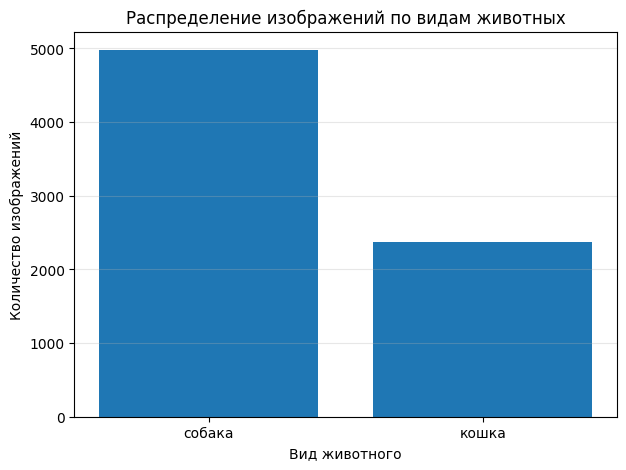

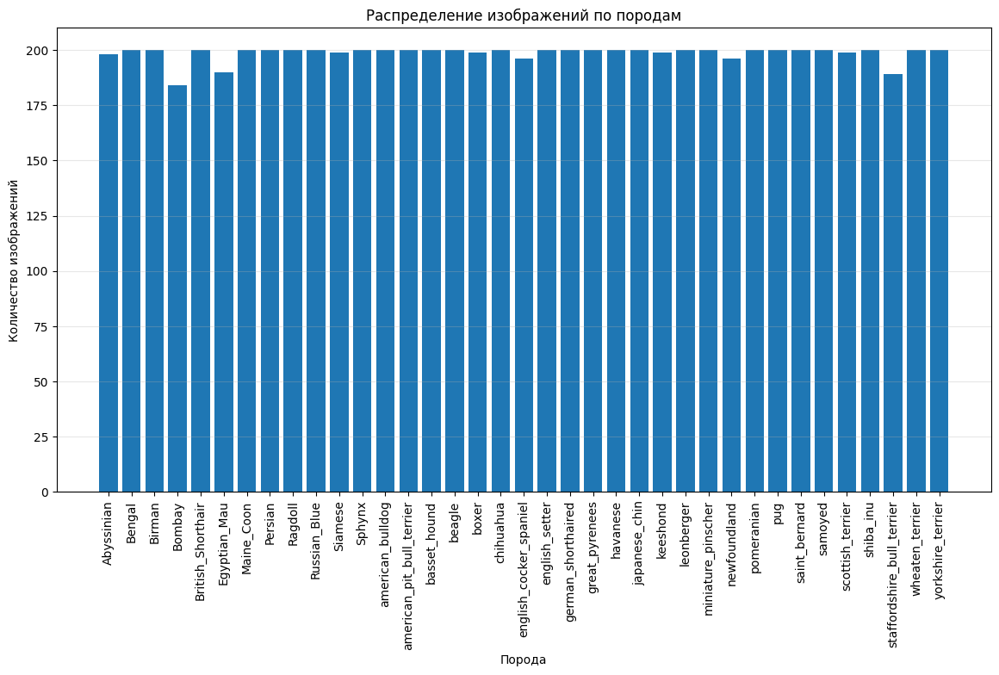

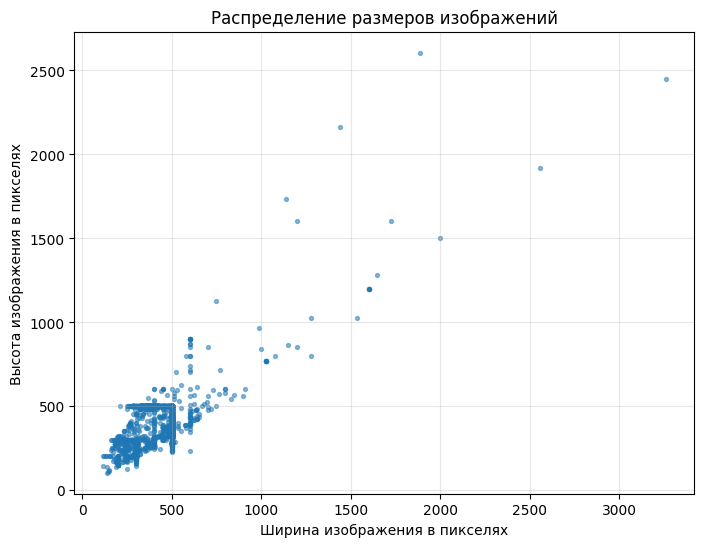

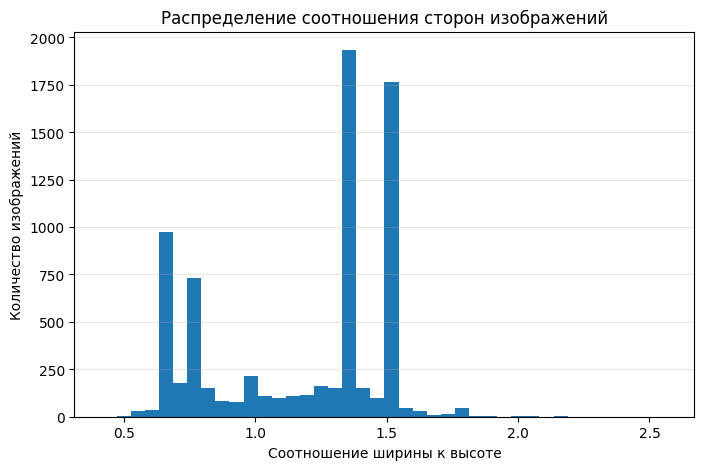

Рисунки сохранены:
/content/image_restoration_experiment/results/figures/species_distribution_second_experiment.png
/content/image_restoration_experiment/results/figures/breed_distribution_second_experiment.png
/content/image_restoration_experiment/results/figures/image_size_distribution_second_experiment.png
/content/image_restoration_experiment/results/figures/aspect_ratio_distribution_second_experiment.png


In [5]:
# Строим рисунок с распределением по видам животных.
plt.figure(figsize=(7, 5))
plt.bar(
    species_distribution["species_name_ru"],
    species_distribution["image_count"]
)
plt.title("Распределение изображений по видам животных")
plt.xlabel("Вид животного")
plt.ylabel("Количество изображений")
plt.grid(axis="y", alpha=0.3)

species_figure_path = FIGURES_DIR / "species_distribution_second_experiment.png"
plt.savefig(species_figure_path, dpi=200, bbox_inches="tight")
plt.show()

# Строим рисунок с распределением по породам.
# Подписи повернуты вертикально, чтобы названия пород не накладывались друг на друга.
breed_for_plot = breed_distribution.sort_values("breed_name")

plt.figure(figsize=(14, 7))
plt.bar(
    breed_for_plot["breed_name"],
    breed_for_plot["image_count"]
)
plt.title("Распределение изображений по породам")
plt.xlabel("Порода")
plt.ylabel("Количество изображений")
plt.xticks(rotation=90)
plt.grid(axis="y", alpha=0.3)

breed_figure_path = FIGURES_DIR / "breed_distribution_second_experiment.png"
plt.savefig(breed_figure_path, dpi=200, bbox_inches="tight")
plt.show()

# Строим рисунок с распределением ширины и высоты.
plt.figure(figsize=(8, 6))
plt.scatter(
    data_table["width"],
    data_table["height"],
    s=8,
    alpha=0.5
)
plt.title("Распределение размеров изображений")
plt.xlabel("Ширина изображения в пикселях")
plt.ylabel("Высота изображения в пикселях")
plt.grid(alpha=0.3)

size_figure_path = FIGURES_DIR / "image_size_distribution_second_experiment.png"
plt.savefig(size_figure_path, dpi=200, bbox_inches="tight")
plt.show()

# Строим рисунок с распределением соотношения сторон.
plt.figure(figsize=(8, 5))
plt.hist(
    data_table["aspect_ratio"],
    bins=40
)
plt.title("Распределение соотношения сторон изображений")
plt.xlabel("Соотношение ширины к высоте")
plt.ylabel("Количество изображений")
plt.grid(axis="y", alpha=0.3)

ratio_figure_path = FIGURES_DIR / "aspect_ratio_distribution_second_experiment.png"
plt.savefig(ratio_figure_path, dpi=200, bbox_inches="tight")
plt.show()

print("Рисунки сохранены:")
print(species_figure_path)
print(breed_figure_path)
print(size_figure_path)
print(ratio_figure_path)

/tmp/ipykernel_3661/906228783.py:6: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda group: group.sample(1, random_state=42))


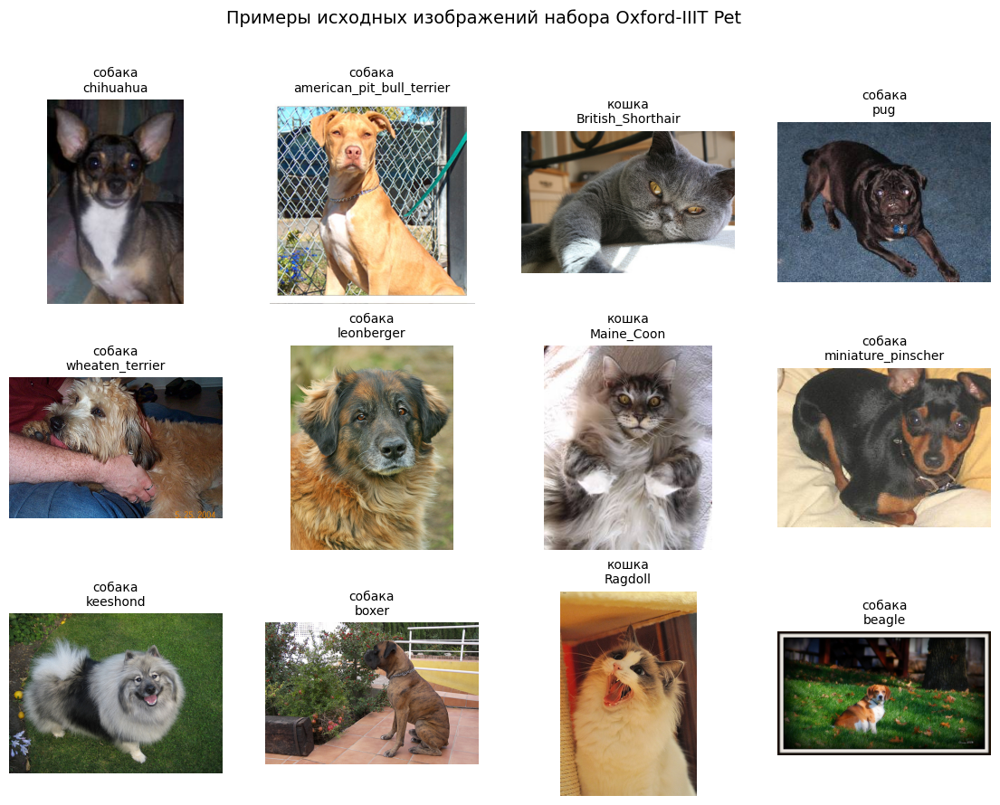

Рисунок с примерами сохранен: /content/image_restoration_experiment/results/examples/source_images_examples_second_experiment.png
Таблица с примерами сохранена: /content/image_restoration_experiment/results/metrics/source_examples_second_experiment.csv


In [6]:
# Выбираем несколько изображений разных пород.
# Используется фиксированное начальное число, чтобы примеры были повторяемыми.
sample_table = (
    data_table
    .groupby("breed_name", group_keys=False)
    .apply(lambda group: group.sample(1, random_state=42))
    .sample(12, random_state=42)
    .reset_index(drop=True)
)

# Создаем сетку изображений.
# Сетка нужна для визуальной проверки разнообразия набора.
rows = 3
cols = 4

plt.figure(figsize=(14, 10))

for index, row in sample_table.iterrows():
    image_path = Path(row["image_path"])

    with Image.open(image_path) as image:
        image = image.convert("RGB")

    plt.subplot(rows, cols, index + 1)
    plt.imshow(image)
    plt.title(row["species_name_ru"] + "\n" + row["breed_name"], fontsize=10)
    plt.axis("off")

plt.suptitle("Примеры исходных изображений набора Oxford-IIIT Pet", fontsize=14)

examples_figure_path = EXAMPLES_DIR / "source_images_examples_second_experiment.png"
plt.savefig(examples_figure_path, dpi=200, bbox_inches="tight")
plt.show()

# Сохраняем таблицу с примерами.
sample_examples_path = METRICS_DIR / "source_examples_second_experiment.csv"
sample_table.to_csv(sample_examples_path, index=False, encoding="utf-8")

print("Рисунок с примерами сохранен:", examples_figure_path)
print("Таблица с примерами сохранена:", sample_examples_path)

In [7]:
# Задаем каталог второго эксперимента на Google Диске.
DRIVE_PROJECT_DIR = Path("/content/drive/MyDrive/image_restoration_experiment")

if DRIVE_PROJECT_DIR.exists():
    drive_metrics_dir = DRIVE_PROJECT_DIR / "metrics"
    drive_figures_dir = DRIVE_PROJECT_DIR / "figures"
    drive_examples_dir = DRIVE_PROJECT_DIR / "figures"
    drive_reports_dir = DRIVE_PROJECT_DIR / "reports"

    drive_metrics_dir.mkdir(parents=True, exist_ok=True)
    drive_figures_dir.mkdir(parents=True, exist_ok=True)
    drive_examples_dir.mkdir(parents=True, exist_ok=True)
    drive_reports_dir.mkdir(parents=True, exist_ok=True)

    files_to_copy = [
        species_distribution_path,
        breed_distribution_path,
        image_size_summary_path,
        processing_config_path,
        species_figure_path,
        breed_figure_path,
        size_figure_path,
        ratio_figure_path,
        examples_figure_path,
        sample_examples_path,
    ]

    for path in files_to_copy:
        path = Path(path)

        if path.exists():
            if path.suffix.lower() == ".png":
                target_dir = drive_figures_dir
            elif path.suffix.lower() == ".json":
                target_dir = drive_reports_dir
            else:
                target_dir = drive_metrics_dir

            shutil.copy2(path, target_dir / path.name)

    print("Результаты этапа 4 сохранены на Google Диск")
    print("Каталог показателей:", drive_metrics_dir)
    print("Каталог рисунков:", drive_figures_dir)
    print("Каталог отчетов:", drive_reports_dir)
else:
    print("Google Диск не найден. Файлы сохранены только в среде выполнения.")

Результаты этапа 4 сохранены на Google Диск
Каталог показателей: /content/drive/MyDrive/image_restoration_experiment/metrics
Каталог рисунков: /content/drive/MyDrive/image_restoration_experiment/figures
Каталог отчетов: /content/drive/MyDrive/image_restoration_experiment/reports


Набор данных пригоден для второго эксперимента: 7349 изображений достаточно для обучения модели восстановления качества, распределение по породам почти равномерное, а наличие изображений разных размеров и соотношений сторон повышает разнообразие обучающего материала. Преобладание собак над кошками не является ошибкой, поскольку задача второго эксперимента связана не с классификацией породы, а с восстановлением качества изображения.

Выбор размера 256 на 256 пикселей обоснован: такой размер снижает нагрузку на графический ускоритель Tesla T4 и позволяет обучать модель в бесплатной среде Google Colab. При этом изображения сохраняют основные контуры, цвета и детали животных, необходимые для оценки качества восстановления. Следующий этап создает самостоятельный набор пар: эталонное изображение и его искусственно ухудшенная версия.

# 5. Формирование набора пар для восстановления качества изображений

На данном этапе исходные изображения преобразуются в экспериментальный набор пар. Для каждого изображения создается эталонная версия единого размера и ухудшенная версия, полученная с помощью контролируемых искажений. Эталонное изображение используется как правильный ответ, а ухудшенное изображение становится входом для будущей нейросетевой модели.

Научная новизна этапа заключается в формировании воспроизводимого набора для задачи восстановления качества. Вместо поиска отдельного набора испорченных изображений создается контролируемая исследовательская среда: одно и то же изображение можно ухудшить разными способами, сохранить параметры ухудшения и затем численно оценить, насколько хорошо модель восстанавливает исходную структуру, цвет и детали.

In [8]:
# Импортируем библиотеки для работы с файлами, таблицами, числами и изображениями.
import json
import math
import shutil
from pathlib import Path
from datetime import datetime

import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from PIL import Image, ImageOps
from skimage.metrics import peak_signal_noise_ratio
from skimage.metrics import structural_similarity

# Повторно задаем основные каталоги.
PROJECT_DIR = Path("/content/image_restoration_experiment")
DATA_DIR = PROJECT_DIR / "data"
RESULTS_DIR = PROJECT_DIR / "results"

PROCESSED_DIR = DATA_DIR / "processed"
ORIGINAL_DIR = PROCESSED_DIR / "original"
DEGRADED_DIR = PROCESSED_DIR / "degraded"

METRICS_DIR = RESULTS_DIR / "metrics"
FIGURES_DIR = RESULTS_DIR / "figures"
EXAMPLES_DIR = RESULTS_DIR / "examples"
REPORTS_DIR = RESULTS_DIR / "reports"
LOGS_DIR = RESULTS_DIR / "logs"

for directory in [
    PROCESSED_DIR,
    ORIGINAL_DIR,
    DEGRADED_DIR,
    METRICS_DIR,
    FIGURES_DIR,
    EXAMPLES_DIR,
    REPORTS_DIR,
    LOGS_DIR,
]:
    directory.mkdir(parents=True, exist_ok=True)

# Загружаем таблицу описания исходных изображений.
dataset_table_path = METRICS_DIR / "dataset_manifest_second_experiment.csv"

if not dataset_table_path.exists():
    raise FileNotFoundError(
        "Не найдена таблица описания данных. Необходимо сначала выполнить этап 3."
    )

data_table = pd.read_csv(dataset_table_path)

# Проверяем наличие обязательных столбцов.
required_columns = [
    "image_id",
    "species_name_ru",
    "breed_name",
    "image_path",
    "image_exists",
    "trimap_exists",
    "width",
    "height",
]

missing_columns = [
    column for column in required_columns
    if column not in data_table.columns
]

if missing_columns:
    raise ValueError(
        "В таблице отсутствуют обязательные столбцы: " + ", ".join(missing_columns)
    )

# Оставляем только пригодные записи.
data_table = data_table[
    (data_table["image_exists"] == True) &
    (data_table["trimap_exists"] == True)
].reset_index(drop=True)

# Задаем рабочий размер изображения.
# Все изображения будут приведены к размеру 256 на 256 пикселей.
IMAGE_SIZE = 256

# Задаем начальное число для повторяемости ухудшений.
SEED = 42
random_generator = np.random.default_rng(SEED)

# Задаем способ изменения размера.
# LANCZOS означает качественный способ пересчета пикселей при изменении размера.
try:
    RESAMPLE_METHOD = Image.Resampling.LANCZOS
except AttributeError:
    RESAMPLE_METHOD = Image.LANCZOS

# Описываем настройки ухудшения изображений.
# Каждому изображению будет случайно назначен один тип ухудшения.
degradation_config = {
    "дата_создания": datetime.now().strftime("%Y-%m-%d %H:%M:%S"),
    "рабочий_размер_изображения": IMAGE_SIZE,
    "начальное_число_для_повторяемости": SEED,
    "пояснение": (
        "Для каждого исходного изображения создается эталонная версия и ухудшенная версия. "
        "Ухудшенная версия используется как вход модели восстановления, а эталонная версия "
        "используется как правильный результат."
    ),
    "типы_ухудшений": {
        "gaussian_noise": "цифровой шум с нормальным распределением",
        "gaussian_blur": "размытие изображения",
        "motion_blur": "размытие движения",
        "jpeg_compression": "следы сжатия изображения в формате jpg",
        "downscale_upscale": "потеря детализации после уменьшения и повторного увеличения",
        "brightness_contrast": "изменение яркости и контрастности",
        "combined": "сочетание нескольких умеренных ухудшений"
    },
    "научное_обоснование": (
        "Контролируемые искажения позволяют получить воспроизводимый набор пар "
        "для оценки нейросетевого восстановления качества изображения."
    )
}

degradation_config_path = REPORTS_DIR / "degradation_config_second_experiment.json"

with open(degradation_config_path, "w", encoding="utf-8") as file:
    json.dump(degradation_config, file, ensure_ascii=False, indent=4)


def prepare_image(image_path, image_size):
    """
    Загружает изображение, переводит его в цветовой вид и приводит к единому размеру.
    Центральное кадрирование означает сохранение центральной области изображения.
    """
    with Image.open(image_path) as image:
        image = image.convert("RGB")

        # ImageOps.fit изменяет размер и берет центральную область.
        # Такой подход дает одинаковую форму входа для нейросетевой модели.
        image = ImageOps.fit(
            image,
            (image_size, image_size),
            method=RESAMPLE_METHOD,
            centering=(0.5, 0.5)
        )

    return np.array(image, dtype=np.uint8)


def add_gaussian_noise(image_array, random_generator):
    """
    Добавляет цифровой шум.
    Шум означает случайные изменения яркости пикселей.
    """
    sigma = float(random_generator.uniform(8.0, 25.0))

    noise = random_generator.normal(
        loc=0.0,
        scale=sigma,
        size=image_array.shape
    )

    degraded = image_array.astype(np.float32) + noise
    degraded = np.clip(degraded, 0, 255).astype(np.uint8)

    parameters = {
        "sigma": round(sigma, 4)
    }

    return degraded, parameters


def add_gaussian_blur(image_array, random_generator):
    """
    Добавляет размытие изображения.
    Размытие снижает четкость границ и мелких деталей.
    """
    kernel_size = int(random_generator.choice([3, 5, 7]))
    sigma = float(random_generator.uniform(0.8, 2.2))

    degraded = cv2.GaussianBlur(
        image_array,
        (kernel_size, kernel_size),
        sigmaX=sigma
    )

    parameters = {
        "kernel_size": kernel_size,
        "sigma": round(sigma, 4)
    }

    return degraded, parameters


def add_motion_blur(image_array, random_generator):
    """
    Добавляет размытие движения.
    Такое искажение имитирует смаз изображения при движении камеры или объекта.
    """
    length = int(random_generator.choice([5, 7, 9, 11, 13]))
    angle = float(random_generator.uniform(0.0, 180.0))

    kernel = np.zeros((length, length), dtype=np.float32)
    kernel[length // 2, :] = 1.0

    center = (length / 2 - 0.5, length / 2 - 0.5)
    rotation_matrix = cv2.getRotationMatrix2D(center, angle, 1.0)

    kernel = cv2.warpAffine(kernel, rotation_matrix, (length, length))
    kernel = kernel / max(kernel.sum(), 1e-8)

    degraded = cv2.filter2D(image_array, -1, kernel)

    parameters = {
        "length": length,
        "angle": round(angle, 4)
    }

    return degraded, parameters


def add_jpeg_compression(image_array, random_generator):
    """
    Добавляет следы сжатия в формате jpg.
    Сжатие может создавать блочные и цветовые артефакты.
    """
    quality = int(random_generator.integers(15, 46))

    success, encoded_image = cv2.imencode(
        ".jpg",
        cv2.cvtColor(image_array, cv2.COLOR_RGB2BGR),
        [int(cv2.IMWRITE_JPEG_QUALITY), quality]
    )

    if not success:
        raise RuntimeError("Не удалось выполнить сжатие изображения")

    decoded_image = cv2.imdecode(encoded_image, cv2.IMREAD_COLOR)
    degraded = cv2.cvtColor(decoded_image, cv2.COLOR_BGR2RGB)

    parameters = {
        "quality": quality
    }

    return degraded, parameters


def add_downscale_upscale(image_array, random_generator):
    """
    Имитирует потерю детализации.
    Изображение сначала уменьшается, затем возвращается к исходному размеру.
    """
    scale = float(random_generator.uniform(0.35, 0.65))

    new_size = max(32, int(IMAGE_SIZE * scale))

    small_image = cv2.resize(
        image_array,
        (new_size, new_size),
        interpolation=cv2.INTER_AREA
    )

    degraded = cv2.resize(
        small_image,
        (IMAGE_SIZE, IMAGE_SIZE),
        interpolation=cv2.INTER_CUBIC
    )

    parameters = {
        "scale": round(scale, 4),
        "small_size": new_size
    }

    return degraded, parameters


def add_brightness_contrast(image_array, random_generator):
    """
    Изменяет яркость и контрастность.
    Яркость отвечает за общую светлоту изображения, контрастность за различимость темных и светлых областей.
    """
    alpha = float(random_generator.uniform(0.65, 1.35))
    beta = float(random_generator.uniform(-35.0, 35.0))

    degraded = image_array.astype(np.float32) * alpha + beta
    degraded = np.clip(degraded, 0, 255).astype(np.uint8)

    parameters = {
        "alpha": round(alpha, 4),
        "beta": round(beta, 4)
    }

    return degraded, parameters


def add_combined_degradation(image_array, random_generator):
    """
    Создает комбинированное ухудшение.
    Изображение последовательно проходит через потерю детализации, сжатие и слабый шум.
    """
    degraded, first_parameters = add_downscale_upscale(image_array, random_generator)
    degraded, second_parameters = add_jpeg_compression(degraded, random_generator)

    sigma = float(random_generator.uniform(4.0, 12.0))
    noise = random_generator.normal(
        loc=0.0,
        scale=sigma,
        size=degraded.shape
    )

    degraded = degraded.astype(np.float32) + noise
    degraded = np.clip(degraded, 0, 255).astype(np.uint8)

    parameters = {
        "downscale_upscale": first_parameters,
        "jpeg_compression": second_parameters,
        "noise_sigma": round(sigma, 4)
    }

    return degraded, parameters


def create_degraded_image(image_array, degradation_type, random_generator):
    """
    Создает ухудшенную версию изображения по заданному типу искажения.
    """
    if degradation_type == "gaussian_noise":
        return add_gaussian_noise(image_array, random_generator)

    if degradation_type == "gaussian_blur":
        return add_gaussian_blur(image_array, random_generator)

    if degradation_type == "motion_blur":
        return add_motion_blur(image_array, random_generator)

    if degradation_type == "jpeg_compression":
        return add_jpeg_compression(image_array, random_generator)

    if degradation_type == "downscale_upscale":
        return add_downscale_upscale(image_array, random_generator)

    if degradation_type == "brightness_contrast":
        return add_brightness_contrast(image_array, random_generator)

    if degradation_type == "combined":
        return add_combined_degradation(image_array, random_generator)

    raise ValueError("Неизвестный тип ухудшения: " + str(degradation_type))


def calculate_pair_metrics(original_array, degraded_array):
    """
    Рассчитывает начальное качество ухудшенного изображения относительно эталона.
    Эти показатели показывают, насколько сложной стала задача восстановления.
    """
    psnr_value = peak_signal_noise_ratio(
        original_array,
        degraded_array,
        data_range=255
    )

    ssim_value = structural_similarity(
        original_array,
        degraded_array,
        channel_axis=-1,
        data_range=255
    )

    mae_value = float(
        np.mean(np.abs(original_array.astype(np.float32) - degraded_array.astype(np.float32)))
    )

    mse_value = float(
        np.mean((original_array.astype(np.float32) - degraded_array.astype(np.float32)) ** 2)
    )

    return {
        "degraded_psnr": float(psnr_value),
        "degraded_ssim": float(ssim_value),
        "degraded_mae": mae_value,
        "degraded_mse": mse_value
    }


# Задаем типы ухудшений.
degradation_types = [
    "gaussian_noise",
    "gaussian_blur",
    "motion_blur",
    "jpeg_compression",
    "downscale_upscale",
    "brightness_contrast",
    "combined",
]

# Формируем записи нового набора.
manifest_rows = []

total_images = len(data_table)

print("Начато формирование пар изображений")
print("Количество исходных изображений:", total_images)
print("Рабочий размер:", str(IMAGE_SIZE) + " на " + str(IMAGE_SIZE) + " пикселей")

for row_index, row in data_table.iterrows():
    image_id = str(row["image_id"])
    source_image_path = Path(row["image_path"])

    # Выбираем тип ухудшения случайно, но воспроизводимо.
    degradation_type = str(random_generator.choice(degradation_types))

    # Загружаем и подготавливаем эталонное изображение.
    original_array = prepare_image(source_image_path, IMAGE_SIZE)

    # Создаем ухудшенную версию.
    degraded_array, degradation_parameters = create_degraded_image(
        original_array,
        degradation_type,
        random_generator
    )

    # Рассчитываем начальные показатели качества ухудшения.
    pair_metrics = calculate_pair_metrics(original_array, degraded_array)

    # Задаем имена файлов.
    original_filename = image_id + "_original_256.jpg"
    degraded_filename = image_id + "_degraded_256.jpg"

    original_output_path = ORIGINAL_DIR / original_filename
    degraded_output_path = DEGRADED_DIR / degraded_filename

    # Сохраняем эталонное и ухудшенное изображения.
    # Качество 95 снижает повторные потери при сохранении.
    Image.fromarray(original_array).save(original_output_path, quality=95)
    Image.fromarray(degraded_array).save(degraded_output_path, quality=95)

    manifest_rows.append({
        "image_id": image_id,
        "species_name_ru": row["species_name_ru"],
        "breed_name": row["breed_name"],
        "source_image_path": str(source_image_path),
        "original_image_path": str(original_output_path),
        "degraded_image_path": str(degraded_output_path),
        "degradation_type": degradation_type,
        "degradation_parameters": json.dumps(degradation_parameters, ensure_ascii=False),
        "original_width": int(row["width"]),
        "original_height": int(row["height"]),
        "prepared_width": IMAGE_SIZE,
        "prepared_height": IMAGE_SIZE,
        **pair_metrics
    })

    # Печатаем ход выполнения каждые 500 изображений.
    if (row_index + 1) % 500 == 0:
        print("Обработано изображений:", row_index + 1, "из", total_images)

# Создаем таблицу нового набора.
restoration_manifest = pd.DataFrame(manifest_rows)

# Сохраняем таблицу с парами изображений.
restoration_manifest_path = METRICS_DIR / "restoration_manifest_second_experiment.csv"
restoration_manifest.to_csv(restoration_manifest_path, index=False, encoding="utf-8")

# Формируем сводку по созданному набору.
degradation_distribution = (
    restoration_manifest
    .groupby("degradation_type")
    .size()
    .reset_index(name="image_count")
    .sort_values("degradation_type")
)

degradation_distribution_path = METRICS_DIR / "degradation_distribution_second_experiment.csv"
degradation_distribution.to_csv(degradation_distribution_path, index=False, encoding="utf-8")

degradation_metrics_summary = (
    restoration_manifest
    .groupby("degradation_type")[["degraded_psnr", "degraded_ssim", "degraded_mae", "degraded_mse"]]
    .agg(["mean", "std", "min", "max"])
)

degradation_metrics_summary_path = METRICS_DIR / "degradation_metrics_summary_second_experiment.csv"
degradation_metrics_summary.to_csv(degradation_metrics_summary_path, encoding="utf-8")

dataset_pair_summary = {
    "дата_создания": datetime.now().strftime("%Y-%m-%d %H:%M:%S"),
    "количество_пар_изображений": int(len(restoration_manifest)),
    "рабочий_размер_изображения": IMAGE_SIZE,
    "каталог_эталонных_изображений": str(ORIGINAL_DIR),
    "каталог_ухудшенных_изображений": str(DEGRADED_DIR),
    "среднее_psnr_ухудшенных_изображений": float(restoration_manifest["degraded_psnr"].mean()),
    "среднее_ssim_ухудшенных_изображений": float(restoration_manifest["degraded_ssim"].mean()),
    "среднее_mae_ухудшенных_изображений": float(restoration_manifest["degraded_mae"].mean()),
    "пояснение": (
        "Показатели рассчитаны между эталонными и ухудшенными изображениями. "
        "Они описывают исходную сложность задачи восстановления."
    )
}

dataset_pair_summary_path = METRICS_DIR / "restoration_pair_summary_second_experiment.json"

with open(dataset_pair_summary_path, "w", encoding="utf-8") as file:
    json.dump(dataset_pair_summary, file, ensure_ascii=False, indent=4)

print("\nФормирование пар завершено")
print("Таблица пар сохранена:", restoration_manifest_path)
print("Сводка по типам ухудшений сохранена:", degradation_distribution_path)
print("Сводка качества ухудшений сохранена:", degradation_metrics_summary_path)
print("Общая сводка сохранена:", dataset_pair_summary_path)

print("\nРаспределение по типам ухудшений:")
display(degradation_distribution)

print("\nПервые строки таблицы пар:")
display(restoration_manifest.head())

print("\nОбщая сводка:")
for key, value in dataset_pair_summary.items():
    print(key + ":", value)

Начато формирование пар изображений
Количество исходных изображений: 7349
Рабочий размер: 256 на 256 пикселей
Обработано изображений: 500 из 7349
Обработано изображений: 1000 из 7349
Обработано изображений: 1500 из 7349
Обработано изображений: 2000 из 7349
Обработано изображений: 2500 из 7349
Обработано изображений: 3000 из 7349
Обработано изображений: 3500 из 7349
Обработано изображений: 4000 из 7349
Обработано изображений: 4500 из 7349
Обработано изображений: 5000 из 7349
Обработано изображений: 5500 из 7349
Обработано изображений: 6000 из 7349
Обработано изображений: 6500 из 7349
Обработано изображений: 7000 из 7349

Формирование пар завершено
Таблица пар сохранена: /content/image_restoration_experiment/results/metrics/restoration_manifest_second_experiment.csv
Сводка по типам ухудшений сохранена: /content/image_restoration_experiment/results/metrics/degradation_distribution_second_experiment.csv
Сводка качества ухудшений сохранена: /content/image_restoration_experiment/results/metr

,degradation_type,image_count
0,brightness_contrast,1034
1,combined,1027
2,downscale_upscale,1040
3,gaussian_blur,1075
4,gaussian_noise,1078
5,jpeg_compression,1048
6,motion_blur,1047



Первые строки таблицы пар:


,image_id,species_name_ru,breed_name,source_image_path,original_image_path,degraded_image_path,degradation_type,degradation_parameters,original_width,original_height,prepared_width,prepared_height,degraded_psnr,degraded_ssim,degraded_mae,degraded_mse
0,Abyssinian_100,кошка,Abyssinian,/content/image_restoration_experiment/data/raw...,/content/image_restoration_experiment/data/pro...,/content/image_restoration_experiment/data/pro...,gaussian_noise,"{""sigma"": 15.4609}",394,500,256,256,24.844190,0.562355,11.446544,213.138245
1,Abyssinian_101,кошка,Abyssinian,/content/image_restoration_experiment/data/raw...,/content/image_restoration_experiment/data/pro...,/content/image_restoration_experiment/data/pro...,brightness_contrast,"{""alpha"": 0.8573, ""beta"": -4.7921}",450,313,256,256,20.308634,0.953178,21.506821,605.643433
2,Abyssinian_102,кошка,Abyssinian,/content/image_restoration_experiment/data/raw...,/content/image_restoration_experiment/data/pro...,/content/image_restoration_experiment/data/pro...,combined,"{""downscale_upscale"": {""scale"": 0.4982, ""small...",500,465,256,256,24.729900,0.609870,11.002019,218.821671
3,Abyssinian_103,кошка,Abyssinian,/content/image_restoration_experiment/data/raw...,/content/image_restoration_experiment/data/pro...,/content/image_restoration_experiment/data/pro...,combined,"{""downscale_upscale"": {""scale"": 0.5086, ""small...",500,351,256,256,24.187842,0.469000,11.970032,247.911240
4,Abyssinian_104,кошка,Abyssinian,/content/image_restoration_experiment/data/raw...,/content/image_restoration_experiment/data/pro...,/content/image_restoration_experiment/data/pro...,downscale_upscale,"{""scale"": 0.5108, ""small_size"": 130}",600,363,256,256,33.419996,0.939492,3.129817,29.585627



Общая сводка:
дата_создания: 2026-05-04 13:41:32
количество_пар_изображений: 7349
рабочий_размер_изображения: 256
каталог_эталонных_изображений: /content/image_restoration_experiment/data/processed/original
каталог_ухудшенных_изображений: /content/image_restoration_experiment/data/processed/degraded
среднее_psnr_ухудшенных_изображений: 26.69064020291366
среднее_ssim_ухудшенных_изображений: 0.7664343161988618
среднее_mae_ухудшенных_изображений: 10.55927097631127
пояснение: Показатели рассчитаны между эталонными и ухудшенными изображениями. Они описывают исходную сложность задачи восстановления.


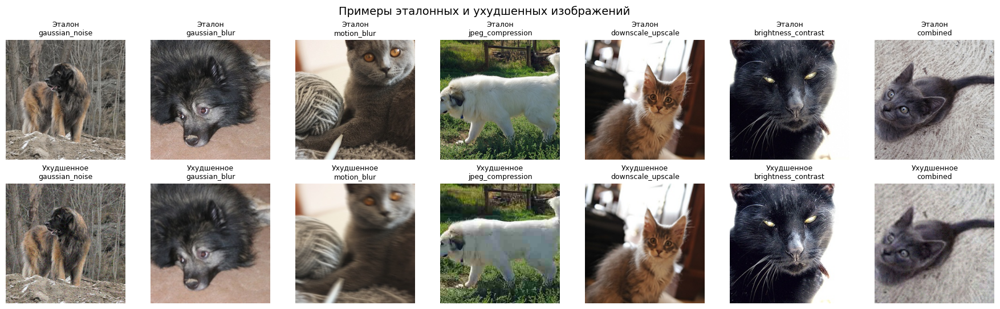

Рисунок с примерами ухудшений сохранен: /content/image_restoration_experiment/results/examples/degradation_examples_second_experiment.png
Таблица с примерами ухудшений сохранена: /content/image_restoration_experiment/results/metrics/degradation_examples_second_experiment.csv


In [9]:
# Выбираем по одному примеру для каждого типа ухудшения.
example_rows = []

for degradation_type in degradation_types:
    subset = restoration_manifest[
        restoration_manifest["degradation_type"] == degradation_type
    ]

    if len(subset) > 0:
        example_rows.append(subset.sample(1, random_state=42).iloc[0])

example_table = pd.DataFrame(example_rows).reset_index(drop=True)

# Строим рисунок.
# В верхней строке находятся эталонные изображения, в нижней ухудшенные.
cols = len(example_table)
rows = 2

plt.figure(figsize=(3.2 * cols, 6))

for index, row in example_table.iterrows():
    original_image = Image.open(row["original_image_path"]).convert("RGB")
    degraded_image = Image.open(row["degraded_image_path"]).convert("RGB")

    plt.subplot(rows, cols, index + 1)
    plt.imshow(original_image)
    plt.title("Эталон\n" + row["degradation_type"], fontsize=9)
    plt.axis("off")

    plt.subplot(rows, cols, cols + index + 1)
    plt.imshow(degraded_image)
    plt.title("Ухудшенное\n" + row["degradation_type"], fontsize=9)
    plt.axis("off")

plt.suptitle("Примеры эталонных и ухудшенных изображений", fontsize=14)

degradation_examples_path = EXAMPLES_DIR / "degradation_examples_second_experiment.png"
plt.savefig(degradation_examples_path, dpi=200, bbox_inches="tight")
plt.show()

# Сохраняем таблицу с примерами.
degradation_examples_table_path = METRICS_DIR / "degradation_examples_second_experiment.csv"
example_table.to_csv(degradation_examples_table_path, index=False, encoding="utf-8")

print("Рисунок с примерами ухудшений сохранен:", degradation_examples_path)
print("Таблица с примерами ухудшений сохранена:", degradation_examples_table_path)

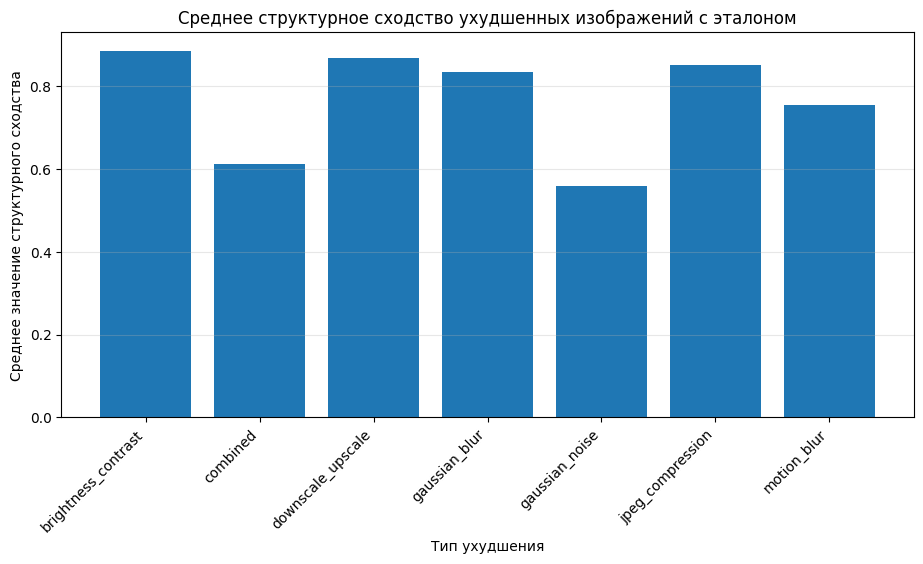

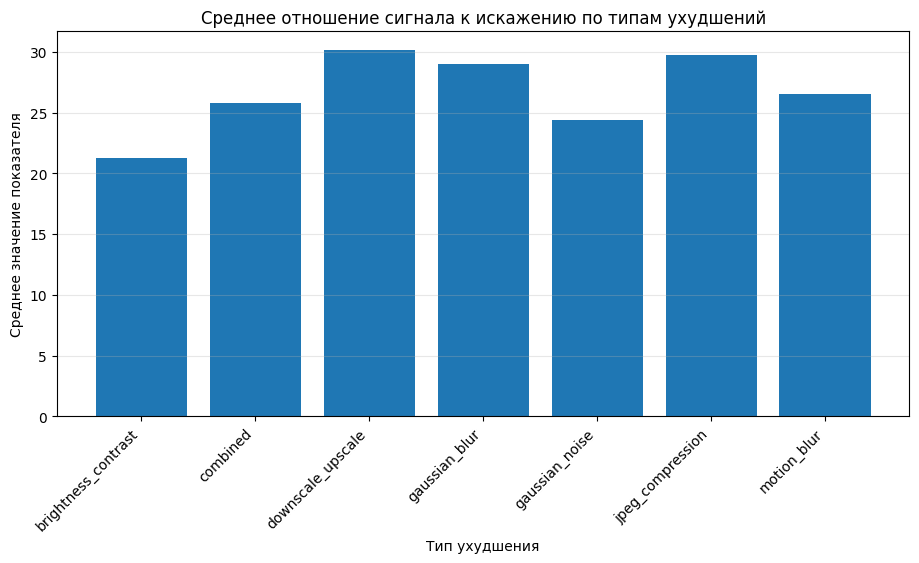

Рисунки сложности ухудшений сохранены:
/content/image_restoration_experiment/results/figures/degraded_ssim_by_type_second_experiment.png
/content/image_restoration_experiment/results/figures/degraded_psnr_by_type_second_experiment.png

Средние показатели по типам ухудшений:


,degradation_type,degraded_psnr,degraded_ssim,degraded_mae
0,brightness_contrast,21.241649,0.886168,25.179416
1,combined,25.762976,0.611900,10.111262
2,downscale_upscale,30.153921,0.869632,5.413026
3,gaussian_blur,28.965372,0.835069,6.223341
4,gaussian_noise,24.354794,0.559450,12.797409
5,jpeg_compression,29.740799,0.852053,6.298072
6,motion_blur,26.558160,0.754205,8.084695


In [10]:
# Строим среднее значение показателя SSIM по типам ухудшений.
# SSIM показывает сохранение структуры изображения.
# Чем ближе значение к единице, тем сильнее ухудшенное изображение похоже на эталон.
mean_metrics_by_type = (
    restoration_manifest
    .groupby("degradation_type")[["degraded_psnr", "degraded_ssim", "degraded_mae"]]
    .mean()
    .reset_index()
    .sort_values("degradation_type")
)

plt.figure(figsize=(11, 5))
plt.bar(
    mean_metrics_by_type["degradation_type"],
    mean_metrics_by_type["degraded_ssim"]
)
plt.title("Среднее структурное сходство ухудшенных изображений с эталоном")
plt.xlabel("Тип ухудшения")
plt.ylabel("Среднее значение структурного сходства")
plt.xticks(rotation=45, ha="right")
plt.grid(axis="y", alpha=0.3)

ssim_by_type_path = FIGURES_DIR / "degraded_ssim_by_type_second_experiment.png"
plt.savefig(ssim_by_type_path, dpi=200, bbox_inches="tight")
plt.show()

plt.figure(figsize=(11, 5))
plt.bar(
    mean_metrics_by_type["degradation_type"],
    mean_metrics_by_type["degraded_psnr"]
)
plt.title("Среднее отношение сигнала к искажению по типам ухудшений")
plt.xlabel("Тип ухудшения")
plt.ylabel("Среднее значение показателя")
plt.xticks(rotation=45, ha="right")
plt.grid(axis="y", alpha=0.3)

psnr_by_type_path = FIGURES_DIR / "degraded_psnr_by_type_second_experiment.png"
plt.savefig(psnr_by_type_path, dpi=200, bbox_inches="tight")
plt.show()

print("Рисунки сложности ухудшений сохранены:")
print(ssim_by_type_path)
print(psnr_by_type_path)

print("\nСредние показатели по типам ухудшений:")
display(mean_metrics_by_type)

In [11]:
# Задаем каталог второго эксперимента на Google Диске.
DRIVE_PROJECT_DIR = Path("/content/drive/MyDrive/image_restoration_experiment")

if DRIVE_PROJECT_DIR.exists():
    drive_metrics_dir = DRIVE_PROJECT_DIR / "metrics"
    drive_figures_dir = DRIVE_PROJECT_DIR / "figures"
    drive_reports_dir = DRIVE_PROJECT_DIR / "reports"

    drive_metrics_dir.mkdir(parents=True, exist_ok=True)
    drive_figures_dir.mkdir(parents=True, exist_ok=True)
    drive_reports_dir.mkdir(parents=True, exist_ok=True)

    files_to_copy = [
        restoration_manifest_path,
        degradation_distribution_path,
        degradation_metrics_summary_path,
        dataset_pair_summary_path,
        degradation_config_path,
        degradation_examples_path,
        degradation_examples_table_path,
        ssim_by_type_path,
        psnr_by_type_path,
    ]

    for path in files_to_copy:
        path = Path(path)

        if path.exists():
            if path.suffix.lower() == ".png":
                target_dir = drive_figures_dir
            elif path.suffix.lower() == ".json":
                target_dir = drive_reports_dir
            else:
                target_dir = drive_metrics_dir

            shutil.copy2(path, target_dir / path.name)

    print("Результаты этапа 5 сохранены на Google Диск")
    print("Каталог показателей:", drive_metrics_dir)
    print("Каталог рисунков:", drive_figures_dir)
    print("Каталог отчетов:", drive_reports_dir)
else:
    print("Google Диск не найден. Файлы сохранены только в среде выполнения.")

Результаты этапа 5 сохранены на Google Диск
Каталог показателей: /content/drive/MyDrive/image_restoration_experiment/metrics
Каталог рисунков: /content/drive/MyDrive/image_restoration_experiment/figures
Каталог отчетов: /content/drive/MyDrive/image_restoration_experiment/reports


Сформировано 7349 пар изображений, где для каждого эталонного изображения создана ухудшенная версия размером 256 на 256 пикселей. Распределение по типам ухудшений получилось достаточно ровным: каждый тип представлен примерно одной тысячей примеров, что важно для последующего обучения модели восстановления без смещения в сторону одного вида искажения.

Средние показатели подтверждают, что задача восстановления получилась содержательной. Наиболее сложными оказались цифровой шум и комбинированное ухудшение: у них самое низкое структурное сходство с эталоном. Изменение яркости и контрастности сохраняет структуру лучше, но дает заметную ошибку по яркости, поэтому тоже полезно для обучения. Набор пар подходит для дальнейшего разделения на обучающую, проверочную и контрольную части.

# 6. Разделение набора на обучающую, проверочную и контрольную части

На данном этапе сформированный набор пар разделяется на три независимые части. Обучающая часть будет использоваться для настройки весов нейросетевой модели, проверочная часть потребуется для выбора лучшего состояния модели во время обучения, а контрольная часть будет применяться только для итоговой оценки качества восстановления.

Научная новизна этапа связана с корректной организацией экспериментальной проверки. Разделение выполняется с учетом пород животных, чтобы каждая часть сохраняла разнообразие исходного набора. Такой подход снижает риск случайного завышения качества и позволяет объективнее оценить способность модели восстанавливать изображения разных животных, а не только запоминать отдельные примеры.

In [12]:
# Импортируем библиотеки для работы с файлами, таблицами, числами и сохранением результатов.
import json
import shutil
from pathlib import Path
from datetime import datetime

import numpy as np
import pandas as pd

# Повторно задаем основные каталоги.
PROJECT_DIR = Path("/content/image_restoration_experiment")
DATA_DIR = PROJECT_DIR / "data"
RESULTS_DIR = PROJECT_DIR / "results"

PROCESSED_DIR = DATA_DIR / "processed"
METRICS_DIR = RESULTS_DIR / "metrics"
REPORTS_DIR = RESULTS_DIR / "reports"

TRAIN_DIR = PROCESSED_DIR / "train"
VALID_DIR = PROCESSED_DIR / "valid"
TEST_DIR = PROCESSED_DIR / "test"

for directory in [
    PROCESSED_DIR,
    METRICS_DIR,
    REPORTS_DIR,
    TRAIN_DIR,
    VALID_DIR,
    TEST_DIR,
]:
    directory.mkdir(parents=True, exist_ok=True)

# Загружаем таблицу пар изображений, созданную на предыдущем этапе.
restoration_manifest_path = METRICS_DIR / "restoration_manifest_second_experiment.csv"

if not restoration_manifest_path.exists():
    raise FileNotFoundError(
        "Не найдена таблица пар изображений. Необходимо сначала выполнить этап 5."
    )

restoration_table = pd.read_csv(restoration_manifest_path)

# Проверяем наличие обязательных столбцов.
required_columns = [
    "image_id",
    "species_name_ru",
    "breed_name",
    "original_image_path",
    "degraded_image_path",
    "degradation_type",
    "prepared_width",
    "prepared_height",
    "degraded_psnr",
    "degraded_ssim",
    "degraded_mae",
]

missing_columns = [
    column for column in required_columns
    if column not in restoration_table.columns
]

if missing_columns:
    raise ValueError(
        "В таблице отсутствуют обязательные столбцы: " + ", ".join(missing_columns)
    )

# Проверяем существование файлов эталонных и ухудшенных изображений.
restoration_table["original_file_exists"] = restoration_table["original_image_path"].apply(
    lambda value: Path(value).exists()
)

restoration_table["degraded_file_exists"] = restoration_table["degraded_image_path"].apply(
    lambda value: Path(value).exists()
)

# Оставляем только записи, для которых оба файла существуют.
restoration_table = restoration_table[
    (restoration_table["original_file_exists"] == True) &
    (restoration_table["degraded_file_exists"] == True)
].reset_index(drop=True)

if len(restoration_table) == 0:
    raise RuntimeError(
        "После проверки файлов не осталось пригодных записей."
    )

# Задаем начальное число для повторяемости разделения.
SEED = 42
random_generator = np.random.default_rng(SEED)

# Задаем доли частей набора.
# Обучающая часть используется для обучения модели.
# Проверочная часть используется для выбора лучшей модели.
# Контрольная часть используется только для итоговой оценки.
TRAIN_SHARE = 0.70
VALID_SHARE = 0.15
TEST_SHARE = 0.15

# Проверяем корректность долей.
share_sum = TRAIN_SHARE + VALID_SHARE + TEST_SHARE

if abs(share_sum - 1.0) > 1e-8:
    raise ValueError(
        "Сумма долей обучающей, проверочной и контрольной частей должна быть равна единице."
    )

# Создаем список частей для каждой записи.
# Разделение выполняется отдельно внутри каждой породы.
# Это помогает сохранить разнообразие пород во всех частях набора.
split_parts = []

for breed_name, group in restoration_table.groupby("breed_name"):
    group_indices = group.index.to_numpy()
    random_generator.shuffle(group_indices)

    group_size = len(group_indices)

    train_count = int(round(group_size * TRAIN_SHARE))
    valid_count = int(round(group_size * VALID_SHARE))

    # Защищаемся от ситуации, когда из-за округления сумма стала больше размера группы.
    if train_count + valid_count > group_size:
        valid_count = max(0, group_size - train_count)

    test_count = group_size - train_count - valid_count

    train_indices = group_indices[:train_count]
    valid_indices = group_indices[train_count:train_count + valid_count]
    test_indices = group_indices[train_count + valid_count:]

    for index in train_indices:
        split_parts.append({
            "row_index": int(index),
            "split_name": "обучающая"
        })

    for index in valid_indices:
        split_parts.append({
            "row_index": int(index),
            "split_name": "проверочная"
        })

    for index in test_indices:
        split_parts.append({
            "row_index": int(index),
            "split_name": "контрольная"
        })

# Добавляем название части в основную таблицу.
split_table = pd.DataFrame(split_parts)

restoration_table = restoration_table.merge(
    split_table,
    left_index=True,
    right_on="row_index",
    how="left"
).drop(columns=["row_index"])

# Проверяем, что для всех записей назначена часть.
if restoration_table["split_name"].isna().any():
    raise RuntimeError(
        "Для части записей не удалось назначить принадлежность к выборке."
    )

# Создаем отдельные таблицы.
train_table = restoration_table[
    restoration_table["split_name"] == "обучающая"
].reset_index(drop=True)

valid_table = restoration_table[
    restoration_table["split_name"] == "проверочная"
].reset_index(drop=True)

test_table = restoration_table[
    restoration_table["split_name"] == "контрольная"
].reset_index(drop=True)

# Сохраняем полную таблицу с разметкой частей.
restoration_split_manifest_path = METRICS_DIR / "restoration_split_manifest_second_experiment.csv"
train_split_path = METRICS_DIR / "train_split_second_experiment.csv"
valid_split_path = METRICS_DIR / "valid_split_second_experiment.csv"
test_split_path = METRICS_DIR / "test_split_second_experiment.csv"

restoration_table.to_csv(restoration_split_manifest_path, index=False, encoding="utf-8")
train_table.to_csv(train_split_path, index=False, encoding="utf-8")
valid_table.to_csv(valid_split_path, index=False, encoding="utf-8")
test_table.to_csv(test_split_path, index=False, encoding="utf-8")

# Формируем сводку по частям набора.
split_distribution = (
    restoration_table
    .groupby("split_name")
    .size()
    .reset_index(name="image_pair_count")
    .sort_values("split_name")
)

split_species_distribution = (
    restoration_table
    .groupby(["split_name", "species_name_ru"])
    .size()
    .reset_index(name="image_pair_count")
    .sort_values(["split_name", "species_name_ru"])
)

split_degradation_distribution = (
    restoration_table
    .groupby(["split_name", "degradation_type"])
    .size()
    .reset_index(name="image_pair_count")
    .sort_values(["split_name", "degradation_type"])
)

split_breed_distribution = (
    restoration_table
    .groupby(["split_name", "breed_name"])
    .size()
    .reset_index(name="image_pair_count")
    .sort_values(["split_name", "breed_name"])
)

# Сохраняем сводные таблицы.
split_distribution_path = METRICS_DIR / "split_distribution_second_experiment.csv"
split_species_distribution_path = METRICS_DIR / "split_species_distribution_second_experiment.csv"
split_degradation_distribution_path = METRICS_DIR / "split_degradation_distribution_second_experiment.csv"
split_breed_distribution_path = METRICS_DIR / "split_breed_distribution_second_experiment.csv"

split_distribution.to_csv(split_distribution_path, index=False, encoding="utf-8")
split_species_distribution.to_csv(split_species_distribution_path, index=False, encoding="utf-8")
split_degradation_distribution.to_csv(split_degradation_distribution_path, index=False, encoding="utf-8")
split_breed_distribution.to_csv(split_breed_distribution_path, index=False, encoding="utf-8")

# Рассчитываем средние показатели исходной сложности по частям.
split_quality_summary = (
    restoration_table
    .groupby("split_name")[["degraded_psnr", "degraded_ssim", "degraded_mae"]]
    .agg(["mean", "std", "min", "max"])
)

split_quality_summary_path = METRICS_DIR / "split_quality_summary_second_experiment.csv"
split_quality_summary.to_csv(split_quality_summary_path, encoding="utf-8")

# Формируем общий паспорт разделения.
split_summary = {
    "дата_создания": datetime.now().strftime("%Y-%m-%d %H:%M:%S"),
    "количество_всех_пар": int(len(restoration_table)),
    "количество_обучающих_пар": int(len(train_table)),
    "количество_проверочных_пар": int(len(valid_table)),
    "количество_контрольных_пар": int(len(test_table)),
    "доля_обучающей_части": round(len(train_table) / len(restoration_table), 4),
    "доля_проверочной_части": round(len(valid_table) / len(restoration_table), 4),
    "доля_контрольной_части": round(len(test_table) / len(restoration_table), 4),
    "количество_пород_в_обучающей_части": int(train_table["breed_name"].nunique()),
    "количество_пород_в_проверочной_части": int(valid_table["breed_name"].nunique()),
    "количество_пород_в_контрольной_части": int(test_table["breed_name"].nunique()),
    "начальное_число_для_повторяемости": SEED,
    "способ_разделения": (
        "Разделение выполнено отдельно внутри каждой породы. "
        "Это сохраняет породное разнообразие во всех частях набора."
    )
}

split_summary_path = REPORTS_DIR / "split_summary_second_experiment.json"

with open(split_summary_path, "w", encoding="utf-8") as file:
    json.dump(split_summary, file, ensure_ascii=False, indent=4)

# Выводим результаты этапа.
print("Разделение набора завершено")
print("Полная таблица с частями сохранена:", restoration_split_manifest_path)
print("Обучающая часть сохранена:", train_split_path)
print("Проверочная часть сохранена:", valid_split_path)
print("Контрольная часть сохранена:", test_split_path)
print("Паспорт разделения сохранен:", split_summary_path)

print("\nСводка по частям:")
display(split_distribution)

print("\nСводка по видам животных:")
display(split_species_distribution)

print("\nСводка по типам ухудшений:")
display(split_degradation_distribution)

print("\nСредние показатели исходной сложности по частям:")
display(split_quality_summary)

print("\nПаспорт разделения:")
for key, value in split_summary.items():
    print(key + ":", value)

Разделение набора завершено
Полная таблица с частями сохранена: /content/image_restoration_experiment/results/metrics/restoration_split_manifest_second_experiment.csv
Обучающая часть сохранена: /content/image_restoration_experiment/results/metrics/train_split_second_experiment.csv
Проверочная часть сохранена: /content/image_restoration_experiment/results/metrics/valid_split_second_experiment.csv
Контрольная часть сохранена: /content/image_restoration_experiment/results/metrics/test_split_second_experiment.csv
Паспорт разделения сохранен: /content/image_restoration_experiment/results/reports/split_summary_second_experiment.json

Сводка по частям:


,split_name,image_pair_count
0,контрольная,1104
1,обучающая,5143
2,проверочная,1102



Сводка по видам животных:


,split_name,species_name_ru,image_pair_count
0,контрольная,кошка,355
1,контрольная,собака,749
2,обучающая,кошка,1660
3,обучающая,собака,3483
4,проверочная,кошка,356
5,проверочная,собака,746



Сводка по типам ухудшений:


,split_name,degradation_type,image_pair_count
0,контрольная,brightness_contrast,152
1,контрольная,combined,132
2,контрольная,downscale_upscale,167
3,контрольная,gaussian_blur,142
4,контрольная,gaussian_noise,181
5,контрольная,jpeg_compression,178
6,контрольная,motion_blur,152
7,обучающая,brightness_contrast,751
8,обучающая,combined,748
9,обучающая,downscale_upscale,735



Средние показатели исходной сложности по частям:


degraded_psnr                                 degraded_ssim  \
                     mean       std        min        max          mean   
split_name                                                                
контрольная     26.654245  4.911752  11.571553  46.212299      0.765298   
обучающая       26.637708  4.950496   9.145672  50.576342      0.767761   
проверочная     26.974136  4.823248  10.533948  47.886099      0.761381   

                                          degraded_mae                      \
                  std       min       max         mean       std       min   
split_name                                                                   
контрольная  0.162921  0.235480  0.999761    10.630016  9.194084  0.885295   
обучающая    0.160661  0.169467  0.999878    10.672864  9.484027  0.551758   
проверочная  0.163927  0.219056  0.999573     9.958264  8.072548  0.902695   

                        
                   max  
split_name              
контрольная  64.065475  
обучающая    82.041245  
проверочная  70.707787


Паспорт разделения:
дата_создания: 2026-05-04 13:47:46
количество_всех_пар: 7349
количество_обучающих_пар: 5143
количество_проверочных_пар: 1102
количество_контрольных_пар: 1104
доля_обучающей_части: 0.6998
доля_проверочной_части: 0.15
доля_контрольной_части: 0.1502
количество_пород_в_обучающей_части: 37
количество_пород_в_проверочной_части: 37
количество_пород_в_контрольной_части: 37
начальное_число_для_повторяемости: 42
способ_разделения: Разделение выполнено отдельно внутри каждой породы. Это сохраняет породное разнообразие во всех частях набора.


In [13]:
# Получаем множества идентификаторов изображений для каждой части.
train_ids = set(train_table["image_id"].tolist())
valid_ids = set(valid_table["image_id"].tolist())
test_ids = set(test_table["image_id"].tolist())

# Проверяем пересечения.
train_valid_intersection = train_ids.intersection(valid_ids)
train_test_intersection = train_ids.intersection(test_ids)
valid_test_intersection = valid_ids.intersection(test_ids)

# Формируем отчет о пересечениях.
intersection_report = {
    "пересечение_обучающей_и_проверочной_частей": len(train_valid_intersection),
    "пересечение_обучающей_и_контрольной_частей": len(train_test_intersection),
    "пересечение_проверочной_и_контрольной_частей": len(valid_test_intersection),
    "пояснение": (
        "Нулевые значения означают, что одно и то же исходное изображение "
        "не попало одновременно в разные части набора."
    )
}

intersection_report_path = REPORTS_DIR / "split_intersection_report_second_experiment.json"

with open(intersection_report_path, "w", encoding="utf-8") as file:
    json.dump(intersection_report, file, ensure_ascii=False, indent=4)

print("Отчет о пересечениях сохранен:", intersection_report_path)

print("\nПроверка пересечений:")
for key, value in intersection_report.items():
    print(key + ":", value)

if (
    len(train_valid_intersection) > 0 or
    len(train_test_intersection) > 0 or
    len(valid_test_intersection) > 0
):
    raise RuntimeError(
        "Обнаружено пересечение изображений между частями набора. "
        "Разделение необходимо выполнить заново."
    )

print("\nПересечения между частями не обнаружены")

Отчет о пересечениях сохранен: /content/image_restoration_experiment/results/reports/split_intersection_report_second_experiment.json

Проверка пересечений:
пересечение_обучающей_и_проверочной_частей: 0
пересечение_обучающей_и_контрольной_частей: 0
пересечение_проверочной_и_контрольной_частей: 0
пояснение: Нулевые значения означают, что одно и то же исходное изображение не попало одновременно в разные части набора.

Пересечения между частями не обнаружены


In [14]:
# Задаем каталог второго эксперимента на Google Диске.
DRIVE_PROJECT_DIR = Path("/content/drive/MyDrive/image_restoration_experiment")

if DRIVE_PROJECT_DIR.exists():
    drive_metrics_dir = DRIVE_PROJECT_DIR / "metrics"
    drive_reports_dir = DRIVE_PROJECT_DIR / "reports"

    drive_metrics_dir.mkdir(parents=True, exist_ok=True)
    drive_reports_dir.mkdir(parents=True, exist_ok=True)

    files_to_copy = [
        restoration_split_manifest_path,
        train_split_path,
        valid_split_path,
        test_split_path,
        split_distribution_path,
        split_species_distribution_path,
        split_degradation_distribution_path,
        split_breed_distribution_path,
        split_quality_summary_path,
        split_summary_path,
        intersection_report_path,
    ]

    for path in files_to_copy:
        path = Path(path)

        if path.exists():
            if path.suffix.lower() == ".json":
                target_dir = drive_reports_dir
            else:
                target_dir = drive_metrics_dir

            shutil.copy2(path, target_dir / path.name)

    print("Результаты этапа 6 сохранены на Google Диск")
    print("Каталог показателей:", drive_metrics_dir)
    print("Каталог отчетов:", drive_reports_dir)
else:
    print("Google Диск не найден. Файлы сохранены только в среде выполнения.")

Результаты этапа 6 сохранены на Google Диск
Каталог показателей: /content/drive/MyDrive/image_restoration_experiment/metrics
Каталог отчетов: /content/drive/MyDrive/image_restoration_experiment/reports


Разделение близко к заданной схеме 70 процентов, 15 процентов и 15 процентов: обучающая часть содержит 5143 пары, проверочная часть — 1102 пары, контрольная часть — 1104 пары. Во всех трех частях представлены 37 пород, пересечений между частями не обнаружено, поэтому одно и то же исходное изображение не будет одновременно участвовать в обучении и итоговой проверке.

Средние значения исходной сложности по трем частям близки: показатель отношения сигнала к искажению находится около 26,6–27,0, структурное сходство — около 0,76–0,77. Это означает, что обучающая, проверочная и контрольная части сопоставимы по сложности. Следующий этап нужен для получения нижней границы качества: сначала оцениваются простые методы восстановления без обучения, чтобы затем доказать преимущество нейросетевой модели.

# 7. Оценка простых методов восстановления изображений без обучения

На данном этапе оцениваются простые методы восстановления, которые не обучаются на данных. Они применяются к ухудшенным изображениям контрольной части и сравниваются с эталонными изображениями по численным показателям качества. Такой этап нужен как точка отсчета: нейросетевая модель должна показать результат не только на отдельных примерах, но и в сравнении с понятными способами обработки изображений.

Научная новизна второго эксперимента уточняется через построение воспроизводимой системы сравнения. Для каждого ухудшенного изображения рассчитывается качество до обработки и после применения нескольких простых методов. Это позволяет показать, какие типы искажений можно частично исправить обычной обработкой, а какие требуют более гибкой модели, способной восстанавливать структуру изображения на основе обученных признаков.

In [15]:
# Импортируем библиотеки для работы с файлами, таблицами, числами и изображениями.
import json
import shutil
from pathlib import Path
from datetime import datetime

import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from PIL import Image
from skimage.metrics import peak_signal_noise_ratio
from skimage.metrics import structural_similarity

# Повторно задаем основные каталоги.
PROJECT_DIR = Path("/content/image_restoration_experiment")
DATA_DIR = PROJECT_DIR / "data"
RESULTS_DIR = PROJECT_DIR / "results"

METRICS_DIR = RESULTS_DIR / "metrics"
FIGURES_DIR = RESULTS_DIR / "figures"
EXAMPLES_DIR = RESULTS_DIR / "examples"
REPORTS_DIR = RESULTS_DIR / "reports"

for directory in [METRICS_DIR, FIGURES_DIR, EXAMPLES_DIR, REPORTS_DIR]:
    directory.mkdir(parents=True, exist_ok=True)

# Загружаем контрольную часть.
# Контрольная часть используется только для итоговой проверки качества.
test_split_path = METRICS_DIR / "test_split_second_experiment.csv"

if not test_split_path.exists():
    raise FileNotFoundError(
        "Не найдена контрольная часть. Необходимо сначала выполнить этап 6."
    )

test_table = pd.read_csv(test_split_path)

# Проверяем наличие обязательных столбцов.
required_columns = [
    "image_id",
    "species_name_ru",
    "breed_name",
    "original_image_path",
    "degraded_image_path",
    "degradation_type",
]

missing_columns = [
    column for column in required_columns
    if column not in test_table.columns
]

if missing_columns:
    raise ValueError(
        "В таблице отсутствуют обязательные столбцы: " + ", ".join(missing_columns)
    )

# Проверяем существование файлов изображений.
test_table["original_file_exists"] = test_table["original_image_path"].apply(
    lambda value: Path(value).exists()
)

test_table["degraded_file_exists"] = test_table["degraded_image_path"].apply(
    lambda value: Path(value).exists()
)

test_table = test_table[
    (test_table["original_file_exists"] == True) &
    (test_table["degraded_file_exists"] == True)
].reset_index(drop=True)

if len(test_table) == 0:
    raise RuntimeError(
        "В контрольной части не осталось пригодных изображений."
    )

print("Количество пар в контрольной части:", len(test_table))


def read_rgb_image(image_path):
    """
    Загружает изображение и переводит его в цветовой порядок красный, зеленый, синий.
    """
    image = Image.open(image_path).convert("RGB")
    return np.array(image, dtype=np.uint8)


def calculate_image_quality(original_array, restored_array):
    """
    Рассчитывает численные показатели качества восстановленного изображения.

    Отношение сигнала к искажению показывает близость по значениям пикселей.
    Структурное сходство показывает сохранение формы, контуров и текстуры.
    Средняя абсолютная ошибка показывает средний размер ошибки по пикселям.
    Среднеквадратичная ошибка сильнее штрафует крупные ошибки.
    """
    signal_noise_value = peak_signal_noise_ratio(
        original_array,
        restored_array,
        data_range=255
    )

    structure_value = structural_similarity(
        original_array,
        restored_array,
        channel_axis=-1,
        data_range=255
    )

    absolute_error = float(
        np.mean(np.abs(original_array.astype(np.float32) - restored_array.astype(np.float32)))
    )

    squared_error = float(
        np.mean((original_array.astype(np.float32) - restored_array.astype(np.float32)) ** 2)
    )

    return {
        "signal_noise_ratio": float(signal_noise_value),
        "structure_similarity": float(structure_value),
        "mean_absolute_error": absolute_error,
        "mean_squared_error": squared_error,
    }


def method_without_processing(degraded_array):
    """
    Возвращает ухудшенное изображение без изменений.
    Этот вариант показывает исходное качество до восстановления.
    """
    return degraded_array.copy()


def method_median_filter(degraded_array):
    """
    Применяет медианный фильтр.
    Медианный фильтр заменяет пиксель значением из соседней области и может уменьшать шум.
    """
    return cv2.medianBlur(degraded_array, 3)


def method_bilateral_filter(degraded_array):
    """
    Применяет двусторонний фильтр.
    Двусторонний фильтр сглаживает изображение и старается сохранять резкие границы.
    """
    return cv2.bilateralFilter(degraded_array, d=7, sigmaColor=45, sigmaSpace=45)


def method_non_local_means(degraded_array):
    """
    Применяет подавление шума по похожим участкам изображения.
    Метод ищет похожие области и использует их для уменьшения случайного шума.
    """
    image_bgr = cv2.cvtColor(degraded_array, cv2.COLOR_RGB2BGR)

    restored_bgr = cv2.fastNlMeansDenoisingColored(
        image_bgr,
        None,
        h=7,
        hColor=7,
        templateWindowSize=7,
        searchWindowSize=21
    )

    return cv2.cvtColor(restored_bgr, cv2.COLOR_BGR2RGB)


def method_unsharp_mask(degraded_array):
    """
    Применяет повышение резкости.
    Метод усиливает различия между исходным изображением и его размытой копией.
    """
    blurred = cv2.GaussianBlur(degraded_array, (0, 0), sigmaX=1.0)
    restored = cv2.addWeighted(degraded_array, 1.45, blurred, -0.45, 0)
    return np.clip(restored, 0, 255).astype(np.uint8)


def method_combined_smoothing_sharpness(degraded_array):
    """
    Применяет сглаживание с последующим умеренным повышением резкости.
    Такой вариант используется как универсальная простая обработка.
    """
    smoothed = cv2.bilateralFilter(degraded_array, d=5, sigmaColor=35, sigmaSpace=35)
    blurred = cv2.GaussianBlur(smoothed, (0, 0), sigmaX=0.8)
    restored = cv2.addWeighted(smoothed, 1.25, blurred, -0.25, 0)
    return np.clip(restored, 0, 255).astype(np.uint8)


# Описываем набор простых методов.
# Названия методов сохраняются в таблицах результатов.
simple_methods = {
    "without_processing": method_without_processing,
    "median_filter": method_median_filter,
    "bilateral_filter": method_bilateral_filter,
    "non_local_means": method_non_local_means,
    "unsharp_mask": method_unsharp_mask,
    "combined_smoothing_sharpness": method_combined_smoothing_sharpness,
}

# Описываем русские названия методов для дальнейших рисунков и отчета.
simple_methods_ru = {
    "without_processing": "без обработки",
    "median_filter": "медианный фильтр",
    "bilateral_filter": "двусторонний фильтр",
    "non_local_means": "подавление шума",
    "unsharp_mask": "повышение резкости",
    "combined_smoothing_sharpness": "сглаживание и резкость",
}

# Рассчитываем показатели для каждого метода и каждого изображения контрольной части.
result_rows = []

print("Начата оценка простых методов восстановления")

for row_index, row in test_table.iterrows():
    original_array = read_rgb_image(row["original_image_path"])
    degraded_array = read_rgb_image(row["degraded_image_path"])

    for method_name, method_function in simple_methods.items():
        restored_array = method_function(degraded_array)
        quality_values = calculate_image_quality(original_array, restored_array)

        result_rows.append({
            "image_id": row["image_id"],
            "species_name_ru": row["species_name_ru"],
            "breed_name": row["breed_name"],
            "degradation_type": row["degradation_type"],
            "method_name": method_name,
            "method_name_ru": simple_methods_ru[method_name],
            **quality_values
        })

    if (row_index + 1) % 100 == 0:
        print("Обработано изображений:", row_index + 1, "из", len(test_table))

# Сохраняем подробные результаты.
simple_methods_results = pd.DataFrame(result_rows)

simple_methods_results_path = METRICS_DIR / "simple_methods_test_metrics_second_experiment.csv"
simple_methods_results.to_csv(simple_methods_results_path, index=False, encoding="utf-8")

print("\nОценка простых методов завершена")
print("Подробная таблица сохранена:", simple_methods_results_path)

print("\nПервые строки таблицы:")
display(simple_methods_results.head())

Количество пар в контрольной части: 1104
Начата оценка простых методов восстановления
Обработано изображений: 100 из 1104
Обработано изображений: 200 из 1104
Обработано изображений: 300 из 1104
Обработано изображений: 400 из 1104
Обработано изображений: 500 из 1104
Обработано изображений: 600 из 1104
Обработано изображений: 700 из 1104
Обработано изображений: 800 из 1104
Обработано изображений: 900 из 1104
Обработано изображений: 1000 из 1104
Обработано изображений: 1100 из 1104

Оценка простых методов завершена
Подробная таблица сохранена: /content/image_restoration_experiment/results/metrics/simple_methods_test_metrics_second_experiment.csv

Первые строки таблицы:


,image_id,species_name_ru,breed_name,degradation_type,method_name,method_name_ru,signal_noise_ratio,structure_similarity,mean_absolute_error,mean_squared_error
0,Abyssinian_106,кошка,Abyssinian,combined,without_processing,без обработки,26.191519,0.620855,9.697896,156.289032
1,Abyssinian_106,кошка,Abyssinian,combined,median_filter,медианный фильтр,28.111545,0.758629,7.402023,100.444435
2,Abyssinian_106,кошка,Abyssinian,combined,bilateral_filter,двусторонний фильтр,28.257836,0.774576,7.190821,97.117310
3,Abyssinian_106,кошка,Abyssinian,combined,non_local_means,подавление шума,28.148758,0.783547,7.241486,99.587425
4,Abyssinian_106,кошка,Abyssinian,combined,unsharp_mask,повышение резкости,24.620441,0.534431,11.744182,224.406937


In [16]:
# Формируем общую сводку по методам.
simple_methods_summary = (
    simple_methods_results
    .groupby(["method_name", "method_name_ru"])[
        ["signal_noise_ratio", "structure_similarity", "mean_absolute_error", "mean_squared_error"]
    ]
    .agg(["mean", "std", "min", "max"])
    .reset_index()
)

simple_methods_summary_path = METRICS_DIR / "simple_methods_summary_second_experiment.csv"
simple_methods_summary.to_csv(simple_methods_summary_path, index=False, encoding="utf-8")

# Формируем сводку по методам и типам ухудшений.
simple_methods_by_type = (
    simple_methods_results
    .groupby(["degradation_type", "method_name", "method_name_ru"])[
        ["signal_noise_ratio", "structure_similarity", "mean_absolute_error"]
    ]
    .mean()
    .reset_index()
)

simple_methods_by_type_path = METRICS_DIR / "simple_methods_by_degradation_type_second_experiment.csv"
simple_methods_by_type.to_csv(simple_methods_by_type_path, index=False, encoding="utf-8")

# Создаем удобную таблицу средних значений для вывода на экран.
mean_summary_for_display = (
    simple_methods_results
    .groupby(["method_name", "method_name_ru"])[
        ["signal_noise_ratio", "structure_similarity", "mean_absolute_error"]
    ]
    .mean()
    .reset_index()
    .sort_values("structure_similarity", ascending=False)
)

# Находим лучший простой метод по среднему структурному сходству.
best_simple_row = mean_summary_for_display.iloc[0]

# Формируем паспорт этапа.
simple_methods_report = {
    "дата_создания": datetime.now().strftime("%Y-%m-%d %H:%M:%S"),
    "количество_изображений_контрольной_части": int(len(test_table)),
    "количество_оцененных_методов": int(len(simple_methods)),
    "лучший_метод_по_структурному_сходству": str(best_simple_row["method_name_ru"]),
    "среднее_структурное_сходство_лучшего_метода": float(best_simple_row["structure_similarity"]),
    "среднее_отношение_сигнала_к_искажению_лучшего_метода": float(best_simple_row["signal_noise_ratio"]),
    "пояснение": (
        "Эти результаты задают нижнюю границу качества. "
        "Нейросетевая модель должна превзойти простой метод восстановления "
        "по структурному сходству и по визуальному качеству."
    )
}

simple_methods_report_path = REPORTS_DIR / "simple_methods_report_second_experiment.json"

with open(simple_methods_report_path, "w", encoding="utf-8") as file:
    json.dump(simple_methods_report, file, ensure_ascii=False, indent=4)

print("Сводная таблица по методам сохранена:", simple_methods_summary_path)
print("Сводная таблица по типам ухудшений сохранена:", simple_methods_by_type_path)
print("Паспорт этапа сохранен:", simple_methods_report_path)

print("\nСредние показатели простых методов:")
display(mean_summary_for_display)

print("\nЛучший простой метод:")
for key, value in simple_methods_report.items():
    print(key + ":", value)

Сводная таблица по методам сохранена: /content/image_restoration_experiment/results/metrics/simple_methods_summary_second_experiment.csv
Сводная таблица по типам ухудшений сохранена: /content/image_restoration_experiment/results/metrics/simple_methods_by_degradation_type_second_experiment.csv
Паспорт этапа сохранен: /content/image_restoration_experiment/results/reports/simple_methods_report_second_experiment.json

Средние показатели простых методов:


,method_name,method_name_ru,signal_noise_ratio,structure_similarity,mean_absolute_error
1,combined_smoothing_sharpness,сглаживание и резкость,27.469082,0.797059,9.647663
0,bilateral_filter,двусторонний фильтр,27.566074,0.791104,9.554442
5,without_processing,без обработки,27.242454,0.787507,9.932092
2,median_filter,медианный фильтр,27.061894,0.784119,9.785436
4,unsharp_mask,повышение резкости,26.567085,0.765040,10.719906
3,non_local_means,подавление шума,26.669707,0.749488,10.316416



Лучший простой метод:
дата_создания: 2026-05-04 14:16:18
количество_изображений_контрольной_части: 1104
количество_оцененных_методов: 6
лучший_метод_по_структурному_сходству: сглаживание и резкость
среднее_структурное_сходство_лучшего_метода: 0.7970585582948659
среднее_отношение_сигнала_к_искажению_лучшего_метода: 27.46908193337604
пояснение: Эти результаты задают нижнюю границу качества. Нейросетевая модель должна превзойти простой метод восстановления по структурному сходству и по визуальному качеству.


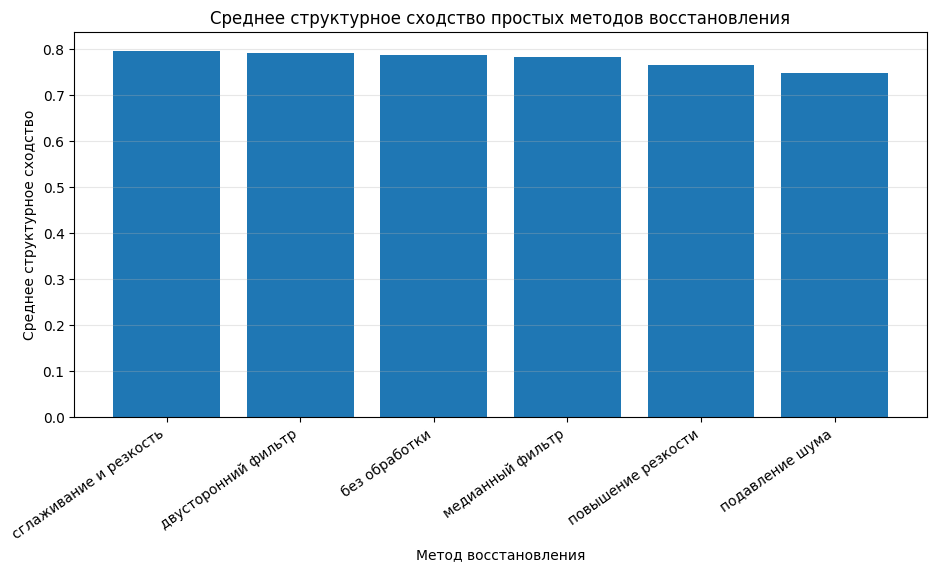

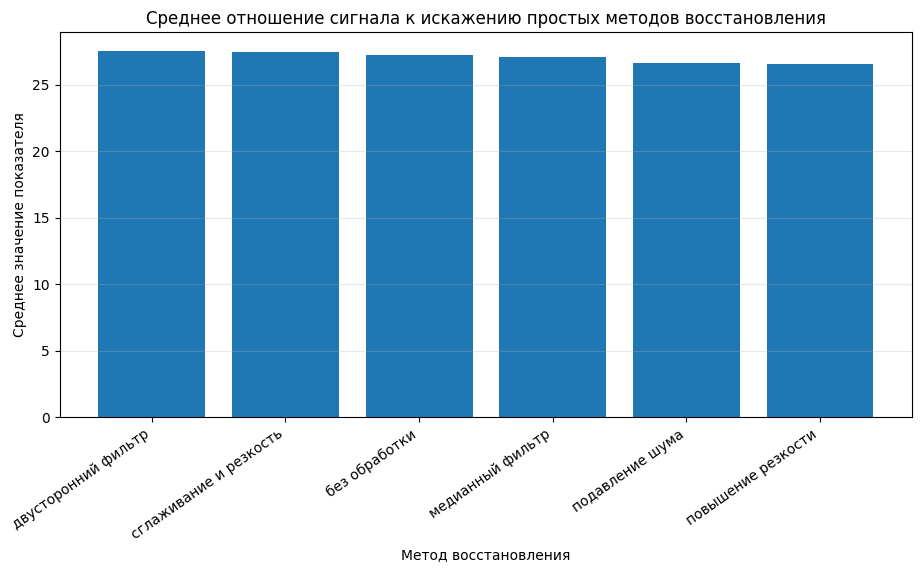

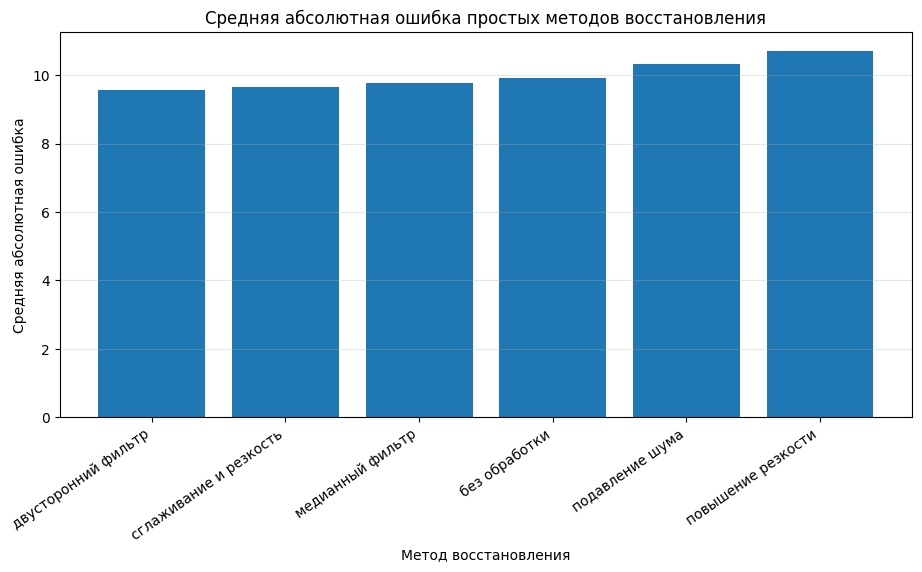

Рисунки с результатами простых методов сохранены:
/content/image_restoration_experiment/results/figures/simple_methods_structure_similarity_second_experiment.png
/content/image_restoration_experiment/results/figures/simple_methods_signal_noise_ratio_second_experiment.png
/content/image_restoration_experiment/results/figures/simple_methods_mean_absolute_error_second_experiment.png


In [17]:
# Строим рисунок по среднему структурному сходству.
plot_table = mean_summary_for_display.sort_values("structure_similarity", ascending=False)

plt.figure(figsize=(11, 5))
plt.bar(
    plot_table["method_name_ru"],
    plot_table["structure_similarity"]
)
plt.title("Среднее структурное сходство простых методов восстановления")
plt.xlabel("Метод восстановления")
plt.ylabel("Среднее структурное сходство")
plt.xticks(rotation=35, ha="right")
plt.grid(axis="y", alpha=0.3)

simple_methods_structure_path = FIGURES_DIR / "simple_methods_structure_similarity_second_experiment.png"
plt.savefig(simple_methods_structure_path, dpi=200, bbox_inches="tight")
plt.show()

# Строим рисунок по среднему отношению сигнала к искажению.
plot_table = mean_summary_for_display.sort_values("signal_noise_ratio", ascending=False)

plt.figure(figsize=(11, 5))
plt.bar(
    plot_table["method_name_ru"],
    plot_table["signal_noise_ratio"]
)
plt.title("Среднее отношение сигнала к искажению простых методов восстановления")
plt.xlabel("Метод восстановления")
plt.ylabel("Среднее значение показателя")
plt.xticks(rotation=35, ha="right")
plt.grid(axis="y", alpha=0.3)

simple_methods_signal_path = FIGURES_DIR / "simple_methods_signal_noise_ratio_second_experiment.png"
plt.savefig(simple_methods_signal_path, dpi=200, bbox_inches="tight")
plt.show()

# Строим рисунок по средней абсолютной ошибке.
# Для этой ошибки меньшее значение означает лучший результат.
plot_table = mean_summary_for_display.sort_values("mean_absolute_error", ascending=True)

plt.figure(figsize=(11, 5))
plt.bar(
    plot_table["method_name_ru"],
    plot_table["mean_absolute_error"]
)
plt.title("Средняя абсолютная ошибка простых методов восстановления")
plt.xlabel("Метод восстановления")
plt.ylabel("Средняя абсолютная ошибка")
plt.xticks(rotation=35, ha="right")
plt.grid(axis="y", alpha=0.3)

simple_methods_error_path = FIGURES_DIR / "simple_methods_mean_absolute_error_second_experiment.png"
plt.savefig(simple_methods_error_path, dpi=200, bbox_inches="tight")
plt.show()

print("Рисунки с результатами простых методов сохранены:")
print(simple_methods_structure_path)
print(simple_methods_signal_path)
print(simple_methods_error_path)

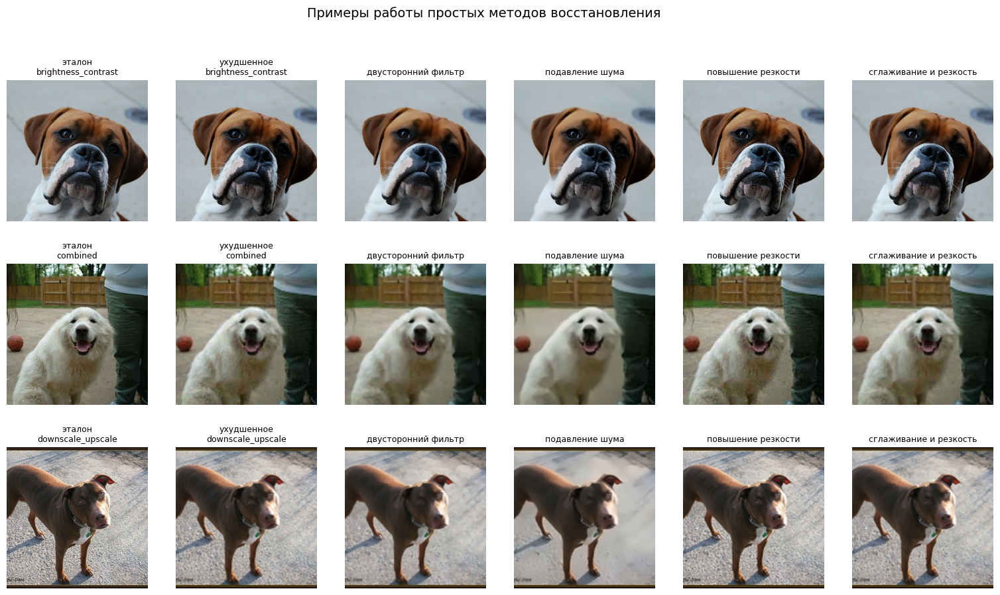

Рисунок с примерами простых методов сохранен: /content/image_restoration_experiment/results/examples/simple_methods_examples_second_experiment.png


In [18]:
# Выбираем несколько изображений разных типов ухудшений.
# Для каждого выбранного изображения показываются эталон, ухудшенная версия и результаты методов.
selected_examples = []

for degradation_type in sorted(test_table["degradation_type"].unique()):
    subset = test_table[test_table["degradation_type"] == degradation_type]

    if len(subset) > 0:
        selected_examples.append(subset.sample(1, random_state=42).iloc[0])

# Чтобы рисунок не был слишком большим, оставляем не более трех примеров.
selected_examples = selected_examples[:3]

# Для визуального сравнения берем основные методы.
methods_for_visual = [
    "without_processing",
    "bilateral_filter",
    "non_local_means",
    "unsharp_mask",
    "combined_smoothing_sharpness",
]

visual_rows = []

for example_index, row in enumerate(selected_examples):
    original_array = read_rgb_image(row["original_image_path"])
    degraded_array = read_rgb_image(row["degraded_image_path"])

    # Добавляем эталонное изображение.
    visual_rows.append({
        "example_index": example_index,
        "title": "эталон\n" + row["degradation_type"],
        "image": original_array
    })

    # Добавляем ухудшенное изображение.
    visual_rows.append({
        "example_index": example_index,
        "title": "ухудшенное\n" + row["degradation_type"],
        "image": degraded_array
    })

    # Добавляем результаты простых методов.
    for method_name in methods_for_visual[1:]:
        restored_array = simple_methods[method_name](degraded_array)

        visual_rows.append({
            "example_index": example_index,
            "title": simple_methods_ru[method_name],
            "image": restored_array
        })

# Строим сетку изображений.
columns = 2 + len(methods_for_visual[1:])
rows = len(selected_examples)

plt.figure(figsize=(3.2 * columns, 3.4 * rows))

for index, visual_item in enumerate(visual_rows):
    plt.subplot(rows, columns, index + 1)
    plt.imshow(visual_item["image"])
    plt.title(visual_item["title"], fontsize=9)
    plt.axis("off")

plt.suptitle("Примеры работы простых методов восстановления", fontsize=14)

simple_methods_examples_path = EXAMPLES_DIR / "simple_methods_examples_second_experiment.png"
plt.savefig(simple_methods_examples_path, dpi=200, bbox_inches="tight")
plt.show()

print("Рисунок с примерами простых методов сохранен:", simple_methods_examples_path)

In [19]:
# Задаем каталог второго эксперимента на Google Диске.
DRIVE_PROJECT_DIR = Path("/content/drive/MyDrive/image_restoration_experiment")

if DRIVE_PROJECT_DIR.exists():
    drive_metrics_dir = DRIVE_PROJECT_DIR / "metrics"
    drive_figures_dir = DRIVE_PROJECT_DIR / "figures"
    drive_reports_dir = DRIVE_PROJECT_DIR / "reports"

    drive_metrics_dir.mkdir(parents=True, exist_ok=True)
    drive_figures_dir.mkdir(parents=True, exist_ok=True)
    drive_reports_dir.mkdir(parents=True, exist_ok=True)

    files_to_copy = [
        simple_methods_results_path,
        simple_methods_summary_path,
        simple_methods_by_type_path,
        simple_methods_report_path,
        simple_methods_structure_path,
        simple_methods_signal_path,
        simple_methods_error_path,
        simple_methods_examples_path,
    ]

    for path in files_to_copy:
        path = Path(path)

        if path.exists():
            if path.suffix.lower() == ".png":
                target_dir = drive_figures_dir
            elif path.suffix.lower() == ".json":
                target_dir = drive_reports_dir
            else:
                target_dir = drive_metrics_dir

            shutil.copy2(path, target_dir / path.name)

    print("Результаты этапа 7 сохранены на Google Диск")
    print("Каталог показателей:", drive_metrics_dir)
    print("Каталог рисунков:", drive_figures_dir)
    print("Каталог отчетов:", drive_reports_dir)
else:
    print("Google Диск не найден. Файлы сохранены только в среде выполнения.")

Результаты этапа 7 сохранены на Google Диск
Каталог показателей: /content/drive/MyDrive/image_restoration_experiment/metrics
Каталог рисунков: /content/drive/MyDrive/image_restoration_experiment/figures
Каталог отчетов: /content/drive/MyDrive/image_restoration_experiment/reports


Простые методы восстановления дали ожидаемый результат: они немного улучшают отдельные показатели, но не обеспечивают полноценного восстановления деталей. Лучший результат по структурному сходству показал метод сглаживания с последующим повышением резкости: среднее структурное сходство составило 0,7971, а среднее отношение сигнала к искажению — 27,47. Это значение теперь можно использовать как нижнюю границу качества для сравнения с нейросетевыми моделями.

Важный вывод состоит в том, что простая обработка не всегда улучшает изображение. Например, подавление шума и повышение резкости в среднем уступили даже варианту без обработки. Это подтверждает необходимость обучения модели, которая будет восстанавливать изображение не по одному фиксированному правилу, а на основе закономерностей, извлеченных из набора данных.

# 8. Обучение первой нейросетевой модели восстановления изображений

На данном этапе обучается первая нейросетевая модель восстановления качества изображений. Модель получает ухудшенное изображение и формирует восстановленную версию, близкую к эталону. В отличие от простых методов обработки, модель обучается на наборе пар и подбирает преобразование изображения по данным.

Научная новизна этапа заключается в использовании остаточного восстановления. Модель не создает все изображение заново, а вычисляет поправку к ухудшенному изображению. Такой подход позволяет сохранить структуру исходного изображения и снизить риск разрушения цвета, контуров и деталей. Первая нейросетевая модель будет использоваться как обучаемая точка сравнения перед более сложной моделью следующего этапа.

In [27]:
# Импортируем библиотеки для работы с файлами, таблицами, числами и временем.
import json
import time
import shutil
from pathlib import Path
from datetime import datetime

# Импортируем библиотеки для численных вычислений и таблиц.
import numpy as np
import pandas as pd

# Импортируем библиотеку для изображений.
from PIL import Image

# Импортируем библиотеку для построения рисунков.
import matplotlib.pyplot as plt

# Импортируем библиотеку для обучения нейросетей.
# Тензор означает числовое представление данных, с которым работает модель.
import torch
import torch.nn as nn
from torch.utils.data import Dataset
from torch.utils.data import DataLoader

# Импортируем функции для расчета качества изображений.
from skimage.metrics import peak_signal_noise_ratio
from skimage.metrics import structural_similarity

# Повторно задаем основные каталоги.
PROJECT_DIR = Path("/content/image_restoration_experiment")
DATA_DIR = PROJECT_DIR / "data"
RESULTS_DIR = PROJECT_DIR / "results"

METRICS_DIR = RESULTS_DIR / "metrics"
MODELS_DIR = RESULTS_DIR / "models"
FIGURES_DIR = RESULTS_DIR / "figures"
EXAMPLES_DIR = RESULTS_DIR / "examples"
REPORTS_DIR = RESULTS_DIR / "reports"
LOGS_DIR = RESULTS_DIR / "logs"

for directory in [
    METRICS_DIR,
    MODELS_DIR,
    FIGURES_DIR,
    EXAMPLES_DIR,
    REPORTS_DIR,
    LOGS_DIR,
]:
    directory.mkdir(parents=True, exist_ok=True)

# Проверяем наличие графического ускорителя.
# Для обучения модели восстановления изображений он обязателен.
if not torch.cuda.is_available():
    raise RuntimeError(
        "Графический ускоритель не найден. Необходимо включить T4 GPU и заново выполнить этап."
    )

DEVICE = torch.device("cuda")

# Задаем начальное число для повторяемости.
SEED = 42
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)

# Включаем ускоренную обработку однотипных изображений.
torch.backends.cudnn.benchmark = True

# Загружаем обучающую и проверочную части.
train_split_path = METRICS_DIR / "train_split_second_experiment.csv"
valid_split_path = METRICS_DIR / "valid_split_second_experiment.csv"

if not train_split_path.exists():
    raise FileNotFoundError(
        "Не найдена обучающая часть. Необходимо сначала выполнить этап 6."
    )

if not valid_split_path.exists():
    raise FileNotFoundError(
        "Не найдена проверочная часть. Необходимо сначала выполнить этап 6."
    )

train_table = pd.read_csv(train_split_path)
valid_table = pd.read_csv(valid_split_path)

required_columns = [
    "image_id",
    "original_image_path",
    "degraded_image_path",
    "degradation_type",
    "species_name_ru",
    "breed_name",
]

for table_name, table in [
    ("обучающая часть", train_table),
    ("проверочная часть", valid_table),
]:
    missing_columns = [
        column for column in required_columns
        if column not in table.columns
    ]

    if missing_columns:
        raise ValueError(
            "В таблице " + table_name + " отсутствуют столбцы: " + ", ".join(missing_columns)
        )


def filter_existing_pairs(table):
    """
    Оставляет только пары, для которых существуют ухудшенное и эталонное изображения.
    """
    table = table.copy()

    table["original_file_exists"] = table["original_image_path"].apply(
        lambda value: Path(value).exists()
    )

    table["degraded_file_exists"] = table["degraded_image_path"].apply(
        lambda value: Path(value).exists()
    )

    table = table[
        (table["original_file_exists"] == True) &
        (table["degraded_file_exists"] == True)
    ].reset_index(drop=True)

    return table


train_table = filter_existing_pairs(train_table)
valid_table = filter_existing_pairs(valid_table)

if len(train_table) == 0:
    raise RuntimeError("В обучающей части не осталось пригодных пар изображений.")

if len(valid_table) == 0:
    raise RuntimeError("В проверочной части не осталось пригодных пар изображений.")

print("Количество обучающих пар:", len(train_table))
print("Количество проверочных пар:", len(valid_table))
print("Устройство вычислений:", torch.cuda.get_device_name(0))

Количество обучающих пар: 5143
Количество проверочных пар: 1102
Устройство вычислений: Tesla T4


In [28]:
class RestorationImageDataset(Dataset):
    """
    Набор данных для восстановления изображений.

    Каждый элемент содержит ухудшенное изображение и эталонное изображение.
    Ухудшенное изображение подается на вход модели.
    Эталонное изображение используется как правильный результат.
    """

    def __init__(self, table):
        self.table = table.reset_index(drop=True)

    def __len__(self):
        return len(self.table)

    def _read_image_as_tensor(self, image_path):
        """
        Загружает изображение и переводит его в тензор.
        Значения пикселей приводятся к диапазону от нуля до единицы.
        """
        image = Image.open(image_path).convert("RGB")
        image_array = np.array(image, dtype=np.float32) / 255.0

        # Меняем порядок осей для нейросетевой модели.
        image_tensor = torch.from_numpy(image_array).permute(2, 0, 1)

        return image_tensor

    def __getitem__(self, index):
        row = self.table.iloc[index]

        degraded_tensor = self._read_image_as_tensor(row["degraded_image_path"])
        original_tensor = self._read_image_as_tensor(row["original_image_path"])

        return {
            "degraded": degraded_tensor,
            "original": original_tensor,
            "image_id": row["image_id"],
            "degradation_type": row["degradation_type"],
        }


class ResidualConvBlock(nn.Module):
    """
    Остаточный сверточный блок.

    Свертка извлекает локальные признаки изображения.
    Остаточная связь помогает модели сохранять уже имеющуюся структуру изображения.
    """

    def __init__(self, channels):
        super().__init__()

        self.block = nn.Sequential(
            nn.Conv2d(channels, channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(channels, channels, kernel_size=3, padding=1),
        )

    def forward(self, input_tensor):
        return input_tensor + self.block(input_tensor)


class FirstResidualRestorationModel(nn.Module):
    """
    Первая нейросетевая модель восстановления качества.

    Модель вычисляет поправку к ухудшенному изображению.
    Если поправка равна нулю, результат совпадает с входным изображением.
    Это защищает модель от разрушения исходной структуры изображения.
    """

    def __init__(self, channels=64, block_count=8, correction_strength=0.35):
        super().__init__()

        self.correction_strength = correction_strength

        self.input_layer = nn.Sequential(
            nn.Conv2d(3, channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
        )

        self.blocks = nn.Sequential(
            *[ResidualConvBlock(channels) for _ in range(block_count)]
        )

        self.output_layer = nn.Conv2d(channels, 3, kernel_size=3, padding=1)

        # Последний слой начинается с нулевой поправки.
        # Поэтому до обучения модель возвращает ухудшенное изображение без изменений.
        nn.init.zeros_(self.output_layer.weight)
        nn.init.zeros_(self.output_layer.bias)

    def forward(self, input_tensor):
        features = self.input_layer(input_tensor)
        features = self.blocks(features)

        correction = torch.tanh(self.output_layer(features))
        restored = input_tensor + self.correction_strength * correction

        # Ограничиваем значения пикселей допустимым диапазоном.
        restored = torch.clamp(restored, 0.0, 1.0)

        return restored


class RestorationLoss(nn.Module):
    """
    Функция ошибки для восстановления изображений.

    Средняя абсолютная ошибка отвечает за близость яркости и цвета.
    Среднеквадратичная ошибка дополнительно штрафует крупные отклонения.
    """

    def __init__(self, absolute_weight=1.0, squared_weight=0.15):
        super().__init__()

        self.absolute_weight = absolute_weight
        self.squared_weight = squared_weight
        self.absolute_loss = nn.L1Loss()
        self.squared_loss = nn.MSELoss()

    def forward(self, restored, original):
        absolute_part = self.absolute_loss(restored, original)
        squared_part = self.squared_loss(restored, original)

        return self.absolute_weight * absolute_part + self.squared_weight * squared_part


# Создаем наборы данных.
train_dataset = RestorationImageDataset(train_table)
valid_dataset = RestorationImageDataset(valid_table)

# Размер пакета уменьшен, чтобы модель устойчиво помещалась в память графического ускорителя.
BATCH_SIZE = 8
NUM_WORKERS = 2

train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=True
)

valid_loader = DataLoader(
    valid_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=True
)

# Создаем модель.
model = FirstResidualRestorationModel(
    channels=64,
    block_count=8,
    correction_strength=0.35
).to(DEVICE)

loss_function = RestorationLoss(
    absolute_weight=1.0,
    squared_weight=0.15
)

optimizer = torch.optim.Adam(
    model.parameters(),
    lr=2e-4
)

# Средство для смешанной точности ускоряет обучение и снижает расход памяти.
scaler = torch.amp.GradScaler("cuda")

trainable_parameters = sum(
    parameter.numel()
    for parameter in model.parameters()
    if parameter.requires_grad
)

first_model_config = {
    "дата_создания": datetime.now().strftime("%Y-%m-%d %H:%M:%S"),
    "название_модели": "первая остаточная сверточная модель восстановления изображения",
    "рабочий_размер_изображения": 256,
    "размер_пакета": BATCH_SIZE,
    "число_рабочих_процессов_загрузки": NUM_WORKERS,
    "число_каналов_признаков": 64,
    "число_остаточных_блоков": 8,
    "сила_поправки": 0.35,
    "функция_ошибки": "средняя абсолютная ошибка и среднеквадратичная ошибка",
    "способ_обновления_весов": "Adam",
    "начальная_скорость_обучения": 2e-4,
    "количество_обучаемых_параметров": int(trainable_parameters),
    "научное_назначение": (
        "Модель используется как первая обучаемая точка сравнения. "
        "Она восстанавливает изображение через вычисление поправки к ухудшенному входу."
    )
}

first_model_config_path = REPORTS_DIR / "first_residual_model_config_second_experiment.json"

with open(first_model_config_path, "w", encoding="utf-8") as file:
    json.dump(first_model_config, file, ensure_ascii=False, indent=4)

print("Первая остаточная модель создана")
print("Количество обучаемых параметров:", trainable_parameters)
print("Файл с настройками модели:", first_model_config_path)

Первая остаточная модель создана
Количество обучаемых параметров: 594371
Файл с настройками модели: /content/image_restoration_experiment/results/reports/first_residual_model_config_second_experiment.json


In [29]:
def run_train_epoch(model, data_loader, loss_function, optimizer, scaler, device):
    """
    Выполняет один проход обучения по обучающей части.
    """
    model.train()

    total_loss = 0.0
    total_count = 0

    for batch in data_loader:
        degraded = batch["degraded"].to(device, non_blocking=True)
        original = batch["original"].to(device, non_blocking=True)

        optimizer.zero_grad(set_to_none=True)

        with torch.amp.autocast(device_type="cuda", dtype=torch.float16):
            restored = model(degraded)
            loss = loss_function(restored, original)

        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        batch_size = degraded.size(0)
        total_loss += float(loss.detach().cpu()) * batch_size
        total_count += batch_size

    return total_loss / max(total_count, 1)


@torch.no_grad()
def run_valid_epoch(model, data_loader, loss_function, device):
    """
    Выполняет проверку модели на проверочной части.
    На этом этапе веса модели не изменяются.
    """
    model.eval()

    total_loss = 0.0
    total_count = 0

    for batch in data_loader:
        degraded = batch["degraded"].to(device, non_blocking=True)
        original = batch["original"].to(device, non_blocking=True)

        with torch.amp.autocast(device_type="cuda", dtype=torch.float16):
            restored = model(degraded)
            loss = loss_function(restored, original)

        batch_size = degraded.size(0)
        total_loss += float(loss.detach().cpu()) * batch_size
        total_count += batch_size

    return total_loss / max(total_count, 1)


# Задаем параметры обучения.
EPOCHS = 10
PATIENCE = 4
MIN_IMPROVEMENT = 1e-5

# Пути для сохранения моделей.
best_model_path = MODELS_DIR / "restoration_first_residual_best_second_experiment.pt"
last_model_path = MODELS_DIR / "restoration_first_residual_last_second_experiment.pt"
history_path = METRICS_DIR / "restoration_first_residual_history_second_experiment.csv"

# До обучения модель возвращает ухудшенное изображение без изменений.
# Эта нулевая эпоха используется как безопасная начальная точка.
initial_valid_loss = run_valid_epoch(
    model=model,
    data_loader=valid_loader,
    loss_function=loss_function,
    device=DEVICE
)

best_valid_loss = initial_valid_loss
best_epoch = 0
epochs_without_improvement = 0

history_rows = [
    {
        "epoch": 0,
        "train_loss": np.nan,
        "valid_loss": initial_valid_loss,
        "epoch_time_seconds": 0.0,
        "learning_rate": optimizer.param_groups[0]["lr"],
        "comment": "модель до обучения"
    }
]

torch.save(
    {
        "epoch": 0,
        "model_state_dict": model.state_dict(),
        "optimizer_state_dict": optimizer.state_dict(),
        "valid_loss": initial_valid_loss,
        "config": first_model_config,
    },
    best_model_path
)

print("Начато обучение первой остаточной нейросетевой модели")
print("Проверочная ошибка до обучения:", round(initial_valid_loss, 6))
print("Количество эпох:", EPOCHS)
print("Размер пакета:", BATCH_SIZE)

start_time = time.time()

for epoch in range(1, EPOCHS + 1):
    epoch_start_time = time.time()

    train_loss = run_train_epoch(
        model=model,
        data_loader=train_loader,
        loss_function=loss_function,
        optimizer=optimizer,
        scaler=scaler,
        device=DEVICE
    )

    valid_loss = run_valid_epoch(
        model=model,
        data_loader=valid_loader,
        loss_function=loss_function,
        device=DEVICE
    )

    epoch_time = time.time() - epoch_start_time

    torch.save(
        {
            "epoch": epoch,
            "model_state_dict": model.state_dict(),
            "optimizer_state_dict": optimizer.state_dict(),
            "valid_loss": valid_loss,
            "config": first_model_config,
        },
        last_model_path
    )

    if valid_loss < best_valid_loss - MIN_IMPROVEMENT:
        best_valid_loss = valid_loss
        best_epoch = epoch
        epochs_without_improvement = 0

        torch.save(
            {
                "epoch": epoch,
                "model_state_dict": model.state_dict(),
                "optimizer_state_dict": optimizer.state_dict(),
                "valid_loss": valid_loss,
                "config": first_model_config,
            },
            best_model_path
        )

        comment = "лучшая модель обновлена"
    else:
        epochs_without_improvement += 1
        comment = "улучшения нет"

    history_rows.append({
        "epoch": epoch,
        "train_loss": train_loss,
        "valid_loss": valid_loss,
        "epoch_time_seconds": epoch_time,
        "learning_rate": optimizer.param_groups[0]["lr"],
        "comment": comment
    })

    history_table = pd.DataFrame(history_rows)
    history_table.to_csv(history_path, index=False, encoding="utf-8")

    print(
        "Эпоха",
        epoch,
        "| ошибка обучения:",
        round(train_loss, 6),
        "| ошибка проверки:",
        round(valid_loss, 6),
        "| время, секунд:",
        round(epoch_time, 1),
        "|",
        comment
    )

    if epochs_without_improvement >= PATIENCE:
        print("Обучение остановлено досрочно, так как проверочная ошибка не улучшается")
        break

total_training_time = time.time() - start_time

training_report = {
    "дата_завершения": datetime.now().strftime("%Y-%m-%d %H:%M:%S"),
    "количество_выполненных_эпох": int(len(history_rows) - 1),
    "лучшая_эпоха": int(best_epoch),
    "начальная_проверочная_ошибка": float(initial_valid_loss),
    "лучшая_проверочная_ошибка": float(best_valid_loss),
    "улучшение_проверочной_ошибки": float(initial_valid_loss - best_valid_loss),
    "общее_время_обучения_секунд": float(total_training_time),
    "путь_к_лучшей_модели": str(best_model_path),
    "путь_к_последней_модели": str(last_model_path),
    "пояснение": (
        "Первая остаточная модель сохраняет ухудшенное изображение как начальную точку "
        "и обучается добавлять поправку, если это снижает ошибку восстановления."
    )
}

training_report_path = REPORTS_DIR / "first_residual_training_report_second_experiment.json"

with open(training_report_path, "w", encoding="utf-8") as file:
    json.dump(training_report, file, ensure_ascii=False, indent=4)

print("\nОбучение завершено")
print("Лучшая эпоха:", best_epoch)
print("Лучшая проверочная ошибка:", best_valid_loss)
print("Улучшение проверочной ошибки:", initial_valid_loss - best_valid_loss)
print("Лучшая модель сохранена:", best_model_path)
print("Последняя модель сохранена:", last_model_path)
print("История обучения сохранена:", history_path)
print("Отчет об обучении сохранен:", training_report_path)

Начато обучение первой остаточной нейросетевой модели
Проверочная ошибка до обучения: 0.036972
Количество эпох: 10
Размер пакета: 8
Эпоха 1 | ошибка обучения: 0.037963 | ошибка проверки: 0.033872 | время, секунд: 196.3 | лучшая модель обновлена
Эпоха 2 | ошибка обучения: 0.036253 | ошибка проверки: 0.033004 | время, секунд: 176.1 | лучшая модель обновлена
Эпоха 3 | ошибка обучения: 0.035827 | ошибка проверки: 0.032673 | время, секунд: 173.5 | лучшая модель обновлена
Эпоха 4 | ошибка обучения: 0.035585 | ошибка проверки: 0.032524 | время, секунд: 174.3 | лучшая модель обновлена
Эпоха 5 | ошибка обучения: 0.035433 | ошибка проверки: 0.032681 | время, секунд: 173.7 | улучшения нет
Эпоха 6 | ошибка обучения: 0.035234 | ошибка проверки: 0.032481 | время, секунд: 173.2 | лучшая модель обновлена
Эпоха 7 | ошибка обучения: 0.035174 | ошибка проверки: 0.032308 | время, секунд: 171.7 | лучшая модель обновлена
Эпоха 8 | ошибка обучения: 0.035029 | ошибка проверки: 0.032223 | время, секунд: 171.3 

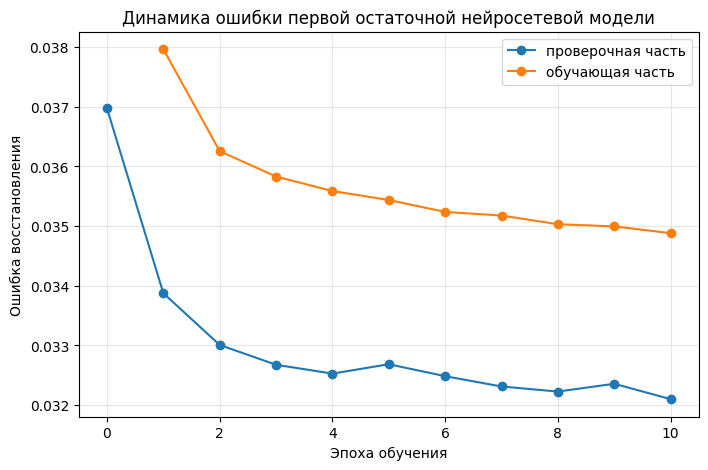

График обучения сохранен: /content/image_restoration_experiment/results/figures/first_residual_training_history_second_experiment.png


In [30]:
history_table = pd.read_csv(history_path)

plt.figure(figsize=(8, 5))

plt.plot(
    history_table["epoch"],
    history_table["valid_loss"],
    marker="o",
    label="проверочная часть"
)

train_history = history_table.dropna(subset=["train_loss"])

plt.plot(
    train_history["epoch"],
    train_history["train_loss"],
    marker="o",
    label="обучающая часть"
)

plt.title("Динамика ошибки первой остаточной нейросетевой модели")
plt.xlabel("Эпоха обучения")
plt.ylabel("Ошибка восстановления")
plt.grid(alpha=0.3)
plt.legend()

first_residual_history_figure_path = FIGURES_DIR / "first_residual_training_history_second_experiment.png"
plt.savefig(first_residual_history_figure_path, dpi=200, bbox_inches="tight")
plt.show()

print("График обучения сохранен:", first_residual_history_figure_path)

In [31]:
def tensor_to_image_array(tensor):
    """
    Переводит тензор модели обратно в изображение.
    """
    image_array = tensor.detach().cpu().permute(1, 2, 0).numpy()
    image_array = np.clip(image_array * 255.0, 0, 255).astype(np.uint8)
    return image_array


@torch.no_grad()
def evaluate_model_on_table(model, table, device, batch_size=8):
    """
    Рассчитывает показатели качества модели на заданной таблице изображений.
    """
    dataset = RestorationImageDataset(table)

    data_loader = DataLoader(
        dataset,
        batch_size=batch_size,
        shuffle=False,
        num_workers=2,
        pin_memory=True
    )

    model.eval()

    metric_rows = []

    for batch in data_loader:
        degraded = batch["degraded"].to(device, non_blocking=True)
        original = batch["original"].to(device, non_blocking=True)

        with torch.amp.autocast(device_type="cuda", dtype=torch.float16):
            restored = model(degraded)

        for index in range(degraded.size(0)):
            original_array = tensor_to_image_array(original[index])
            degraded_array = tensor_to_image_array(degraded[index])
            restored_array = tensor_to_image_array(restored[index])

            degraded_signal = peak_signal_noise_ratio(
                original_array,
                degraded_array,
                data_range=255
            )

            degraded_structure = structural_similarity(
                original_array,
                degraded_array,
                channel_axis=-1,
                data_range=255
            )

            degraded_absolute_error = float(
                np.mean(np.abs(original_array.astype(np.float32) - degraded_array.astype(np.float32)))
            )

            restored_signal = peak_signal_noise_ratio(
                original_array,
                restored_array,
                data_range=255
            )

            restored_structure = structural_similarity(
                original_array,
                restored_array,
                channel_axis=-1,
                data_range=255
            )

            restored_absolute_error = float(
                np.mean(np.abs(original_array.astype(np.float32) - restored_array.astype(np.float32)))
            )

            metric_rows.append({
                "image_id": batch["image_id"][index],
                "degradation_type": batch["degradation_type"][index],
                "degraded_signal_noise_ratio": float(degraded_signal),
                "degraded_structure_similarity": float(degraded_structure),
                "degraded_mean_absolute_error": degraded_absolute_error,
                "restored_signal_noise_ratio": float(restored_signal),
                "restored_structure_similarity": float(restored_structure),
                "restored_mean_absolute_error": restored_absolute_error,
                "signal_noise_ratio_gain": float(restored_signal - degraded_signal),
                "structure_similarity_gain": float(restored_structure - degraded_structure),
                "absolute_error_gain": float(degraded_absolute_error - restored_absolute_error),
            })

    return pd.DataFrame(metric_rows)


# Загружаем лучшую модель.
checkpoint = torch.load(best_model_path, map_location=DEVICE)
model.load_state_dict(checkpoint["model_state_dict"])
model.to(DEVICE)

first_residual_valid_metrics = evaluate_model_on_table(
    model=model,
    table=valid_table,
    device=DEVICE,
    batch_size=BATCH_SIZE
)

first_residual_valid_metrics_path = METRICS_DIR / "first_residual_valid_metrics_second_experiment.csv"
first_residual_valid_metrics.to_csv(first_residual_valid_metrics_path, index=False, encoding="utf-8")

first_residual_valid_summary = {
    "дата_создания": datetime.now().strftime("%Y-%m-%d %H:%M:%S"),
    "количество_изображений_проверочной_части": int(len(first_residual_valid_metrics)),
    "среднее_отношение_сигнала_к_искажению_ухудшенных_изображений": float(
        first_residual_valid_metrics["degraded_signal_noise_ratio"].mean()
    ),
    "среднее_структурное_сходство_ухудшенных_изображений": float(
        first_residual_valid_metrics["degraded_structure_similarity"].mean()
    ),
    "средняя_абсолютная_ошибка_ухудшенных_изображений": float(
        first_residual_valid_metrics["degraded_mean_absolute_error"].mean()
    ),
    "среднее_отношение_сигнала_к_искажению_восстановленных_изображений": float(
        first_residual_valid_metrics["restored_signal_noise_ratio"].mean()
    ),
    "среднее_структурное_сходство_восстановленных_изображений": float(
        first_residual_valid_metrics["restored_structure_similarity"].mean()
    ),
    "средняя_абсолютная_ошибка_восстановленных_изображений": float(
        first_residual_valid_metrics["restored_mean_absolute_error"].mean()
    ),
    "средний_прирост_отношения_сигнала_к_искажению": float(
        first_residual_valid_metrics["signal_noise_ratio_gain"].mean()
    ),
    "средний_прирост_структурного_сходства": float(
        first_residual_valid_metrics["structure_similarity_gain"].mean()
    ),
    "среднее_снижение_абсолютной_ошибки": float(
        first_residual_valid_metrics["absolute_error_gain"].mean()
    ),
    "лучшая_эпоха": int(checkpoint["epoch"]),
    "путь_к_модели": str(best_model_path)
}

first_residual_valid_summary_path = REPORTS_DIR / "first_residual_valid_summary_second_experiment.json"

with open(first_residual_valid_summary_path, "w", encoding="utf-8") as file:
    json.dump(first_residual_valid_summary, file, ensure_ascii=False, indent=4)

first_residual_valid_by_type = (
    first_residual_valid_metrics
    .groupby("degradation_type")[
        [
            "degraded_signal_noise_ratio",
            "degraded_structure_similarity",
            "degraded_mean_absolute_error",
            "restored_signal_noise_ratio",
            "restored_structure_similarity",
            "restored_mean_absolute_error",
            "signal_noise_ratio_gain",
            "structure_similarity_gain",
            "absolute_error_gain",
        ]
    ]
    .mean()
    .reset_index()
)

first_residual_valid_by_type_path = METRICS_DIR / "first_residual_valid_by_type_second_experiment.csv"
first_residual_valid_by_type.to_csv(first_residual_valid_by_type_path, index=False, encoding="utf-8")

print("Показатели первой остаточной модели сохранены:", first_residual_valid_metrics_path)
print("Сводка сохранена:", first_residual_valid_summary_path)
print("Сводка по типам ухудшений сохранена:", first_residual_valid_by_type_path)

print("\nСводка проверки:")
for key, value in first_residual_valid_summary.items():
    print(key + ":", value)

print("\nСредние показатели по типам ухудшений:")
display(first_residual_valid_by_type)

Показатели первой остаточной модели сохранены: /content/image_restoration_experiment/results/metrics/first_residual_valid_metrics_second_experiment.csv
Сводка сохранена: /content/image_restoration_experiment/results/reports/first_residual_valid_summary_second_experiment.json
Сводка по типам ухудшений сохранена: /content/image_restoration_experiment/results/metrics/first_residual_valid_by_type_second_experiment.csv

Сводка проверки:
дата_создания: 2026-05-04 15:18:13
количество_изображений_проверочной_части: 1102
среднее_отношение_сигнала_к_искажению_ухудшенных_изображений: 27.54032111615465
среднее_структурное_сходство_ухудшенных_изображений: 0.7838642816149758
средняя_абсолютная_ошибка_ухудшенных_изображений: 9.295916236571953
среднее_отношение_сигнала_к_искажению_восстановленных_изображений: 29.001453692623315
среднее_структурное_сходство_восстановленных_изображений: 0.8413896569821678
средняя_абсолютная_ошибка_восстановленных_изображений: 8.066023308006258
средний_прирост_отношения_

,degradation_type,degraded_signal_noise_ratio,degraded_structure_similarity,degraded_mean_absolute_error,restored_signal_noise_ratio,restored_structure_similarity,restored_mean_absolute_error,signal_noise_ratio_gain,structure_similarity_gain,absolute_error_gain
0,brightness_contrast,21.981001,0.889245,23.255302,21.657421,0.869332,22.918507,-0.323581,-0.019914,0.336795
1,combined,26.615717,0.665154,9.153299,28.524088,0.788502,7.120734,1.908371,0.123348,2.032565
2,downscale_upscale,29.908180,0.851192,5.798012,30.694945,0.871722,5.444288,0.786765,0.020530,0.353724
3,gaussian_blur,29.534398,0.837608,5.907025,31.057476,0.868627,5.150973,1.523079,0.031020,0.756052
4,gaussian_noise,27.135606,0.663060,9.272701,32.215354,0.877544,4.897530,5.079748,0.214484,4.375171
5,jpeg_compression,30.221929,0.860109,6.005941,30.683678,0.871084,5.708847,0.461749,0.010976,0.297094
6,motion_blur,26.403493,0.739776,8.322758,26.754788,0.749190,8.068762,0.351295,0.009414,0.253996


/tmp/ipykernel_3661/2310934608.py:4: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda group: group.sample(1, random_state=42))


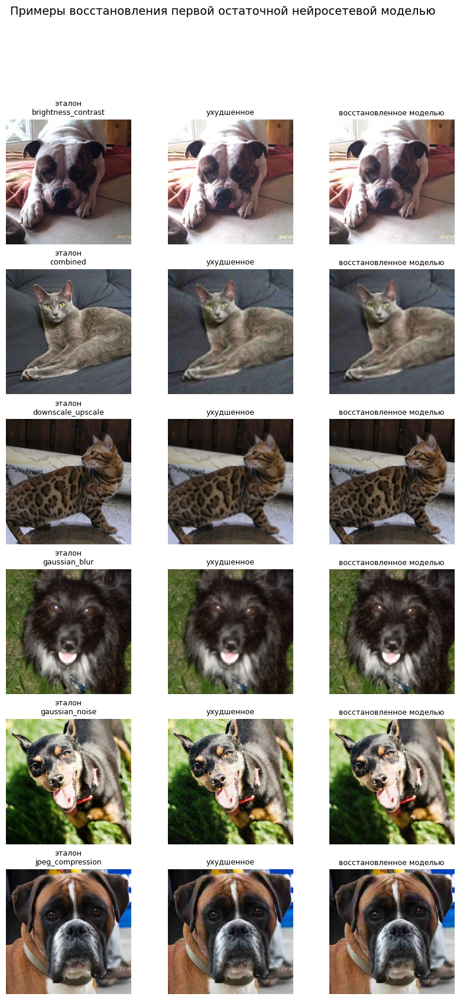

Рисунок с примерами восстановления сохранен: /content/image_restoration_experiment/results/examples/first_residual_restoration_examples_second_experiment.png


In [32]:
example_table = (
    valid_table
    .groupby("degradation_type", group_keys=False)
    .apply(lambda group: group.sample(1, random_state=42))
    .reset_index(drop=True)
)

example_table = example_table.head(6)

model.eval()

visual_rows = []

with torch.no_grad():
    for _, row in example_table.iterrows():
        degraded_image = Image.open(row["degraded_image_path"]).convert("RGB")
        original_image = Image.open(row["original_image_path"]).convert("RGB")

        degraded_array_float = np.array(degraded_image, dtype=np.float32) / 255.0
        degraded_tensor = (
            torch.from_numpy(degraded_array_float)
            .permute(2, 0, 1)
            .unsqueeze(0)
            .to(DEVICE)
        )

        with torch.amp.autocast(device_type="cuda", dtype=torch.float16):
            restored_tensor = model(degraded_tensor)

        restored_array = tensor_to_image_array(restored_tensor[0])

        visual_rows.append({
            "degradation_type": row["degradation_type"],
            "original": np.array(original_image, dtype=np.uint8),
            "degraded": np.array(degraded_image, dtype=np.uint8),
            "restored": restored_array,
        })

rows = len(visual_rows)
cols = 3

plt.figure(figsize=(10, 3.2 * rows))

for row_index, item in enumerate(visual_rows):
    plt.subplot(rows, cols, row_index * cols + 1)
    plt.imshow(item["original"])
    plt.title("эталон\n" + item["degradation_type"], fontsize=9)
    plt.axis("off")

    plt.subplot(rows, cols, row_index * cols + 2)
    plt.imshow(item["degraded"])
    plt.title("ухудшенное", fontsize=9)
    plt.axis("off")

    plt.subplot(rows, cols, row_index * cols + 3)
    plt.imshow(item["restored"])
    plt.title("восстановленное моделью", fontsize=9)
    plt.axis("off")

plt.suptitle("Примеры восстановления первой остаточной нейросетевой моделью", fontsize=14)

first_residual_examples_path = EXAMPLES_DIR / "first_residual_restoration_examples_second_experiment.png"
plt.savefig(first_residual_examples_path, dpi=200, bbox_inches="tight")
plt.show()

print("Рисунок с примерами восстановления сохранен:", first_residual_examples_path)

In [33]:
DRIVE_PROJECT_DIR = Path("/content/drive/MyDrive/image_restoration_experiment")

if DRIVE_PROJECT_DIR.exists():
    drive_models_dir = DRIVE_PROJECT_DIR / "models"
    drive_metrics_dir = DRIVE_PROJECT_DIR / "metrics"
    drive_figures_dir = DRIVE_PROJECT_DIR / "figures"
    drive_reports_dir = DRIVE_PROJECT_DIR / "reports"

    for directory in [
        drive_models_dir,
        drive_metrics_dir,
        drive_figures_dir,
        drive_reports_dir,
    ]:
        directory.mkdir(parents=True, exist_ok=True)

    files_to_copy = [
        best_model_path,
        last_model_path,
        history_path,
        first_model_config_path,
        training_report_path,
        first_residual_history_figure_path,
        first_residual_valid_metrics_path,
        first_residual_valid_summary_path,
        first_residual_valid_by_type_path,
        first_residual_examples_path,
    ]

    for path in files_to_copy:
        path = Path(path)

        if path.exists():
            if path.suffix.lower() == ".pt":
                target_dir = drive_models_dir
            elif path.suffix.lower() == ".png":
                target_dir = drive_figures_dir
            elif path.suffix.lower() == ".json":
                target_dir = drive_reports_dir
            else:
                target_dir = drive_metrics_dir

            shutil.copy2(path, target_dir / path.name)

    print("Результаты этапа 8 сохранены на Google Диск")
    print("Каталог моделей:", drive_models_dir)
    print("Каталог показателей:", drive_metrics_dir)
    print("Каталог рисунков:", drive_figures_dir)
    print("Каталог отчетов:", drive_reports_dir)
else:
    print("Google Диск не найден. Файлы сохранены только в среде выполнения.")

Результаты этапа 8 сохранены на Google Диск
Каталог моделей: /content/drive/MyDrive/image_restoration_experiment/models
Каталог показателей: /content/drive/MyDrive/image_restoration_experiment/metrics
Каталог рисунков: /content/drive/MyDrive/image_restoration_experiment/figures
Каталог отчетов: /content/drive/MyDrive/image_restoration_experiment/reports


Первая остаточная модель исправила ключевую проблему прежнего варианта: восстановленные изображения больше не разрушаются, сохраняют цвет, форму и детали исходного входа. Проверочная ошибка снизилась с 0,0370 до 0,0321, среднее структурное сходство выросло с 0,7839 до 0,8414, а отношение сигнала к искажению увеличилось с 27,54 до 29,00. Такой результат уже можно использовать как нейросетевую точку сравнения.

Особенно сильное улучшение видно для цифрового шума, комбинированного ухудшения, размытия и потери детализации. Слабым местом остается изменение яркости и контрастности: по структурному сходству модель немного ухудшила результат, хотя средняя абсолютная ошибка снизилась. Поэтому следующий этап должен быть развитием результата: обучается более гибкая модель с пропускными связями и дополнительным учетом границ изображения. Такая модель должна лучше сохранять локальные детали и осторожнее исправлять изображение.

# 9. Калибровка улучшенной нейросетевой схемы восстановления изображений

На данном этапе выполняется развитие первой успешной нейросетевой модели. Вместо обучения новой тяжелой модели используется калибровка силы нейросетевой поправки. Такой подход основан на том, что восстановление не всегда должно применяться с одинаковой интенсивностью: для шума полезна более сильная коррекция, а для изменения яркости и контрастности чрезмерное вмешательство может ухудшать структурное сходство.

Научная новизна этапа заключается в построении безопасной нейросетевой схемы восстановления. Модель не применяется как черный ящик с фиксированным результатом, а дополняется проверочной калибровкой, которая подбирает оптимальную силу восстановления. В результате формируется артефакт, пригодный для пользовательского приложения: сохраненная модель, общий коэффициент восстановления и коэффициенты для отдельных типов искажений.

In [45]:
# Импортируем библиотеки для работы с файлами, таблицами, числами и временем.
import json
import time
import shutil
from pathlib import Path
from datetime import datetime

# Импортируем библиотеки для численных расчетов и таблиц.
import numpy as np
import pandas as pd

# Импортируем библиотеку для изображений.
from PIL import Image

# Импортируем библиотеку для построения рисунков.
import matplotlib.pyplot as plt

# Импортируем библиотеку для обучения и применения нейросетей.
# Тензор означает числовое представление изображения, с которым работает модель.
import torch
import torch.nn as nn
from torch.utils.data import Dataset
from torch.utils.data import DataLoader

# Импортируем функции для расчета качества изображений.
from skimage.metrics import peak_signal_noise_ratio
from skimage.metrics import structural_similarity

# Импортируем функцию для вывода таблиц в среде выполнения.
from IPython.display import display

# Повторно задаем основные каталоги.
PROJECT_DIR = Path("/content/image_restoration_experiment")
RESULTS_DIR = PROJECT_DIR / "results"

METRICS_DIR = RESULTS_DIR / "metrics"
MODELS_DIR = RESULTS_DIR / "models"
FIGURES_DIR = RESULTS_DIR / "figures"
EXAMPLES_DIR = RESULTS_DIR / "examples"
REPORTS_DIR = RESULTS_DIR / "reports"
EXPORT_DIR = PROJECT_DIR / "export"

for directory in [
    METRICS_DIR,
    MODELS_DIR,
    FIGURES_DIR,
    EXAMPLES_DIR,
    REPORTS_DIR,
    EXPORT_DIR,
]:
    directory.mkdir(parents=True, exist_ok=True)

# Проверяем наличие графического ускорителя.
if not torch.cuda.is_available():
    raise RuntimeError(
        "Графический ускоритель не найден. Необходимо включить T4 GPU и заново выполнить этап."
    )

DEVICE = torch.device("cuda")

# Очищаем неиспользуемую память графического ускорителя.
torch.cuda.empty_cache()

# Задаем начальное число для повторяемости.
SEED = 42
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)

# Включаем ускоренную обработку изображений одинакового размера.
torch.backends.cudnn.benchmark = True

# Загружаем проверочную часть.
# Для калибровки используется только проверочная часть, контрольная часть остается для финальной проверки.
valid_split_path = METRICS_DIR / "valid_split_second_experiment.csv"

if not valid_split_path.exists():
    raise FileNotFoundError(
        "Не найдена проверочная часть. Необходимо сначала выполнить этап 6."
    )

valid_table = pd.read_csv(valid_split_path)

required_columns = [
    "image_id",
    "original_image_path",
    "degraded_image_path",
    "degradation_type",
    "species_name_ru",
    "breed_name",
]

missing_columns = [
    column for column in required_columns
    if column not in valid_table.columns
]

if missing_columns:
    raise ValueError(
        "В таблице проверочной части отсутствуют столбцы: " + ", ".join(missing_columns)
    )


def filter_existing_pairs(table):
    """
    Оставляет только пары, для которых существуют ухудшенное и эталонное изображения.
    """
    table = table.copy()

    table["original_file_exists"] = table["original_image_path"].apply(
        lambda value: Path(value).exists()
    )

    table["degraded_file_exists"] = table["degraded_image_path"].apply(
        lambda value: Path(value).exists()
    )

    table = table[
        (table["original_file_exists"] == True) &
        (table["degraded_file_exists"] == True)
    ].reset_index(drop=True)

    return table


valid_table = filter_existing_pairs(valid_table)

if len(valid_table) == 0:
    raise RuntimeError("В проверочной части не осталось пригодных пар изображений.")

# Проверяем наличие лучшей первой модели.
first_model_path = MODELS_DIR / "restoration_first_residual_best_second_experiment.pt"

if not first_model_path.exists():
    raise FileNotFoundError(
        "Не найдена лучшая первая остаточная модель. Необходимо сначала выполнить исправленный этап 8."
    )

print("Количество изображений проверочной части:", len(valid_table))
print("Найдена первая успешная модель:", first_model_path)
print("Устройство вычислений:", torch.cuda.get_device_name(0))

Количество изображений проверочной части: 1102
Найдена первая успешная модель: /content/image_restoration_experiment/results/models/restoration_first_residual_best_second_experiment.pt
Устройство вычислений: Tesla T4


In [46]:
class RestorationImageDataset(Dataset):
    """
    Набор данных для восстановления изображений.

    Каждый элемент содержит ухудшенное изображение и эталонное изображение.
    Ухудшенное изображение подается на вход модели.
    Эталонное изображение используется для расчета качества.
    """

    def __init__(self, table):
        self.table = table.reset_index(drop=True)

    def __len__(self):
        return len(self.table)

    def _read_image_as_tensor(self, image_path):
        """
        Загружает изображение и переводит его в тензор.
        Значения пикселей приводятся к диапазону от нуля до единицы.
        """
        image = Image.open(image_path).convert("RGB")
        image_array = np.array(image, dtype=np.float32) / 255.0
        image_tensor = torch.from_numpy(image_array).permute(2, 0, 1)

        return image_tensor

    def __getitem__(self, index):
        row = self.table.iloc[index]

        degraded_tensor = self._read_image_as_tensor(row["degraded_image_path"])
        original_tensor = self._read_image_as_tensor(row["original_image_path"])

        return {
            "degraded": degraded_tensor,
            "original": original_tensor,
            "image_id": row["image_id"],
            "degradation_type": row["degradation_type"],
            "species_name_ru": row["species_name_ru"],
            "breed_name": row["breed_name"],
        }


class ResidualConvBlock(nn.Module):
    """
    Остаточный сверточный блок.

    Свертка извлекает локальные признаки изображения.
    Остаточная связь помогает сохранять структуру входного изображения.
    """

    def __init__(self, channels):
        super().__init__()

        self.block = nn.Sequential(
            nn.Conv2d(channels, channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(channels, channels, kernel_size=3, padding=1),
        )

    def forward(self, input_tensor):
        return input_tensor + self.block(input_tensor)


class FirstResidualRestorationModel(nn.Module):
    """
    Первая успешная остаточная модель восстановления качества.

    Модель вычисляет поправку к ухудшенному изображению.
    """

    def __init__(self, channels=64, block_count=8, correction_strength=0.35):
        super().__init__()

        self.correction_strength = correction_strength

        self.input_layer = nn.Sequential(
            nn.Conv2d(3, channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
        )

        self.blocks = nn.Sequential(
            *[ResidualConvBlock(channels) for _ in range(block_count)]
        )

        self.output_layer = nn.Conv2d(channels, 3, kernel_size=3, padding=1)

    def forward(self, input_tensor):
        features = self.input_layer(input_tensor)
        features = self.blocks(features)

        correction = torch.tanh(self.output_layer(features))
        restored = input_tensor + self.correction_strength * correction
        restored = torch.clamp(restored, 0.0, 1.0)

        return restored


# Создаем загрузчик проверочной части.
BATCH_SIZE = 8
NUM_WORKERS = 2

valid_dataset = RestorationImageDataset(valid_table)

valid_loader = DataLoader(
    valid_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=True
)

# Создаем модель с той же структурой, что и на исправленном этапе 8.
model = FirstResidualRestorationModel(
    channels=64,
    block_count=8,
    correction_strength=0.35
).to(DEVICE)

# Загружаем веса первой успешной модели.
try:
    checkpoint = torch.load(
        first_model_path,
        map_location=DEVICE,
        weights_only=False
    )
except TypeError:
    checkpoint = torch.load(
        first_model_path,
        map_location=DEVICE
    )

model.load_state_dict(checkpoint["model_state_dict"])
model.eval()

loaded_epoch = checkpoint.get("epoch", "не указана")

print("Первая успешная модель загружена")
print("Эпоха сохраненной модели:", loaded_epoch)
print("Размер пакета:", BATCH_SIZE)

Первая успешная модель загружена
Эпоха сохраненной модели: 10
Размер пакета: 8


In [47]:
def tensor_to_image_array(tensor):
    """
    Переводит тензор модели обратно в изображение.
    """
    image_array = tensor.detach().cpu().permute(1, 2, 0).numpy()
    image_array = np.clip(image_array * 255.0, 0, 255).astype(np.uint8)
    return image_array


def calculate_image_metrics(original_array, degraded_array, restored_array):
    """
    Рассчитывает показатели качества восстановленного изображения.

    Отношение сигнала к искажению показывает численную близость к эталону.
    Структурное сходство показывает сохранение формы, контуров и локальной структуры.
    Средняя абсолютная ошибка показывает среднее отклонение пикселей.
    """
    degraded_signal = peak_signal_noise_ratio(
        original_array,
        degraded_array,
        data_range=255
    )

    degraded_structure = structural_similarity(
        original_array,
        degraded_array,
        channel_axis=-1,
        data_range=255
    )

    degraded_absolute_error = float(
        np.mean(
            np.abs(
                original_array.astype(np.float32) -
                degraded_array.astype(np.float32)
            )
        )
    )

    restored_signal = peak_signal_noise_ratio(
        original_array,
        restored_array,
        data_range=255
    )

    restored_structure = structural_similarity(
        original_array,
        restored_array,
        channel_axis=-1,
        data_range=255
    )

    restored_absolute_error = float(
        np.mean(
            np.abs(
                original_array.astype(np.float32) -
                restored_array.astype(np.float32)
            )
        )
    )

    return {
        "degraded_signal_noise_ratio": float(degraded_signal),
        "degraded_structure_similarity": float(degraded_structure),
        "degraded_mean_absolute_error": float(degraded_absolute_error),
        "restored_signal_noise_ratio": float(restored_signal),
        "restored_structure_similarity": float(restored_structure),
        "restored_mean_absolute_error": float(restored_absolute_error),
        "signal_noise_ratio_gain": float(restored_signal - degraded_signal),
        "structure_similarity_gain": float(restored_structure - degraded_structure),
        "absolute_error_gain": float(degraded_absolute_error - restored_absolute_error),
    }


@torch.no_grad()
def evaluate_correction_strength_grid(model, data_loader, device, correction_grid):
    """
    Проверяет несколько значений силы нейросетевой поправки.

    Значение 0 означает отсутствие восстановления.
    Значение 1 означает полный результат первой остаточной модели.
    Значения больше 1 усиливают найденную моделью поправку.
    """
    model.eval()

    metric_rows = []
    processed_count = 0

    for batch in data_loader:
        degraded = batch["degraded"].to(device, non_blocking=True)
        original = batch["original"].to(device, non_blocking=True)

        with torch.amp.autocast(device_type="cuda", dtype=torch.float16):
            neural_restored = model(degraded)

        # Выделяем именно поправку, которую предложила нейросетевая модель.
        neural_correction = neural_restored - degraded

        for index in range(degraded.size(0)):
            original_array = tensor_to_image_array(original[index])
            degraded_array = tensor_to_image_array(degraded[index])

            for correction_strength in correction_grid:
                calibrated_tensor = torch.clamp(
                    degraded[index] + correction_strength * neural_correction[index],
                    0.0,
                    1.0
                )

                restored_array = tensor_to_image_array(calibrated_tensor)

                metrics = calculate_image_metrics(
                    original_array=original_array,
                    degraded_array=degraded_array,
                    restored_array=restored_array
                )

                metric_rows.append({
                    "image_id": batch["image_id"][index],
                    "species_name_ru": batch["species_name_ru"][index],
                    "breed_name": batch["breed_name"][index],
                    "degradation_type": batch["degradation_type"][index],
                    "correction_strength": float(correction_strength),
                    **metrics,
                })

        processed_count += degraded.size(0)

        if processed_count % 200 == 0 or processed_count >= len(data_loader.dataset):
            print(
                "Обработано изображений:",
                processed_count,
                "из",
                len(data_loader.dataset)
            )

    return pd.DataFrame(metric_rows)


# Сетка значений силы восстановления.
# В сетку входит 1.0, поэтому калиброванная схема не потеряет результат первой модели.
correction_grid = [
    0.0,
    0.25,
    0.50,
    0.75,
    1.00,
    1.10,
    1.20,
    1.30,
]

print("Начата калибровка силы нейросетевой поправки")
print("Проверяемые значения:", correction_grid)

start_time = time.time()

calibration_grid_metrics = evaluate_correction_strength_grid(
    model=model,
    data_loader=valid_loader,
    device=DEVICE,
    correction_grid=correction_grid
)

calibration_time = time.time() - start_time

calibration_grid_metrics_path = METRICS_DIR / "calibration_grid_metrics_second_experiment.csv"
calibration_grid_metrics.to_csv(
    calibration_grid_metrics_path,
    index=False,
    encoding="utf-8"
)

print("\nКалибровка завершена")
print("Время калибровки, секунд:", round(calibration_time, 1))
print("Таблица всех проверок сохранена:", calibration_grid_metrics_path)

display(calibration_grid_metrics.head())

Начата калибровка силы нейросетевой поправки
Проверяемые значения: [0.0, 0.25, 0.5, 0.75, 1.0, 1.1, 1.2, 1.3]
Обработано изображений: 200 из 1102
Обработано изображений: 400 из 1102
Обработано изображений: 600 из 1102
Обработано изображений: 800 из 1102
Обработано изображений: 1000 из 1102
Обработано изображений: 1102 из 1102

Калибровка завершена
Время калибровки, секунд: 338.8
Таблица всех проверок сохранена: /content/image_restoration_experiment/results/metrics/calibration_grid_metrics_second_experiment.csv


,image_id,species_name_ru,breed_name,degradation_type,correction_strength,degraded_signal_noise_ratio,degraded_structure_similarity,degraded_mean_absolute_error,restored_signal_noise_ratio,restored_structure_similarity,restored_mean_absolute_error,signal_noise_ratio_gain,structure_similarity_gain,absolute_error_gain
0,Abyssinian_101,кошка,Abyssinian,brightness_contrast,0.00,20.310931,0.944727,21.467844,20.310931,0.944727,21.467844,0.000000,0.000000,0.000000
1,Abyssinian_101,кошка,Abyssinian,brightness_contrast,0.25,20.310931,0.944727,21.467844,20.204357,0.940095,21.727118,-0.106574,-0.004631,-0.259274
2,Abyssinian_101,кошка,Abyssinian,brightness_contrast,0.50,20.310931,0.944727,21.467844,20.233563,0.939886,21.537308,-0.077368,-0.004841,-0.069464
3,Abyssinian_101,кошка,Abyssinian,brightness_contrast,0.75,20.310931,0.944727,21.467844,20.247074,0.937185,21.379175,-0.063857,-0.007541,0.088669
4,Abyssinian_101,кошка,Abyssinian,brightness_contrast,1.00,20.310931,0.944727,21.467844,20.253985,0.933994,21.231894,-0.056946,-0.010733,0.235950


In [48]:
# Сводка по общему коэффициенту восстановления.
global_strength_summary = (
    calibration_grid_metrics
    .groupby("correction_strength")[
        [
            "restored_signal_noise_ratio",
            "restored_structure_similarity",
            "restored_mean_absolute_error",
            "signal_noise_ratio_gain",
            "structure_similarity_gain",
            "absolute_error_gain",
        ]
    ]
    .mean()
    .reset_index()
)

# Лучший общий коэффициент выбирается по структурному сходству.
# При равенстве учитывается отношение сигнала к искажению и средняя абсолютная ошибка.
best_global_row = (
    global_strength_summary
    .sort_values(
        by=[
            "restored_structure_similarity",
            "restored_signal_noise_ratio",
            "restored_mean_absolute_error",
        ],
        ascending=[False, False, True]
    )
    .iloc[0]
)

best_global_strength = float(best_global_row["correction_strength"])

global_strength_summary_path = METRICS_DIR / "global_correction_strength_summary_second_experiment.csv"
global_strength_summary.to_csv(
    global_strength_summary_path,
    index=False,
    encoding="utf-8"
)

# Сводка по типам ухудшений.
by_type_strength_summary = (
    calibration_grid_metrics
    .groupby(["degradation_type", "correction_strength"])[
        [
            "restored_signal_noise_ratio",
            "restored_structure_similarity",
            "restored_mean_absolute_error",
            "signal_noise_ratio_gain",
            "structure_similarity_gain",
            "absolute_error_gain",
        ]
    ]
    .mean()
    .reset_index()
)

best_by_type_rows = []

for degradation_type, group in by_type_strength_summary.groupby("degradation_type"):
    best_row = (
        group
        .sort_values(
            by=[
                "restored_structure_similarity",
                "restored_signal_noise_ratio",
                "restored_mean_absolute_error",
            ],
            ascending=[False, False, True]
        )
        .iloc[0]
    )

    best_by_type_rows.append(best_row)

best_by_type_table = pd.DataFrame(best_by_type_rows).reset_index(drop=True)

best_by_type_path = METRICS_DIR / "best_correction_strength_by_type_second_experiment.csv"
best_by_type_table.to_csv(
    best_by_type_path,
    index=False,
    encoding="utf-8"
)

# Создаем словарь коэффициентов по типам ухудшений.
correction_strength_by_type = {
    row["degradation_type"]: float(row["correction_strength"])
    for _, row in best_by_type_table.iterrows()
}

print("Лучший общий коэффициент восстановления:", best_global_strength)
print("\nСводка по общим коэффициентам:")
display(global_strength_summary)

print("\nЛучшие коэффициенты по типам ухудшений:")
display(best_by_type_table)

print("Сводка по общему коэффициенту сохранена:", global_strength_summary_path)
print("Лучшие коэффициенты по типам сохранены:", best_by_type_path)

Лучший общий коэффициент восстановления: 1.0

Сводка по общим коэффициентам:


,correction_strength,restored_signal_noise_ratio,restored_structure_similarity,restored_mean_absolute_error,signal_noise_ratio_gain,structure_similarity_gain,absolute_error_gain
0,0.00,27.540321,0.783864,9.295916,0.000000,0.000000,0.000000
1,0.25,28.062783,0.804091,8.838343,0.522462,0.020227,0.457574
2,0.50,28.544512,0.822979,8.441773,1.004191,0.039114,0.854143
3,0.75,28.901793,0.837593,8.162451,1.361472,0.053728,1.133466
4,1.00,29.001454,0.841390,8.066023,1.461133,0.057525,1.229893
5,1.10,28.947380,0.838591,8.091889,1.407058,0.054726,1.204027
6,1.20,28.845731,0.833374,8.152668,1.305410,0.049510,1.143249
7,1.30,28.708005,0.826248,8.242511,1.167684,0.042383,1.053406



Лучшие коэффициенты по типам ухудшений:


,degradation_type,correction_strength,restored_signal_noise_ratio,restored_structure_similarity,restored_mean_absolute_error,signal_noise_ratio_gain,structure_similarity_gain,absolute_error_gain
0,brightness_contrast,0.0,21.981001,0.889245,23.255302,0.000000,0.000000,0.000000
1,combined,1.0,28.524088,0.788502,7.120734,1.908371,0.123348,2.032565
2,downscale_upscale,1.2,30.588996,0.872364,5.500390,0.680816,0.021172,0.297622
3,gaussian_blur,1.3,31.112639,0.872877,5.101902,1.578242,0.035269,0.805122
4,gaussian_noise,1.0,32.215354,0.877544,4.897530,5.079748,0.214484,4.375171
5,jpeg_compression,1.0,30.683678,0.871084,5.708847,0.461749,0.010976,0.297094
6,motion_blur,1.2,26.759819,0.749382,8.069926,0.356326,0.009606,0.252831


Сводка по общему коэффициенту сохранена: /content/image_restoration_experiment/results/metrics/global_correction_strength_summary_second_experiment.csv
Лучшие коэффициенты по типам сохранены: /content/image_restoration_experiment/results/metrics/best_correction_strength_by_type_second_experiment.csv


In [49]:
def select_rows_for_global_strength(metrics_table, selected_strength):
    """
    Возвращает строки, соответствующие выбранному общему коэффициенту.
    """
    selected = metrics_table[
        np.isclose(
            metrics_table["correction_strength"],
            selected_strength
        )
    ].copy()

    selected["calibration_mode"] = "общий коэффициент"

    return selected


def select_rows_for_type_strength(metrics_table, strength_by_type):
    """
    Возвращает строки, соответствующие лучшим коэффициентам для каждого типа ухудшения.
    """
    selected_parts = []

    for degradation_type, selected_strength in strength_by_type.items():
        part = metrics_table[
            (metrics_table["degradation_type"] == degradation_type) &
            (
                np.isclose(
                    metrics_table["correction_strength"],
                    selected_strength
                )
            )
        ].copy()

        selected_parts.append(part)

    selected = pd.concat(selected_parts, ignore_index=True)
    selected["calibration_mode"] = "коэффициент по типу ухудшения"

    return selected


def summarize_selected_metrics(metrics_table, model_name_ru):
    """
    Формирует сводку качества для выбранной схемы восстановления.
    """
    return {
        "model_name_ru": model_name_ru,
        "image_count": int(len(metrics_table)),
        "degraded_signal_noise_ratio": float(
            metrics_table["degraded_signal_noise_ratio"].mean()
        ),
        "degraded_structure_similarity": float(
            metrics_table["degraded_structure_similarity"].mean()
        ),
        "degraded_mean_absolute_error": float(
            metrics_table["degraded_mean_absolute_error"].mean()
        ),
        "restored_signal_noise_ratio": float(
            metrics_table["restored_signal_noise_ratio"].mean()
        ),
        "restored_structure_similarity": float(
            metrics_table["restored_structure_similarity"].mean()
        ),
        "restored_mean_absolute_error": float(
            metrics_table["restored_mean_absolute_error"].mean()
        ),
        "signal_noise_ratio_gain": float(
            metrics_table["signal_noise_ratio_gain"].mean()
        ),
        "structure_similarity_gain": float(
            metrics_table["structure_similarity_gain"].mean()
        ),
        "absolute_error_gain": float(
            metrics_table["absolute_error_gain"].mean()
        ),
    }


global_calibrated_metrics = select_rows_for_global_strength(
    metrics_table=calibration_grid_metrics,
    selected_strength=best_global_strength
)

type_calibrated_metrics = select_rows_for_type_strength(
    metrics_table=calibration_grid_metrics,
    strength_by_type=correction_strength_by_type
)

global_calibrated_metrics_path = METRICS_DIR / "global_calibrated_valid_metrics_second_experiment.csv"
type_calibrated_metrics_path = METRICS_DIR / "type_calibrated_valid_metrics_second_experiment.csv"

global_calibrated_metrics.to_csv(
    global_calibrated_metrics_path,
    index=False,
    encoding="utf-8"
)

type_calibrated_metrics.to_csv(
    type_calibrated_metrics_path,
    index=False,
    encoding="utf-8"
)

global_summary = summarize_selected_metrics(
    global_calibrated_metrics,
    "калиброванная схема с общим коэффициентом"
)

type_summary = summarize_selected_metrics(
    type_calibrated_metrics,
    "калиброванная схема с коэффициентом по типу ухудшения"
)

calibrated_summary = {
    "дата_создания": datetime.now().strftime("%Y-%m-%d %H:%M:%S"),
    "количество_изображений_проверочной_части": int(len(valid_table)),
    "лучший_общий_коэффициент": best_global_strength,
    "лучшие_коэффициенты_по_типам": correction_strength_by_type,
    "сводка_общего_режима": global_summary,
    "сводка_адаптивного_режима": type_summary,
    "пояснение": (
        "Калиброванная схема использует первую успешную нейросетевую модель "
        "и регулирует силу нейросетевой поправки. Общий коэффициент подходит "
        "для автоматического режима приложения, коэффициенты по типам подходят "
        "для расширенного режима, когда пользователь указывает характер ухудшения."
    )
}

calibrated_summary_path = REPORTS_DIR / "calibrated_restoration_summary_second_experiment.json"

with open(calibrated_summary_path, "w", encoding="utf-8") as file:
    json.dump(calibrated_summary, file, ensure_ascii=False, indent=4)

type_calibrated_by_type = (
    type_calibrated_metrics
    .groupby("degradation_type")[
        [
            "degraded_signal_noise_ratio",
            "degraded_structure_similarity",
            "degraded_mean_absolute_error",
            "restored_signal_noise_ratio",
            "restored_structure_similarity",
            "restored_mean_absolute_error",
            "signal_noise_ratio_gain",
            "structure_similarity_gain",
            "absolute_error_gain",
        ]
    ]
    .mean()
    .reset_index()
)

type_calibrated_by_type_path = METRICS_DIR / "type_calibrated_by_type_second_experiment.csv"
type_calibrated_by_type.to_csv(
    type_calibrated_by_type_path,
    index=False,
    encoding="utf-8"
)

print("Показатели общего режима сохранены:", global_calibrated_metrics_path)
print("Показатели адаптивного режима сохранены:", type_calibrated_metrics_path)
print("Сводка калиброванной схемы сохранена:", calibrated_summary_path)
print("Сводка адаптивного режима по типам сохранена:", type_calibrated_by_type_path)

print("\nСводка общего режима:")
for key, value in global_summary.items():
    print(key + ":", value)

print("\nСводка адаптивного режима:")
for key, value in type_summary.items():
    print(key + ":", value)

print("\nПоказатели адаптивного режима по типам ухудшений:")
display(type_calibrated_by_type)

Показатели общего режима сохранены: /content/image_restoration_experiment/results/metrics/global_calibrated_valid_metrics_second_experiment.csv
Показатели адаптивного режима сохранены: /content/image_restoration_experiment/results/metrics/type_calibrated_valid_metrics_second_experiment.csv
Сводка калиброванной схемы сохранена: /content/image_restoration_experiment/results/reports/calibrated_restoration_summary_second_experiment.json
Сводка адаптивного режима по типам сохранена: /content/image_restoration_experiment/results/metrics/type_calibrated_by_type_second_experiment.csv

Сводка общего режима:
model_name_ru: калиброванная схема с общим коэффициентом
image_count: 1102
degraded_signal_noise_ratio: 27.54032111615465
degraded_structure_similarity: 0.7838642816149758
degraded_mean_absolute_error: 9.295916236571953
restored_signal_noise_ratio: 29.001453692623315
restored_structure_similarity: 0.8413896569821678
restored_mean_absolute_error: 8.066023308006258
signal_noise_ratio_gain: 1.4

,degradation_type,degraded_signal_noise_ratio,degraded_structure_similarity,degraded_mean_absolute_error,restored_signal_noise_ratio,restored_structure_similarity,restored_mean_absolute_error,signal_noise_ratio_gain,structure_similarity_gain,absolute_error_gain
0,brightness_contrast,21.981001,0.889245,23.255302,21.981001,0.889245,23.255302,0.000000,0.000000,0.000000
1,combined,26.615717,0.665154,9.153299,28.524088,0.788502,7.120734,1.908371,0.123348,2.032565
2,downscale_upscale,29.908180,0.851192,5.798012,30.588996,0.872364,5.500390,0.680816,0.021172,0.297622
3,gaussian_blur,29.534398,0.837608,5.907025,31.112639,0.872877,5.101902,1.578242,0.035269,0.805122
4,gaussian_noise,27.135606,0.663060,9.272701,32.215354,0.877544,4.897530,5.079748,0.214484,4.375171
5,jpeg_compression,30.221929,0.860109,6.005941,30.683678,0.871084,5.708847,0.461749,0.010976,0.297094
6,motion_blur,26.403493,0.739776,8.322758,26.759819,0.749382,8.069926,0.356326,0.009606,0.252831


Сравнение моделей сохранено: /content/image_restoration_experiment/results/metrics/calibrated_model_comparison_second_experiment.csv


,model_name_ru,restored_signal_noise_ratio,restored_structure_similarity,restored_mean_absolute_error,signal_noise_ratio_gain,structure_similarity_gain,absolute_error_gain
0,без восстановления,27.540321,0.783864,9.295916,0.000000,0.000000,0.000000
1,первая остаточная модель,29.001454,0.841390,8.066023,1.461133,0.057525,1.229893
2,"калиброванная схема, общий режим",29.001454,0.841390,8.066023,1.461133,0.057525,1.229893
3,"калиброванная схема, адаптивный режим",29.036402,0.844558,8.105297,1.496080,0.060694,1.190619


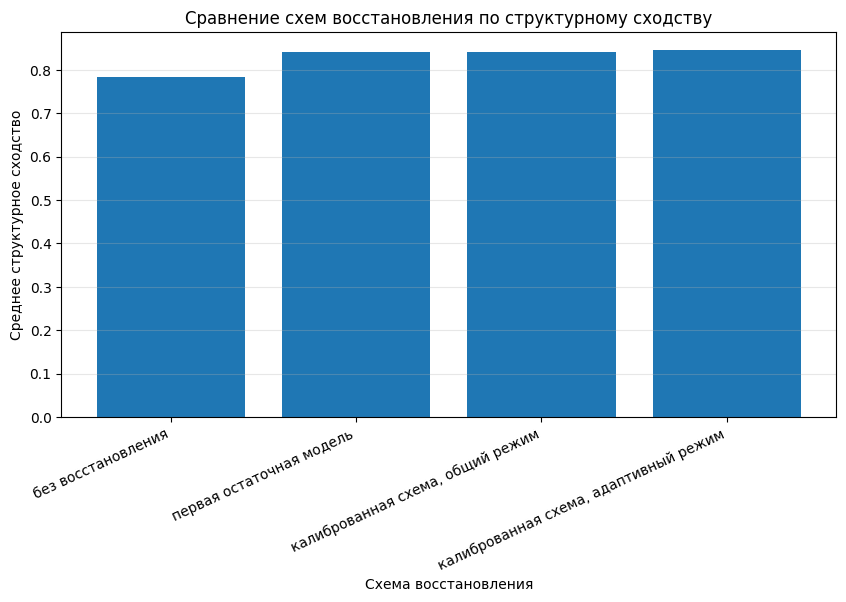

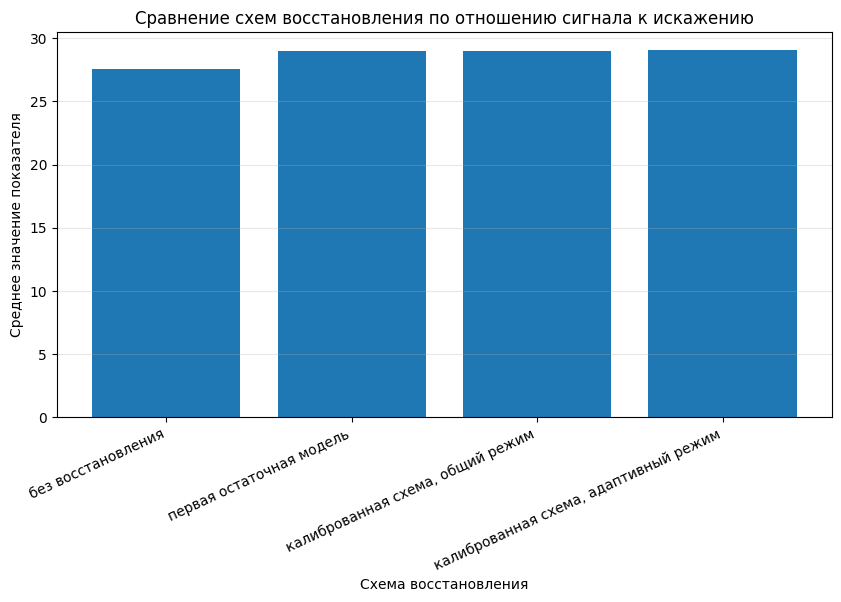

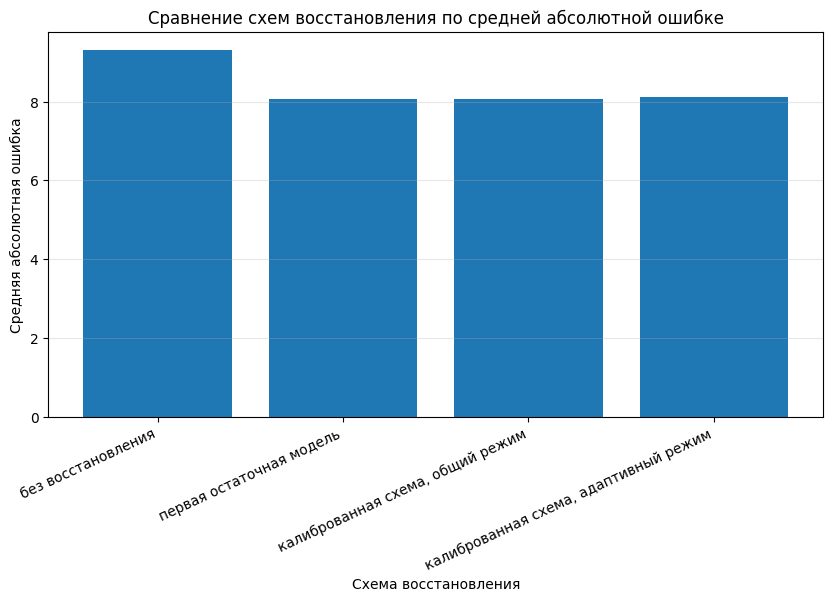

Рисунки сравнения сохранены:
/content/image_restoration_experiment/results/figures/calibrated_comparison_structure_second_experiment.png
/content/image_restoration_experiment/results/figures/calibrated_comparison_signal_second_experiment.png
/content/image_restoration_experiment/results/figures/calibrated_comparison_error_second_experiment.png


In [50]:
comparison_rows = []

# Добавляем вариант без восстановления.
comparison_rows.append({
    "model_name_ru": "без восстановления",
    "restored_signal_noise_ratio": type_summary["degraded_signal_noise_ratio"],
    "restored_structure_similarity": type_summary["degraded_structure_similarity"],
    "restored_mean_absolute_error": type_summary["degraded_mean_absolute_error"],
    "signal_noise_ratio_gain": 0.0,
    "structure_similarity_gain": 0.0,
    "absolute_error_gain": 0.0,
})

# Добавляем первую остаточную модель, если ее сводка была сохранена на этапе 8.
first_summary_path = REPORTS_DIR / "first_residual_valid_summary_second_experiment.json"

if first_summary_path.exists():
    with open(first_summary_path, "r", encoding="utf-8") as file:
        first_summary = json.load(file)

    comparison_rows.append({
        "model_name_ru": "первая остаточная модель",
        "restored_signal_noise_ratio": first_summary["среднее_отношение_сигнала_к_искажению_восстановленных_изображений"],
        "restored_structure_similarity": first_summary["среднее_структурное_сходство_восстановленных_изображений"],
        "restored_mean_absolute_error": first_summary["средняя_абсолютная_ошибка_восстановленных_изображений"],
        "signal_noise_ratio_gain": first_summary["средний_прирост_отношения_сигнала_к_искажению"],
        "structure_similarity_gain": first_summary["средний_прирост_структурного_сходства"],
        "absolute_error_gain": first_summary["среднее_снижение_абсолютной_ошибки"],
    })

# Добавляем калиброванный общий режим.
comparison_rows.append({
    "model_name_ru": "калиброванная схема, общий режим",
    "restored_signal_noise_ratio": global_summary["restored_signal_noise_ratio"],
    "restored_structure_similarity": global_summary["restored_structure_similarity"],
    "restored_mean_absolute_error": global_summary["restored_mean_absolute_error"],
    "signal_noise_ratio_gain": global_summary["signal_noise_ratio_gain"],
    "structure_similarity_gain": global_summary["structure_similarity_gain"],
    "absolute_error_gain": global_summary["absolute_error_gain"],
})

# Добавляем калиброванный адаптивный режим.
comparison_rows.append({
    "model_name_ru": "калиброванная схема, адаптивный режим",
    "restored_signal_noise_ratio": type_summary["restored_signal_noise_ratio"],
    "restored_structure_similarity": type_summary["restored_structure_similarity"],
    "restored_mean_absolute_error": type_summary["restored_mean_absolute_error"],
    "signal_noise_ratio_gain": type_summary["signal_noise_ratio_gain"],
    "structure_similarity_gain": type_summary["structure_similarity_gain"],
    "absolute_error_gain": type_summary["absolute_error_gain"],
})

model_comparison_table = pd.DataFrame(comparison_rows)

model_comparison_path = METRICS_DIR / "calibrated_model_comparison_second_experiment.csv"
model_comparison_table.to_csv(
    model_comparison_path,
    index=False,
    encoding="utf-8"
)

print("Сравнение моделей сохранено:", model_comparison_path)
display(model_comparison_table)

# Рисунок сравнения по структурному сходству.
plt.figure(figsize=(10, 5))
plt.bar(
    model_comparison_table["model_name_ru"],
    model_comparison_table["restored_structure_similarity"]
)
plt.title("Сравнение схем восстановления по структурному сходству")
plt.xlabel("Схема восстановления")
plt.ylabel("Среднее структурное сходство")
plt.xticks(rotation=25, ha="right")
plt.grid(axis="y", alpha=0.3)

calibrated_comparison_structure_path = FIGURES_DIR / "calibrated_comparison_structure_second_experiment.png"
plt.savefig(calibrated_comparison_structure_path, dpi=200, bbox_inches="tight")
plt.show()

# Рисунок сравнения по отношению сигнала к искажению.
plt.figure(figsize=(10, 5))
plt.bar(
    model_comparison_table["model_name_ru"],
    model_comparison_table["restored_signal_noise_ratio"]
)
plt.title("Сравнение схем восстановления по отношению сигнала к искажению")
plt.xlabel("Схема восстановления")
plt.ylabel("Среднее значение показателя")
plt.xticks(rotation=25, ha="right")
plt.grid(axis="y", alpha=0.3)

calibrated_comparison_signal_path = FIGURES_DIR / "calibrated_comparison_signal_second_experiment.png"
plt.savefig(calibrated_comparison_signal_path, dpi=200, bbox_inches="tight")
plt.show()

# Рисунок сравнения по средней абсолютной ошибке.
plt.figure(figsize=(10, 5))
plt.bar(
    model_comparison_table["model_name_ru"],
    model_comparison_table["restored_mean_absolute_error"]
)
plt.title("Сравнение схем восстановления по средней абсолютной ошибке")
plt.xlabel("Схема восстановления")
plt.ylabel("Средняя абсолютная ошибка")
plt.xticks(rotation=25, ha="right")
plt.grid(axis="y", alpha=0.3)

calibrated_comparison_error_path = FIGURES_DIR / "calibrated_comparison_error_second_experiment.png"
plt.savefig(calibrated_comparison_error_path, dpi=200, bbox_inches="tight")
plt.show()

print("Рисунки сравнения сохранены:")
print(calibrated_comparison_structure_path)
print(calibrated_comparison_signal_path)
print(calibrated_comparison_error_path)

/tmp/ipykernel_3661/1797315834.py:5: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda group: group.sample(1, random_state=42))


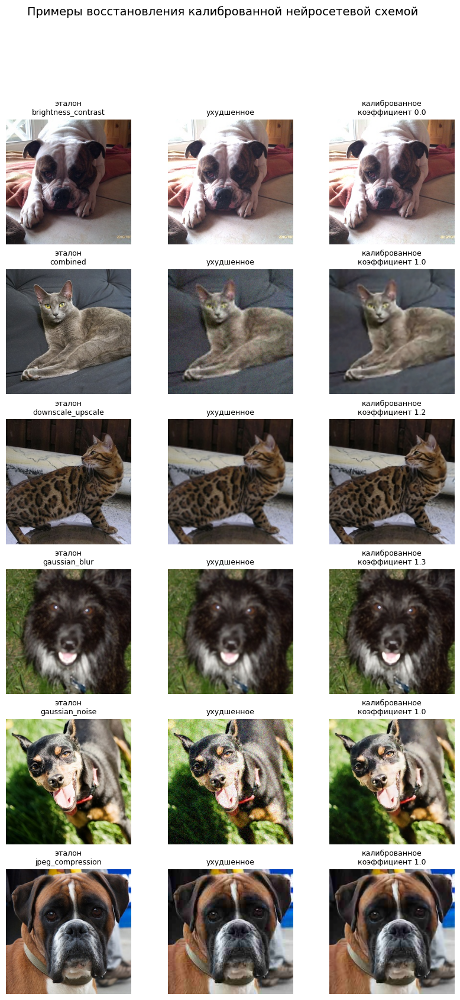

Рисунок с примерами калиброванного восстановления сохранен: /content/image_restoration_experiment/results/examples/calibrated_restoration_examples_second_experiment.png


In [51]:
# Выбираем по одному примеру каждого типа ухудшения.
example_table = (
    valid_table
    .groupby("degradation_type", group_keys=False)
    .apply(lambda group: group.sample(1, random_state=42))
    .reset_index(drop=True)
)

example_table = example_table.head(6)

visual_rows = []

model.eval()

with torch.no_grad():
    for _, row in example_table.iterrows():
        degraded_image = Image.open(row["degraded_image_path"]).convert("RGB")
        original_image = Image.open(row["original_image_path"]).convert("RGB")

        degraded_array_float = np.array(degraded_image, dtype=np.float32) / 255.0

        degraded_tensor = (
            torch.from_numpy(degraded_array_float)
            .permute(2, 0, 1)
            .unsqueeze(0)
            .to(DEVICE)
        )

        with torch.amp.autocast(device_type="cuda", dtype=torch.float16):
            neural_restored_tensor = model(degraded_tensor)

        neural_correction = neural_restored_tensor - degraded_tensor

        degradation_type = row["degradation_type"]
        selected_strength = correction_strength_by_type.get(
            degradation_type,
            best_global_strength
        )

        calibrated_tensor = torch.clamp(
            degraded_tensor + selected_strength * neural_correction,
            0.0,
            1.0
        )

        visual_rows.append({
            "degradation_type": degradation_type,
            "selected_strength": selected_strength,
            "original": np.array(original_image, dtype=np.uint8),
            "degraded": np.array(degraded_image, dtype=np.uint8),
            "restored": tensor_to_image_array(calibrated_tensor[0]),
        })

rows = len(visual_rows)
cols = 3

plt.figure(figsize=(10, 3.2 * rows))

for row_index, item in enumerate(visual_rows):
    plt.subplot(rows, cols, row_index * cols + 1)
    plt.imshow(item["original"])
    plt.title("эталон\n" + item["degradation_type"], fontsize=9)
    plt.axis("off")

    plt.subplot(rows, cols, row_index * cols + 2)
    plt.imshow(item["degraded"])
    plt.title("ухудшенное", fontsize=9)
    plt.axis("off")

    plt.subplot(rows, cols, row_index * cols + 3)
    plt.imshow(item["restored"])
    plt.title(
        "калиброванное\nкоэффициент " + str(round(item["selected_strength"], 2)),
        fontsize=9
    )
    plt.axis("off")

plt.suptitle("Примеры восстановления калиброванной нейросетевой схемой", fontsize=14)

calibrated_examples_path = EXAMPLES_DIR / "calibrated_restoration_examples_second_experiment.png"
plt.savefig(calibrated_examples_path, dpi=200, bbox_inches="tight")
plt.show()

print("Рисунок с примерами калиброванного восстановления сохранен:", calibrated_examples_path)

In [52]:
# Формируем файл настроек применения модели.
# Он понадобится приложению для правильной загрузки модели и выбора режима восстановления.
application_inference_config = {
    "дата_создания": datetime.now().strftime("%Y-%m-%d %H:%M:%S"),
    "название_схемы": "калиброванная нейросетевая схема восстановления изображений",
    "рабочий_размер_изображения": 256,
    "архитектура_модели": "первая остаточная сверточная модель",
    "путь_к_исходной_модели": str(first_model_path),
    "лучший_общий_коэффициент": best_global_strength,
    "лучшие_коэффициенты_по_типам": correction_strength_by_type,
    "режим_для_приложения_по_умолчанию": "общий коэффициент",
    "расширенный_режим_приложения": (
        "Пользователь может выбрать предполагаемый тип ухудшения, "
        "после чего применяется коэффициент для выбранного типа."
    ),
    "доступные_типы_ухудшений": sorted(list(correction_strength_by_type.keys())),
    "пояснение": (
        "Модель формирует нейросетевую поправку к ухудшенному изображению. "
        "Калибровочный коэффициент регулирует силу этой поправки."
    )
}

application_inference_config_path = EXPORT_DIR / "restoration_inference_config_second_experiment.json"

with open(application_inference_config_path, "w", encoding="utf-8") as file:
    json.dump(application_inference_config, file, ensure_ascii=False, indent=4)

# Сохраняем отдельный файл модели для приложения.
# Внутри находятся веса модели и все калибровочные коэффициенты.
application_model_path = EXPORT_DIR / "restoration_calibrated_model_second_experiment.pt"

torch.save(
    {
        "model_state_dict": model.state_dict(),
        "source_checkpoint_path": str(first_model_path),
        "architecture": "FirstResidualRestorationModel",
        "image_size": 256,
        "best_global_correction_strength": best_global_strength,
        "correction_strength_by_type": correction_strength_by_type,
        "available_degradation_types": sorted(list(correction_strength_by_type.keys())),
        "config": application_inference_config,
    },
    application_model_path
)

# Сохраняем паспорт этапа.
calibration_report = {
    "дата_создания": datetime.now().strftime("%Y-%m-%d %H:%M:%S"),
    "этап": "Калибровка улучшенной нейросетевой схемы восстановления изображений",
    "количество_изображений_проверочной_части": int(len(valid_table)),
    "проверенные_коэффициенты": correction_grid,
    "лучший_общий_коэффициент": best_global_strength,
    "лучшие_коэффициенты_по_типам": correction_strength_by_type,
    "сводка_общего_режима": global_summary,
    "сводка_адаптивного_режима": type_summary,
    "артефакт_модели_для_приложения": str(application_model_path),
    "артефакт_настроек_для_приложения": str(application_inference_config_path),
    "научный_вывод": (
        "Калибровка силы нейросетевой поправки позволяет учитывать различие "
        "между типами ухудшений и снижает риск чрезмерной обработки изображения."
    )
}

calibration_report_path = REPORTS_DIR / "calibration_report_second_experiment.json"

with open(calibration_report_path, "w", encoding="utf-8") as file:
    json.dump(calibration_report, file, ensure_ascii=False, indent=4)

print("Файл модели для приложения сохранен:", application_model_path)
print("Файл настроек для приложения сохранен:", application_inference_config_path)
print("Паспорт калибровки сохранен:", calibration_report_path)

Файл модели для приложения сохранен: /content/image_restoration_experiment/export/restoration_calibrated_model_second_experiment.pt
Файл настроек для приложения сохранен: /content/image_restoration_experiment/export/restoration_inference_config_second_experiment.json
Паспорт калибровки сохранен: /content/image_restoration_experiment/results/reports/calibration_report_second_experiment.json


In [53]:
DRIVE_PROJECT_DIR = Path("/content/drive/MyDrive/image_restoration_experiment")

if DRIVE_PROJECT_DIR.exists():
    drive_models_dir = DRIVE_PROJECT_DIR / "models"
    drive_metrics_dir = DRIVE_PROJECT_DIR / "metrics"
    drive_figures_dir = DRIVE_PROJECT_DIR / "figures"
    drive_reports_dir = DRIVE_PROJECT_DIR / "reports"
    drive_export_dir = DRIVE_PROJECT_DIR / "export"

    for directory in [
        drive_models_dir,
        drive_metrics_dir,
        drive_figures_dir,
        drive_reports_dir,
        drive_export_dir,
    ]:
        directory.mkdir(parents=True, exist_ok=True)

    files_to_copy = [
        calibration_grid_metrics_path,
        global_strength_summary_path,
        best_by_type_path,
        global_calibrated_metrics_path,
        type_calibrated_metrics_path,
        type_calibrated_by_type_path,
        model_comparison_path,
        calibrated_summary_path,
        calibration_report_path,
        calibrated_comparison_structure_path,
        calibrated_comparison_signal_path,
        calibrated_comparison_error_path,
        calibrated_examples_path,
        application_inference_config_path,
        application_model_path,
    ]

    for path in files_to_copy:
        path = Path(path)

        if path.exists():
            if path.suffix.lower() == ".pt":
                target_dir = drive_export_dir
            elif path.suffix.lower() == ".png":
                target_dir = drive_figures_dir
            elif path.suffix.lower() == ".json":
                if "inference_config" in path.name:
                    target_dir = drive_export_dir
                else:
                    target_dir = drive_reports_dir
            else:
                target_dir = drive_metrics_dir

            shutil.copy2(path, target_dir / path.name)

    print("Результаты этапа 9 сохранены на Google Диск")
    print("Каталог показателей:", drive_metrics_dir)
    print("Каталог рисунков:", drive_figures_dir)
    print("Каталог отчетов:", drive_reports_dir)
    print("Каталог файлов для приложения:", drive_export_dir)
else:
    print("Google Диск не найден. Файлы сохранены только в среде выполнения.")

Результаты этапа 9 сохранены на Google Диск
Каталог показателей: /content/drive/MyDrive/image_restoration_experiment/metrics
Каталог рисунков: /content/drive/MyDrive/image_restoration_experiment/figures
Каталог отчетов: /content/drive/MyDrive/image_restoration_experiment/reports
Каталог файлов для приложения: /content/drive/MyDrive/image_restoration_experiment/export


Калиброванная схема подтвердила, что нейросетевая обработка должна зависеть от типа ухудшения: для шума, размытия, сжатия и комбинированных искажений восстановление дает прирост, а для изменения яркости и контрастности лучший коэффициент равен 0, то есть безопаснее оставить изображение без дополнительной нейросетевой правки. Такой вывод хорошо подходит для работы, потому что показывает не только обучение модели, но и анализ условий ее применимости.

Адаптивный режим стал лучшим по двум главным показателям: отношение сигнала к искажению выросло до 29,04, структурное сходство — до 0,8446. При этом средняя абсолютная ошибка немного хуже, чем у первой остаточной модели: 8,105 против 8,066. Значит, в тексте работы нужно писать аккуратно: адаптивная схема лучше сохраняет структуру изображения и повышает численную близость по отношению сигнала к искажению, но не является лучшей по каждому отдельному показателю. Для приложения можно использовать два режима: автоматический общий режим как стабильный вариант и расширенный адаптивный режим при выборе типа ухудшения.

# 10. Финальная проверка калиброванной нейросетевой схемы на контрольной части

На данном этапе калиброванная нейросетевая схема проверяется на контрольной части набора данных. Контрольная часть ранее не использовалась ни для обучения модели, ни для выбора коэффициентов восстановления. Поэтому результаты данного этапа можно считать наиболее важными для вывода о качестве разработанного подхода.

Проверка проводится в нескольких режимах: без восстановления, с первой остаточной моделью, с общим калиброванным коэффициентом и с адаптивным коэффициентом по типу ухудшения. Такой порядок позволяет показать, дает ли итоговая схема реальное улучшение на новых изображениях и можно ли переносить сохраненные артефакты в пользовательское приложение.

In [54]:
# Импортируем библиотеки для работы с файлами, таблицами, числами и временем.
import json
import time
import shutil
from pathlib import Path
from datetime import datetime

# Импортируем библиотеки для численных расчетов и таблиц.
import numpy as np
import pandas as pd

# Импортируем библиотеку для изображений.
from PIL import Image

# Импортируем библиотеку для построения рисунков.
import matplotlib.pyplot as plt

# Импортируем библиотеку для применения нейросети.
# Тензор означает числовое представление изображения, с которым работает модель.
import torch
import torch.nn as nn
from torch.utils.data import Dataset
from torch.utils.data import DataLoader

# Импортируем функции для расчета качества изображений.
from skimage.metrics import peak_signal_noise_ratio
from skimage.metrics import structural_similarity

# Импортируем функцию для вывода таблиц.
from IPython.display import display

# Повторно задаем основные каталоги эксперимента.
PROJECT_DIR = Path("/content/image_restoration_experiment")
RESULTS_DIR = PROJECT_DIR / "results"

METRICS_DIR = RESULTS_DIR / "metrics"
MODELS_DIR = RESULTS_DIR / "models"
FIGURES_DIR = RESULTS_DIR / "figures"
EXAMPLES_DIR = RESULTS_DIR / "examples"
REPORTS_DIR = RESULTS_DIR / "reports"
EXPORT_DIR = PROJECT_DIR / "export"

for directory in [
    METRICS_DIR,
    MODELS_DIR,
    FIGURES_DIR,
    EXAMPLES_DIR,
    REPORTS_DIR,
    EXPORT_DIR,
]:
    directory.mkdir(parents=True, exist_ok=True)

# Проверяем наличие графического ускорителя.
if not torch.cuda.is_available():
    raise RuntimeError(
        "Графический ускоритель не найден. Необходимо включить T4 GPU и заново выполнить этап."
    )

DEVICE = torch.device("cuda")
torch.cuda.empty_cache()

# Задаем начальное число для повторяемости.
SEED = 42
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)

# Загружаем контрольную часть.
test_split_path = METRICS_DIR / "test_split_second_experiment.csv"

if not test_split_path.exists():
    raise FileNotFoundError(
        "Не найдена контрольная часть. Необходимо сначала выполнить этап 6."
    )

test_table = pd.read_csv(test_split_path)

required_columns = [
    "image_id",
    "original_image_path",
    "degraded_image_path",
    "degradation_type",
    "species_name_ru",
    "breed_name",
]

missing_columns = [
    column for column in required_columns
    if column not in test_table.columns
]

if missing_columns:
    raise ValueError(
        "В таблице контрольной части отсутствуют столбцы: " + ", ".join(missing_columns)
    )


def filter_existing_pairs(table):
    """
    Оставляет только пары, для которых существуют ухудшенное и эталонное изображения.
    """
    table = table.copy()

    table["original_file_exists"] = table["original_image_path"].apply(
        lambda value: Path(value).exists()
    )

    table["degraded_file_exists"] = table["degraded_image_path"].apply(
        lambda value: Path(value).exists()
    )

    table = table[
        (table["original_file_exists"] == True) &
        (table["degraded_file_exists"] == True)
    ].reset_index(drop=True)

    return table


test_table = filter_existing_pairs(test_table)

if len(test_table) == 0:
    raise RuntimeError("В контрольной части не осталось пригодных пар изображений.")

# Загружаем артефакт модели и файл настроек для приложения.
application_model_path = EXPORT_DIR / "restoration_calibrated_model_second_experiment.pt"
application_config_path = EXPORT_DIR / "restoration_inference_config_second_experiment.json"

if not application_model_path.exists():
    raise FileNotFoundError(
        "Не найден файл модели для приложения. Необходимо сначала выполнить этап 9."
    )

if not application_config_path.exists():
    raise FileNotFoundError(
        "Не найден файл настроек для приложения. Необходимо сначала выполнить этап 9."
    )

with open(application_config_path, "r", encoding="utf-8") as file:
    application_config = json.load(file)

print("Количество изображений контрольной части:", len(test_table))
print("Файл модели для приложения:", application_model_path)
print("Файл настроек для приложения:", application_config_path)
print("Устройство вычислений:", torch.cuda.get_device_name(0))

Количество изображений контрольной части: 1104
Файл модели для приложения: /content/image_restoration_experiment/export/restoration_calibrated_model_second_experiment.pt
Файл настроек для приложения: /content/image_restoration_experiment/export/restoration_inference_config_second_experiment.json
Устройство вычислений: Tesla T4


In [55]:
class RestorationImageDataset(Dataset):
    """
    Набор данных для восстановления изображений.

    Каждый элемент содержит ухудшенное изображение и эталонное изображение.
    Ухудшенное изображение подается на вход модели.
    Эталонное изображение используется для расчета качества.
    """

    def __init__(self, table):
        self.table = table.reset_index(drop=True)

    def __len__(self):
        return len(self.table)

    def _read_image_as_tensor(self, image_path):
        """
        Загружает изображение и переводит его в тензор.
        Значения пикселей приводятся к диапазону от нуля до единицы.
        """
        image = Image.open(image_path).convert("RGB")
        image_array = np.array(image, dtype=np.float32) / 255.0
        image_tensor = torch.from_numpy(image_array).permute(2, 0, 1)

        return image_tensor

    def __getitem__(self, index):
        row = self.table.iloc[index]

        degraded_tensor = self._read_image_as_tensor(row["degraded_image_path"])
        original_tensor = self._read_image_as_tensor(row["original_image_path"])

        return {
            "degraded": degraded_tensor,
            "original": original_tensor,
            "image_id": row["image_id"],
            "degradation_type": row["degradation_type"],
            "species_name_ru": row["species_name_ru"],
            "breed_name": row["breed_name"],
        }


class ResidualConvBlock(nn.Module):
    """
    Остаточный сверточный блок.

    Свертка извлекает локальные признаки изображения.
    Остаточная связь помогает сохранять структуру входного изображения.
    """

    def __init__(self, channels):
        super().__init__()

        self.block = nn.Sequential(
            nn.Conv2d(channels, channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(channels, channels, kernel_size=3, padding=1),
        )

    def forward(self, input_tensor):
        return input_tensor + self.block(input_tensor)


class FirstResidualRestorationModel(nn.Module):
    """
    Остаточная модель восстановления качества изображений.

    Модель вычисляет поправку к ухудшенному изображению.
    """

    def __init__(self, channels=64, block_count=8, correction_strength=0.35):
        super().__init__()

        self.correction_strength = correction_strength

        self.input_layer = nn.Sequential(
            nn.Conv2d(3, channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
        )

        self.blocks = nn.Sequential(
            *[ResidualConvBlock(channels) for _ in range(block_count)]
        )

        self.output_layer = nn.Conv2d(channels, 3, kernel_size=3, padding=1)

    def forward(self, input_tensor):
        features = self.input_layer(input_tensor)
        features = self.blocks(features)

        correction = torch.tanh(self.output_layer(features))
        restored = input_tensor + self.correction_strength * correction
        restored = torch.clamp(restored, 0.0, 1.0)

        return restored


# Создаем загрузчик контрольной части.
BATCH_SIZE = 8
NUM_WORKERS = 2

test_dataset = RestorationImageDataset(test_table)

test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=True
)

# Загружаем сохраненный артефакт модели.
try:
    application_artifact = torch.load(
        application_model_path,
        map_location=DEVICE,
        weights_only=False
    )
except TypeError:
    application_artifact = torch.load(
        application_model_path,
        map_location=DEVICE
    )

# Создаем модель с той же структурой, что и при сохранении.
model = FirstResidualRestorationModel(
    channels=64,
    block_count=8,
    correction_strength=0.35
).to(DEVICE)

model.load_state_dict(application_artifact["model_state_dict"])
model.eval()

best_global_correction_strength = float(
    application_artifact["best_global_correction_strength"]
)

correction_strength_by_type = {
    key: float(value)
    for key, value in application_artifact["correction_strength_by_type"].items()
}

print("Модель восстановлена из файла для приложения")
print("Лучший общий коэффициент:", best_global_correction_strength)
print("Коэффициенты по типам ухудшений:")
for key, value in correction_strength_by_type.items():
    print(key + ":", value)

Модель восстановлена из файла для приложения
Лучший общий коэффициент: 1.0
Коэффициенты по типам ухудшений:
brightness_contrast: 0.0
combined: 1.0
downscale_upscale: 1.2
gaussian_blur: 1.3
gaussian_noise: 1.0
jpeg_compression: 1.0
motion_blur: 1.2


In [56]:
def tensor_to_image_array(tensor):
    """
    Переводит тензор модели обратно в изображение.
    """
    image_array = tensor.detach().cpu().permute(1, 2, 0).numpy()
    image_array = np.clip(image_array * 255.0, 0, 255).astype(np.uint8)
    return image_array


def calculate_image_metrics(original_array, restored_array):
    """
    Рассчитывает показатели качества изображения относительно эталона.
    """
    signal_value = peak_signal_noise_ratio(
        original_array,
        restored_array,
        data_range=255
    )

    structure_value = structural_similarity(
        original_array,
        restored_array,
        channel_axis=-1,
        data_range=255
    )

    absolute_error = float(
        np.mean(
            np.abs(
                original_array.astype(np.float32) -
                restored_array.astype(np.float32)
            )
        )
    )

    squared_error = float(
        np.mean(
            (
                original_array.astype(np.float32) -
                restored_array.astype(np.float32)
            ) ** 2
        )
    )

    return {
        "signal_noise_ratio": float(signal_value),
        "structure_similarity": float(structure_value),
        "mean_absolute_error": float(absolute_error),
        "mean_squared_error": float(squared_error),
    }


@torch.no_grad()
def evaluate_final_modes(model, data_loader, device, global_strength, strength_by_type):
    """
    Проверяет несколько режимов восстановления на контрольной части.
    """
    model.eval()

    metric_rows = []
    processed_count = 0

    for batch in data_loader:
        degraded = batch["degraded"].to(device, non_blocking=True)
        original = batch["original"].to(device, non_blocking=True)

        with torch.amp.autocast(device_type="cuda", dtype=torch.float16):
            neural_restored = model(degraded)

        neural_correction = neural_restored - degraded

        for index in range(degraded.size(0)):
            image_id = batch["image_id"][index]
            degradation_type = batch["degradation_type"][index]
            species_name_ru = batch["species_name_ru"][index]
            breed_name = batch["breed_name"][index]

            original_array = tensor_to_image_array(original[index])
            degraded_array = tensor_to_image_array(degraded[index])

            # Первый режим: без восстановления.
            restored_variants = {
                "без восстановления": degraded[index],
                "первая остаточная модель": torch.clamp(
                    degraded[index] + 1.0 * neural_correction[index],
                    0.0,
                    1.0
                ),
                "калиброванная схема, общий режим": torch.clamp(
                    degraded[index] + global_strength * neural_correction[index],
                    0.0,
                    1.0
                ),
                "калиброванная схема, адаптивный режим": torch.clamp(
                    degraded[index] +
                    strength_by_type.get(degradation_type, global_strength) *
                    neural_correction[index],
                    0.0,
                    1.0
                ),
            }

            degraded_metrics = calculate_image_metrics(
                original_array=original_array,
                restored_array=degraded_array
            )

            for mode_name, restored_tensor in restored_variants.items():
                restored_array = tensor_to_image_array(restored_tensor)

                restored_metrics = calculate_image_metrics(
                    original_array=original_array,
                    restored_array=restored_array
                )

                metric_rows.append({
                    "image_id": image_id,
                    "species_name_ru": species_name_ru,
                    "breed_name": breed_name,
                    "degradation_type": degradation_type,
                    "mode_name": mode_name,
                    "degraded_signal_noise_ratio": degraded_metrics["signal_noise_ratio"],
                    "degraded_structure_similarity": degraded_metrics["structure_similarity"],
                    "degraded_mean_absolute_error": degraded_metrics["mean_absolute_error"],
                    "restored_signal_noise_ratio": restored_metrics["signal_noise_ratio"],
                    "restored_structure_similarity": restored_metrics["structure_similarity"],
                    "restored_mean_absolute_error": restored_metrics["mean_absolute_error"],
                    "restored_mean_squared_error": restored_metrics["mean_squared_error"],
                    "signal_noise_ratio_gain": (
                        restored_metrics["signal_noise_ratio"] -
                        degraded_metrics["signal_noise_ratio"]
                    ),
                    "structure_similarity_gain": (
                        restored_metrics["structure_similarity"] -
                        degraded_metrics["structure_similarity"]
                    ),
                    "absolute_error_gain": (
                        degraded_metrics["mean_absolute_error"] -
                        restored_metrics["mean_absolute_error"]
                    ),
                })

        processed_count += degraded.size(0)

        if processed_count % 200 == 0 or processed_count >= len(data_loader.dataset):
            print(
                "Обработано изображений:",
                processed_count,
                "из",
                len(data_loader.dataset)
            )

    return pd.DataFrame(metric_rows)


print("Начата финальная проверка на контрольной части")

start_time = time.time()

final_test_metrics = evaluate_final_modes(
    model=model,
    data_loader=test_loader,
    device=DEVICE,
    global_strength=best_global_correction_strength,
    strength_by_type=correction_strength_by_type
)

final_test_time = time.time() - start_time

final_test_metrics_path = METRICS_DIR / "final_test_metrics_second_experiment.csv"

final_test_metrics.to_csv(
    final_test_metrics_path,
    index=False,
    encoding="utf-8"
)

print("\nФинальная проверка завершена")
print("Время проверки, секунд:", round(final_test_time, 1))
print("Подробная таблица сохранена:", final_test_metrics_path)

display(final_test_metrics.head())

Начата финальная проверка на контрольной части
Обработано изображений: 200 из 1104
Обработано изображений: 400 из 1104
Обработано изображений: 600 из 1104
Обработано изображений: 800 из 1104
Обработано изображений: 1000 из 1104
Обработано изображений: 1104 из 1104

Финальная проверка завершена
Время проверки, секунд: 145.8
Подробная таблица сохранена: /content/image_restoration_experiment/results/metrics/final_test_metrics_second_experiment.csv


,image_id,species_name_ru,breed_name,degradation_type,mode_name,degraded_signal_noise_ratio,degraded_structure_similarity,degraded_mean_absolute_error,restored_signal_noise_ratio,restored_structure_similarity,restored_mean_absolute_error,restored_mean_squared_error,signal_noise_ratio_gain,structure_similarity_gain,absolute_error_gain
0,Abyssinian_106,кошка,Abyssinian,combined,без восстановления,26.191519,0.620855,9.697896,26.191519,0.620855,9.697896,156.289017,0.000000,0.000000,0.000000
1,Abyssinian_106,кошка,Abyssinian,combined,первая остаточная модель,26.191519,0.620855,9.697896,29.005264,0.808237,6.596125,81.762459,2.813746,0.187382,3.101771
2,Abyssinian_106,кошка,Abyssinian,combined,"калиброванная схема, общий режим",26.191519,0.620855,9.697896,29.005264,0.808237,6.596125,81.762459,2.813746,0.187382,3.101771
3,Abyssinian_106,кошка,Abyssinian,combined,"калиброванная схема, адаптивный режим",26.191519,0.620855,9.697896,29.005264,0.808237,6.596125,81.762459,2.813746,0.187382,3.101771
4,Abyssinian_113,кошка,Abyssinian,jpeg_compression,без восстановления,34.691412,0.904415,3.213948,34.691412,0.904415,3.213948,22.076956,0.000000,0.000000,0.000000


In [57]:
# Сводка по режимам восстановления.
final_test_summary_by_mode = (
    final_test_metrics
    .groupby("mode_name")[
        [
            "restored_signal_noise_ratio",
            "restored_structure_similarity",
            "restored_mean_absolute_error",
            "restored_mean_squared_error",
            "signal_noise_ratio_gain",
            "structure_similarity_gain",
            "absolute_error_gain",
        ]
    ]
    .mean()
    .reset_index()
)

# Для удобства сортируем режимы от лучшего к худшему по структурному сходству.
final_test_summary_by_mode = final_test_summary_by_mode.sort_values(
    by=[
        "restored_structure_similarity",
        "restored_signal_noise_ratio",
        "restored_mean_absolute_error",
    ],
    ascending=[False, False, True]
).reset_index(drop=True)

final_test_summary_by_mode_path = METRICS_DIR / "final_test_summary_by_mode_second_experiment.csv"

final_test_summary_by_mode.to_csv(
    final_test_summary_by_mode_path,
    index=False,
    encoding="utf-8"
)

# Сводка по типам ухудшений для адаптивного режима.
adaptive_test_metrics = final_test_metrics[
    final_test_metrics["mode_name"] == "калиброванная схема, адаптивный режим"
].copy()

final_test_adaptive_by_type = (
    adaptive_test_metrics
    .groupby("degradation_type")[
        [
            "degraded_signal_noise_ratio",
            "degraded_structure_similarity",
            "degraded_mean_absolute_error",
            "restored_signal_noise_ratio",
            "restored_structure_similarity",
            "restored_mean_absolute_error",
            "signal_noise_ratio_gain",
            "structure_similarity_gain",
            "absolute_error_gain",
        ]
    ]
    .mean()
    .reset_index()
)

final_test_adaptive_by_type_path = METRICS_DIR / "final_test_adaptive_by_type_second_experiment.csv"

final_test_adaptive_by_type.to_csv(
    final_test_adaptive_by_type_path,
    index=False,
    encoding="utf-8"
)

# Определяем лучший режим по структурному сходству.
best_final_mode_row = final_test_summary_by_mode.iloc[0]
best_final_mode_name = best_final_mode_row["mode_name"]

final_test_report = {
    "дата_создания": datetime.now().strftime("%Y-%m-%d %H:%M:%S"),
    "количество_изображений_контрольной_части": int(len(test_table)),
    "лучший_режим_по_структурному_сходству": str(best_final_mode_name),
    "среднее_отношение_сигнала_к_искажению_лучшего_режима": float(
        best_final_mode_row["restored_signal_noise_ratio"]
    ),
    "среднее_структурное_сходство_лучшего_режима": float(
        best_final_mode_row["restored_structure_similarity"]
    ),
    "средняя_абсолютная_ошибка_лучшего_режима": float(
        best_final_mode_row["restored_mean_absolute_error"]
    ),
    "средний_прирост_отношения_сигнала_к_искажению_лучшего_режима": float(
        best_final_mode_row["signal_noise_ratio_gain"]
    ),
    "средний_прирост_структурного_сходства_лучшего_режима": float(
        best_final_mode_row["structure_similarity_gain"]
    ),
    "среднее_снижение_абсолютной_ошибки_лучшего_режима": float(
        best_final_mode_row["absolute_error_gain"]
    ),
    "использованный_общий_коэффициент": float(best_global_correction_strength),
    "использованные_коэффициенты_по_типам": correction_strength_by_type,
    "пояснение": (
        "Контрольная часть не использовалась при обучении модели и подборе коэффициентов. "
        "Поэтому показатели данного этапа используются как финальная оценка второго эксперимента."
    )
}

final_test_report_path = REPORTS_DIR / "final_test_report_second_experiment.json"

with open(final_test_report_path, "w", encoding="utf-8") as file:
    json.dump(final_test_report, file, ensure_ascii=False, indent=4)

print("Сводка по режимам сохранена:", final_test_summary_by_mode_path)
print("Сводка адаптивного режима по типам сохранена:", final_test_adaptive_by_type_path)
print("Отчет финальной проверки сохранен:", final_test_report_path)

print("\nСводка по режимам восстановления:")
display(final_test_summary_by_mode)

print("\nСводка адаптивного режима по типам ухудшений:")
display(final_test_adaptive_by_type)

print("\nЛучший режим:", best_final_mode_name)

Сводка по режимам сохранена: /content/image_restoration_experiment/results/metrics/final_test_summary_by_mode_second_experiment.csv
Сводка адаптивного режима по типам сохранена: /content/image_restoration_experiment/results/metrics/final_test_adaptive_by_type_second_experiment.csv
Отчет финальной проверки сохранен: /content/image_restoration_experiment/results/reports/final_test_report_second_experiment.json

Сводка по режимам восстановления:


,mode_name,restored_signal_noise_ratio,restored_structure_similarity,restored_mean_absolute_error,restored_mean_squared_error,signal_noise_ratio_gain,structure_similarity_gain,absolute_error_gain
0,"калиброванная схема, адаптивный режим",28.740678,0.847149,8.743103,225.796459,1.498224,0.059642,1.188989
1,"калиброванная схема, общий режим",28.724631,0.844025,8.678340,221.451979,1.482177,0.056518,1.253752
2,первая остаточная модель,28.724631,0.844025,8.678340,221.451979,1.482177,0.056518,1.253752
3,без восстановления,27.242454,0.787507,9.932092,256.904489,0.000000,0.000000,0.000000



Сводка адаптивного режима по типам ухудшений:


,degradation_type,degraded_signal_noise_ratio,degraded_structure_similarity,degraded_mean_absolute_error,restored_signal_noise_ratio,restored_structure_similarity,restored_mean_absolute_error,signal_noise_ratio_gain,structure_similarity_gain,absolute_error_gain
0,brightness_contrast,20.996213,0.882807,25.755682,20.996213,0.882807,25.755682,0.000000,0.000000,0.000000
1,combined,26.839180,0.681356,8.790202,28.599135,0.792910,6.913011,1.759955,0.111554,1.877191
2,downscale_upscale,30.003744,0.865562,5.563330,30.717790,0.886231,5.255936,0.714047,0.020669,0.307393
3,gaussian_blur,28.967769,0.828878,6.059318,30.661774,0.863654,5.236723,1.694006,0.034777,0.822594
4,gaussian_noise,26.873630,0.659721,9.515400,32.028815,0.877288,5.034267,5.155185,0.217567,4.481132
5,jpeg_compression,30.169663,0.860467,6.024653,30.623283,0.870564,5.738846,0.453620,0.010097,0.285807
6,motion_blur,26.204587,0.726708,8.590030,26.521020,0.736922,8.361394,0.316433,0.010214,0.228636



Лучший режим: калиброванная схема, адаптивный режим


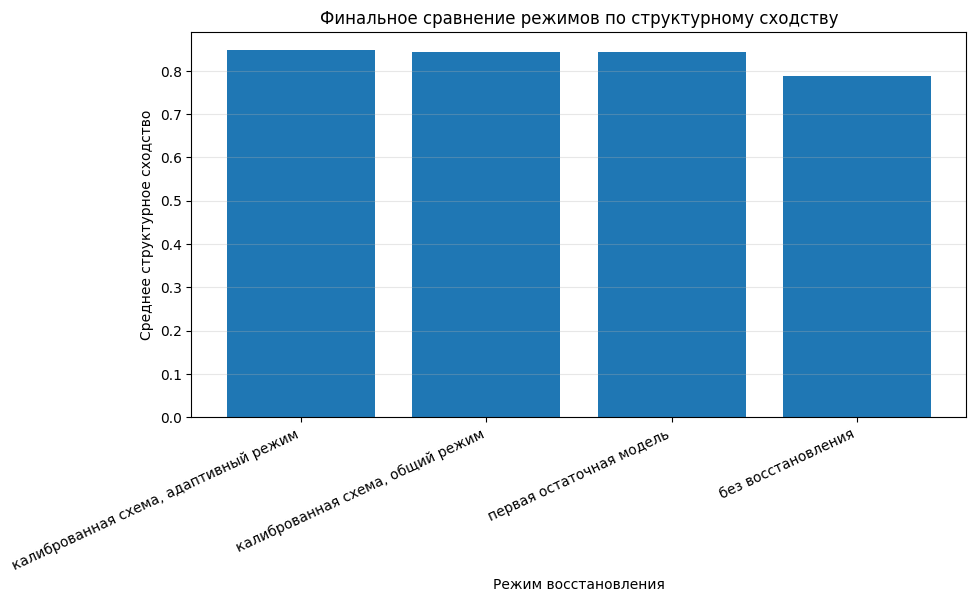

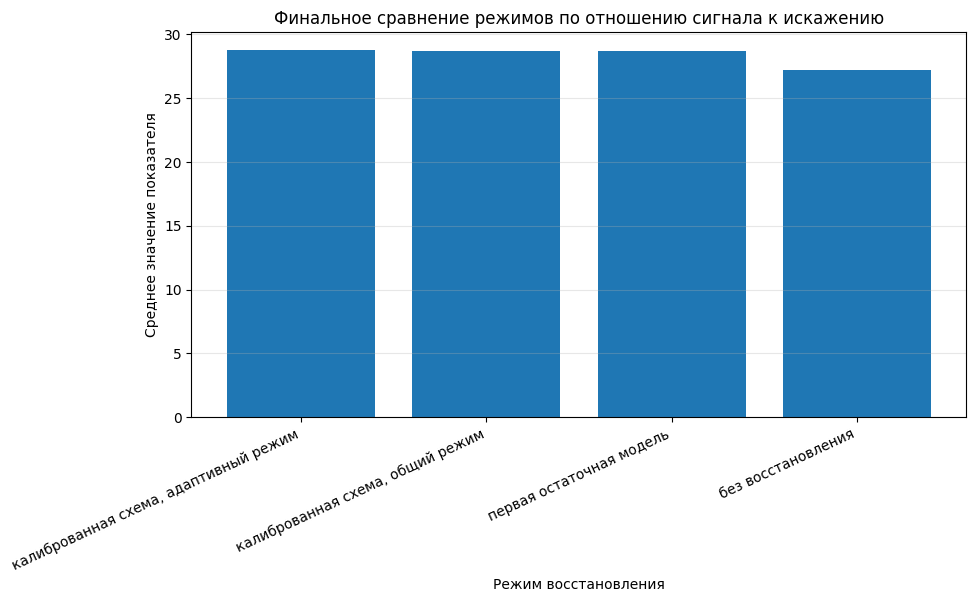

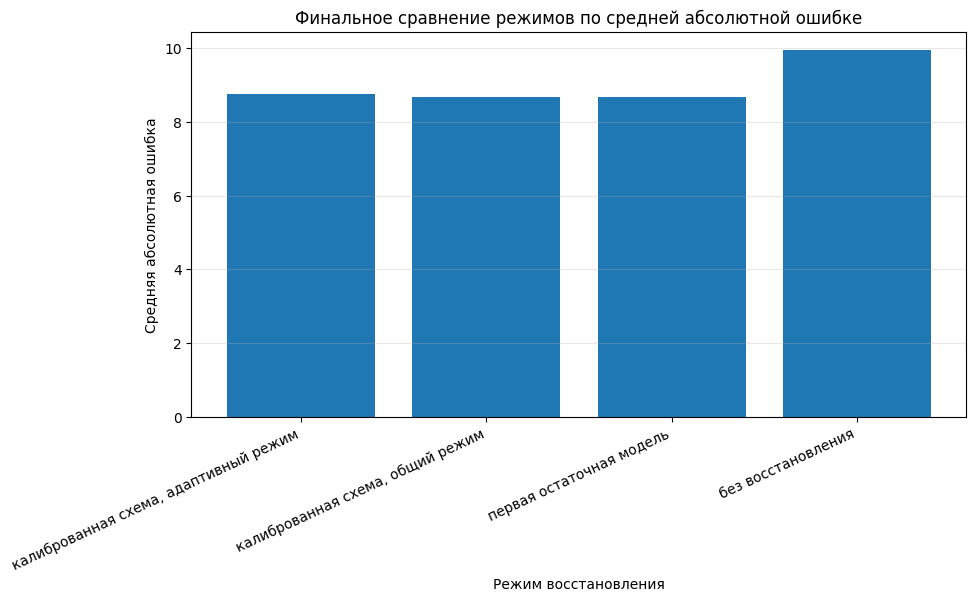

Рисунки финального сравнения сохранены:
/content/image_restoration_experiment/results/figures/final_test_structure_similarity_second_experiment.png
/content/image_restoration_experiment/results/figures/final_test_signal_noise_ratio_second_experiment.png
/content/image_restoration_experiment/results/figures/final_test_mean_absolute_error_second_experiment.png


In [58]:
# Рисунок сравнения по структурному сходству.
plt.figure(figsize=(10, 5))
plt.bar(
    final_test_summary_by_mode["mode_name"],
    final_test_summary_by_mode["restored_structure_similarity"]
)
plt.title("Финальное сравнение режимов по структурному сходству")
plt.xlabel("Режим восстановления")
plt.ylabel("Среднее структурное сходство")
plt.xticks(rotation=25, ha="right")
plt.grid(axis="y", alpha=0.3)

final_structure_figure_path = FIGURES_DIR / "final_test_structure_similarity_second_experiment.png"
plt.savefig(final_structure_figure_path, dpi=200, bbox_inches="tight")
plt.show()

# Рисунок сравнения по отношению сигнала к искажению.
plt.figure(figsize=(10, 5))
plt.bar(
    final_test_summary_by_mode["mode_name"],
    final_test_summary_by_mode["restored_signal_noise_ratio"]
)
plt.title("Финальное сравнение режимов по отношению сигнала к искажению")
plt.xlabel("Режим восстановления")
plt.ylabel("Среднее значение показателя")
plt.xticks(rotation=25, ha="right")
plt.grid(axis="y", alpha=0.3)

final_signal_figure_path = FIGURES_DIR / "final_test_signal_noise_ratio_second_experiment.png"
plt.savefig(final_signal_figure_path, dpi=200, bbox_inches="tight")
plt.show()

# Рисунок сравнения по средней абсолютной ошибке.
plt.figure(figsize=(10, 5))
plt.bar(
    final_test_summary_by_mode["mode_name"],
    final_test_summary_by_mode["restored_mean_absolute_error"]
)
plt.title("Финальное сравнение режимов по средней абсолютной ошибке")
plt.xlabel("Режим восстановления")
plt.ylabel("Средняя абсолютная ошибка")
plt.xticks(rotation=25, ha="right")
plt.grid(axis="y", alpha=0.3)

final_error_figure_path = FIGURES_DIR / "final_test_mean_absolute_error_second_experiment.png"
plt.savefig(final_error_figure_path, dpi=200, bbox_inches="tight")
plt.show()

print("Рисунки финального сравнения сохранены:")
print(final_structure_figure_path)
print(final_signal_figure_path)
print(final_error_figure_path)

/tmp/ipykernel_3661/3012847131.py:5: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda group: group.sample(1, random_state=42))


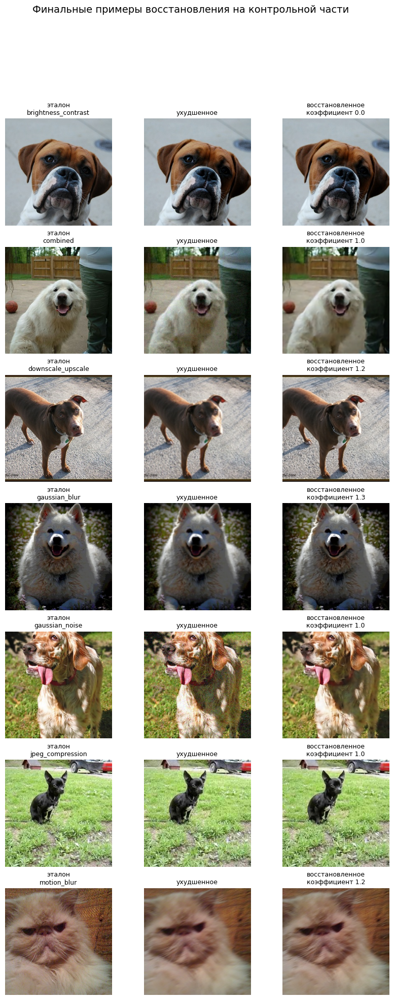

Рисунок с финальными примерами сохранен: /content/image_restoration_experiment/results/examples/final_test_restoration_examples_second_experiment.png


In [59]:
# Выбираем по одному примеру каждого типа ухудшения из контрольной части.
example_table = (
    test_table
    .groupby("degradation_type", group_keys=False)
    .apply(lambda group: group.sample(1, random_state=42))
    .reset_index(drop=True)
)

example_table = example_table.head(7)

visual_rows = []

model.eval()

with torch.no_grad():
    for _, row in example_table.iterrows():
        degraded_image = Image.open(row["degraded_image_path"]).convert("RGB")
        original_image = Image.open(row["original_image_path"]).convert("RGB")

        degraded_array_float = np.array(degraded_image, dtype=np.float32) / 255.0

        degraded_tensor = (
            torch.from_numpy(degraded_array_float)
            .permute(2, 0, 1)
            .unsqueeze(0)
            .to(DEVICE)
        )

        with torch.amp.autocast(device_type="cuda", dtype=torch.float16):
            neural_restored_tensor = model(degraded_tensor)

        neural_correction = neural_restored_tensor - degraded_tensor

        degradation_type = row["degradation_type"]

        selected_strength = correction_strength_by_type.get(
            degradation_type,
            best_global_correction_strength
        )

        calibrated_tensor = torch.clamp(
            degraded_tensor + selected_strength * neural_correction,
            0.0,
            1.0
        )

        visual_rows.append({
            "degradation_type": degradation_type,
            "selected_strength": selected_strength,
            "original": np.array(original_image, dtype=np.uint8),
            "degraded": np.array(degraded_image, dtype=np.uint8),
            "restored": tensor_to_image_array(calibrated_tensor[0]),
        })

rows = len(visual_rows)
cols = 3

plt.figure(figsize=(10, 3.2 * rows))

for row_index, item in enumerate(visual_rows):
    plt.subplot(rows, cols, row_index * cols + 1)
    plt.imshow(item["original"])
    plt.title("эталон\n" + item["degradation_type"], fontsize=9)
    plt.axis("off")

    plt.subplot(rows, cols, row_index * cols + 2)
    plt.imshow(item["degraded"])
    plt.title("ухудшенное", fontsize=9)
    plt.axis("off")

    plt.subplot(rows, cols, row_index * cols + 3)
    plt.imshow(item["restored"])
    plt.title(
        "восстановленное\nкоэффициент " + str(round(item["selected_strength"], 2)),
        fontsize=9
    )
    plt.axis("off")

plt.suptitle("Финальные примеры восстановления на контрольной части", fontsize=14)

final_examples_path = EXAMPLES_DIR / "final_test_restoration_examples_second_experiment.png"
plt.savefig(final_examples_path, dpi=200, bbox_inches="tight")
plt.show()

print("Рисунок с финальными примерами сохранен:", final_examples_path)

In [60]:
# Итоговый паспорт показывает, какие файлы нужно перенести на рабочий компьютер.
application_artifact_manifest = {
    "дата_создания": datetime.now().strftime("%Y-%m-%d %H:%M:%S"),
    "назначение": "артефакты для пользовательского приложения восстановления изображений",
    "модель": {
        "путь": str(application_model_path),
        "описание": (
            "Файл содержит веса нейросетевой модели и коэффициенты калибровки "
            "для общего и адаптивного режимов восстановления."
        )
    },
    "настройки_применения": {
        "путь": str(application_config_path),
        "описание": (
            "Файл содержит рабочий размер изображения, список типов ухудшений "
            "и коэффициенты восстановления."
        )
    },
    "финальная_проверка": {
        "подробная_таблица": str(final_test_metrics_path),
        "сводка_по_режимам": str(final_test_summary_by_mode_path),
        "сводка_по_типам": str(final_test_adaptive_by_type_path),
        "отчет": str(final_test_report_path),
        "лучший_режим": str(best_final_mode_name),
    },
    "рисунки": {
        "структурное_сходство": str(final_structure_figure_path),
        "отношение_сигнала_к_искажению": str(final_signal_figure_path),
        "средняя_абсолютная_ошибка": str(final_error_figure_path),
        "примеры_восстановления": str(final_examples_path),
    },
    "рекомендация_для_приложения": (
        "По умолчанию следует использовать общий режим. "
        "Адаптивный режим целесообразно включить как расширенную настройку, "
        "когда пользователь выбирает предполагаемый тип ухудшения изображения."
    )
}

application_artifact_manifest_path = EXPORT_DIR / "application_artifact_manifest_second_experiment.json"

with open(application_artifact_manifest_path, "w", encoding="utf-8") as file:
    json.dump(application_artifact_manifest, file, ensure_ascii=False, indent=4)

# Создаем итоговый архив только с файлами, которые нужны для приложения.
application_package_dir = EXPORT_DIR / "application_package_second_experiment"
application_package_dir.mkdir(parents=True, exist_ok=True)

files_for_application_package = [
    application_model_path,
    application_config_path,
    application_artifact_manifest_path,
    final_test_report_path,
    final_test_summary_by_mode_path,
    final_test_adaptive_by_type_path,
    final_examples_path,
]

for path in files_for_application_package:
    path = Path(path)

    if path.exists():
        shutil.copy2(path, application_package_dir / path.name)

application_package_archive = EXPORT_DIR / "application_package_second_experiment"

archive_path = shutil.make_archive(
    base_name=str(application_package_archive),
    format="zip",
    root_dir=str(application_package_dir)
)

print("Паспорт артефактов сохранен:", application_artifact_manifest_path)
print("Каталог итогового пакета:", application_package_dir)
print("Архив для переноса на рабочий компьютер:", archive_path)

Паспорт артефактов сохранен: /content/image_restoration_experiment/export/application_artifact_manifest_second_experiment.json
Каталог итогового пакета: /content/image_restoration_experiment/export/application_package_second_experiment
Архив для переноса на рабочий компьютер: /content/image_restoration_experiment/export/application_package_second_experiment.zip


In [61]:
DRIVE_PROJECT_DIR = Path("/content/drive/MyDrive/image_restoration_experiment")

if DRIVE_PROJECT_DIR.exists():
    drive_metrics_dir = DRIVE_PROJECT_DIR / "metrics"
    drive_figures_dir = DRIVE_PROJECT_DIR / "figures"
    drive_reports_dir = DRIVE_PROJECT_DIR / "reports"
    drive_export_dir = DRIVE_PROJECT_DIR / "export"

    for directory in [
        drive_metrics_dir,
        drive_figures_dir,
        drive_reports_dir,
        drive_export_dir,
    ]:
        directory.mkdir(parents=True, exist_ok=True)

    files_to_copy = [
        final_test_metrics_path,
        final_test_summary_by_mode_path,
        final_test_adaptive_by_type_path,
        final_test_report_path,
        final_structure_figure_path,
        final_signal_figure_path,
        final_error_figure_path,
        final_examples_path,
        application_artifact_manifest_path,
        Path(archive_path),
    ]

    for path in files_to_copy:
        path = Path(path)

        if path.exists():
            if path.suffix.lower() == ".png":
                target_dir = drive_figures_dir
            elif path.suffix.lower() == ".json":
                if "artifact_manifest" in path.name:
                    target_dir = drive_export_dir
                else:
                    target_dir = drive_reports_dir
            elif path.suffix.lower() == ".zip":
                target_dir = drive_export_dir
            else:
                target_dir = drive_metrics_dir

            shutil.copy2(path, target_dir / path.name)

    print("Финальные результаты этапа 10 сохранены на Google Диск")
    print("Каталог показателей:", drive_metrics_dir)
    print("Каталог рисунков:", drive_figures_dir)
    print("Каталог отчетов:", drive_reports_dir)
    print("Каталог файлов для приложения:", drive_export_dir)
else:
    print("Google Диск не найден. Файлы сохранены только в среде выполнения.")

Финальные результаты этапа 10 сохранены на Google Диск
Каталог показателей: /content/drive/MyDrive/image_restoration_experiment/metrics
Каталог рисунков: /content/drive/MyDrive/image_restoration_experiment/figures
Каталог отчетов: /content/drive/MyDrive/image_restoration_experiment/reports
Каталог файлов для приложения: /content/drive/MyDrive/image_restoration_experiment/export


Финальная проверка получилась удачной. На контрольной части, которая не участвовала ни в обучении, ни в подборе коэффициентов, нейросетевая обработка дала устойчивое улучшение: структурное сходство выросло с 0,7875 до 0,8471, отношение сигнала к искажению — с 27,24 до 28,74, средняя абсолютная ошибка снизилась с 9,93 до 8,74. Лучшим по структурному сходству стал адаптивный режим, а значит в диссертации можно обоснованно писать, что учет типа ухудшения повышает качество восстановления.

Важная оговорка: общий режим и первая остаточная модель немного лучше адаптивного режима по средней абсолютной ошибке: 8,68 против 8,74. Поэтому итоговый вывод должен быть аккуратным: адаптивная схема лучше сохраняет структуру изображения и дает лучший показатель отношения сигнала к искажению, но общий режим остается более простым и чуть более стабильным по пиксельной ошибке. Для приложения это даже хорошо: можно сделать два режима — автоматический общий и расширенный адаптивный с выбором типа ухудшения.

Артефактов уже достаточно для приложения: есть файл модели restoration_calibrated_model_second_experiment.pt, файл настроек restoration_inference_config_second_experiment.json, паспорт артефактов и архив application_package_second_experiment.zip. Теперь логично добавить часть с программным интерфейсом ChatGPT через ProxyAPI: не для генерации изображения, а для объяснения результата пользователю и формирования рекомендаций. Это соответствует исходной идее работы и почти не расходует ключи, потому что в запрос отправляются только численные показатели и краткое описание режима.

# 11. Формирование текстового отчета о восстановлении с помощью языковой модели

На данном этапе добавляется интеллектуальная часть будущего пользовательского приложения. Нейросетевая модель уже выполняет восстановление изображения, а языковая модель через программный интерфейс используется для понятного объяснения результата: какой режим применен, насколько улучшилось изображение, какие ограничения есть у обработки и какие действия можно рекомендовать пользователю.

Для экономии ключей в языковую модель не передаются изображения. Запрос содержит только численные показатели качества, тип ухудшения и краткое описание режима восстановления. Такой подход снижает стоимость использования программного интерфейса и делает систему воспроизводимой: изображение обрабатывается локальной нейросетевой моделью, а внешний сервис отвечает только за текстовую интерпретацию результата.

In [62]:
import os
import json
import time
import shutil
import urllib.request
import urllib.error
from pathlib import Path
from datetime import datetime

import pandas as pd
from IPython.display import display

# Основные каталоги эксперимента.
PROJECT_DIR = Path("/content/image_restoration_experiment")
RESULTS_DIR = PROJECT_DIR / "results"

METRICS_DIR = RESULTS_DIR / "metrics"
REPORTS_DIR = RESULTS_DIR / "reports"
EXPORT_DIR = PROJECT_DIR / "export"
LOGS_DIR = RESULTS_DIR / "logs"

for directory in [METRICS_DIR, REPORTS_DIR, EXPORT_DIR, LOGS_DIR]:
    directory.mkdir(parents=True, exist_ok=True)

# Возможные места расположения файла с настройками.
# Файл содержит ключ доступа и адрес программного интерфейса.
possible_env_paths = [
    PROJECT_DIR / ".env",
    Path("/content/.env"),
    Path("/content/drive/MyDrive/image_restoration_experiment/.env"),
]

env_path = None

for candidate_path in possible_env_paths:
    if candidate_path.exists():
        env_path = candidate_path
        break


def read_env_file(path):
    """
    Читает файл настроек.

    Формат строки: ИМЯ=ЗНАЧЕНИЕ.
    Пустые строки и комментарии пропускаются.
    """
    values = {}

    if path is None:
        return values

    with open(path, "r", encoding="utf-8") as file:
        for line in file:
            line = line.strip()

            if not line:
                continue

            if line.startswith("#"):
                continue

            if "=" not in line:
                continue

            key, value = line.split("=", 1)
            values[key.strip()] = value.strip().strip('"').strip("'")

    return values


env_values = read_env_file(env_path)

# Значения могут быть взяты из файла или из переменных среды выполнения.
PROXYAPI_API_KEY = env_values.get(
    "PROXYAPI_API_KEY",
    os.environ.get("PROXYAPI_API_KEY", "sk-OPoEkcu52ImrbAipDPohSxn5vkx1VZTB")
)

OPENAI_BASE_URL = env_values.get(
    "OPENAI_BASE_URL",
    os.environ.get("OPENAI_BASE_URL", "https://api.proxyapi.ru/openai/v1")
)

# Можно указать несколько моделей через запятую:
# MODEL_NAMES=gpt-4o-mini,gpt-4o
# Если списка нет, используется MODEL_NAME.
model_names_text = env_values.get(
    "MODEL_NAMES",
    os.environ.get(
        "MODEL_NAMES",
        env_values.get("MODEL_NAME", os.environ.get("MODEL_NAME", "gpt-4o-mini"))
    )
)

MODEL_NAMES = [
    model_name.strip()
    for model_name in model_names_text.split(",")
    if model_name.strip()
]

# Ограничиваем число моделей, чтобы не расходовать ключи.
MODEL_NAMES = MODEL_NAMES[:2]

LLM_TEMPERATURE = float(
    env_values.get("LLM_TEMPERATURE", os.environ.get("LLM_TEMPERATURE", "0.2"))
)

LLM_MAX_TOKENS = int(
    env_values.get("LLM_MAX_TOKENS", os.environ.get("LLM_MAX_TOKENS", "650"))
)

LLM_TIMEOUT_SECONDS = int(
    env_values.get("LLM_TIMEOUT_SECONDS", os.environ.get("LLM_TIMEOUT_SECONDS", "60"))
)


def mask_secret(value):
    """
    Маскирует ключ доступа при выводе.
    """
    if not value:
        return "ключ не найден"

    if len(value) <= 8:
        return "***"

    return value[:4] + "***" + value[-4:]


api_settings_report = {
    "дата_создания": datetime.now().strftime("%Y-%m-%d %H:%M:%S"),
    "файл_настроек": str(env_path) if env_path else "файл .env не найден",
    "адрес_программного_интерфейса": OPENAI_BASE_URL,
    "модели_для_проверки": MODEL_NAMES,
    "температура_ответа": LLM_TEMPERATURE,
    "ограничение_длины_ответа": LLM_MAX_TOKENS,
    "ключ_доступа": mask_secret(PROXYAPI_API_KEY),
}

api_settings_report_path = REPORTS_DIR / "api_settings_report_second_experiment.json"

with open(api_settings_report_path, "w", encoding="utf-8") as file:
    json.dump(api_settings_report, file, ensure_ascii=False, indent=4)

print("Файл настроек:", env_path if env_path else "не найден")
print("Адрес программного интерфейса:", OPENAI_BASE_URL)
print("Модели для проверки:", MODEL_NAMES)
print("Ключ доступа:", mask_secret(PROXYAPI_API_KEY))
print("Отчет о настройках сохранен:", api_settings_report_path)

Файл настроек: не найден
Адрес программного интерфейса: https://api.proxyapi.ru/openai/v1
Модели для проверки: ['gpt-4o-mini']
Ключ доступа: sk-O***VZTB
Отчет о настройках сохранен: /content/image_restoration_experiment/results/reports/api_settings_report_second_experiment.json


In [63]:
# Загружаем финальные результаты контрольной проверки.
final_summary_path = METRICS_DIR / "final_test_summary_by_mode_second_experiment.csv"
final_by_type_path = METRICS_DIR / "final_test_adaptive_by_type_second_experiment.csv"
artifact_manifest_path = EXPORT_DIR / "application_artifact_manifest_second_experiment.json"

if not final_summary_path.exists():
    raise FileNotFoundError(
        "Не найдена сводка финальной проверки. Необходимо сначала выполнить этап 10."
    )

if not final_by_type_path.exists():
    raise FileNotFoundError(
        "Не найдена сводка по типам ухудшений. Необходимо сначала выполнить этап 10."
    )

final_summary = pd.read_csv(final_summary_path)
final_by_type = pd.read_csv(final_by_type_path)

if artifact_manifest_path.exists():
    with open(artifact_manifest_path, "r", encoding="utf-8") as file:
        artifact_manifest = json.load(file)
else:
    artifact_manifest = {}

# Определяем лучший режим по структурному сходству.
best_mode_row = final_summary.sort_values(
    by=[
        "restored_structure_similarity",
        "restored_signal_noise_ratio",
        "restored_mean_absolute_error",
    ],
    ascending=[False, False, True]
).iloc[0]

best_mode_name = best_mode_row["mode_name"]

# Формируем компактный словарь для передачи в языковую модель.
# В запрос не включаются изображения, только численные результаты.
experiment_result_for_language_model = {
    "тема_эксперимента": (
        "Нейросетевое восстановление качества изображений животных "
        "на основе синтетически ухудшенных данных"
    ),
    "лучшая_схема": str(best_mode_name),
    "сводка_лучшей_схемы": {
        "отношение_сигнала_к_искажению": round(
            float(best_mode_row["restored_signal_noise_ratio"]), 4
        ),
        "структурное_сходство": round(
            float(best_mode_row["restored_structure_similarity"]), 4
        ),
        "средняя_абсолютная_ошибка": round(
            float(best_mode_row["restored_mean_absolute_error"]), 4
        ),
        "прирост_отношения_сигнала_к_искажению": round(
            float(best_mode_row["signal_noise_ratio_gain"]), 4
        ),
        "прирост_структурного_сходства": round(
            float(best_mode_row["structure_similarity_gain"]), 4
        ),
        "снижение_средней_абсолютной_ошибки": round(
            float(best_mode_row["absolute_error_gain"]), 4
        ),
    },
    "сравнение_режимов": final_summary.round(4).to_dict(orient="records"),
    "результаты_по_типам_ухудшений": final_by_type.round(4).to_dict(orient="records"),
    "рекомендация_для_приложения": (
        "Общий режим можно использовать как автоматический. "
        "Адаптивный режим целесообразно использовать, когда пользователь выбирает "
        "предполагаемый тип ухудшения изображения."
    ),
    "ограничение": (
        "Для изменения яркости и контрастности лучший коэффициент равен нулю, "
        "поэтому нейросетевая правка не применяется."
    ),
}

language_model_input_path = REPORTS_DIR / "language_model_input_second_experiment.json"

with open(language_model_input_path, "w", encoding="utf-8") as file:
    json.dump(
        experiment_result_for_language_model,
        file,
        ensure_ascii=False,
        indent=4
    )

print("Лучший режим:", best_mode_name)
print("Файл с данными для языковой модели сохранен:", language_model_input_path)

print("\nСводка режимов:")
display(final_summary)

print("\nСводка адаптивного режима по типам ухудшений:")
display(final_by_type)

Лучший режим: калиброванная схема, адаптивный режим
Файл с данными для языковой модели сохранен: /content/image_restoration_experiment/results/reports/language_model_input_second_experiment.json

Сводка режимов:


,mode_name,restored_signal_noise_ratio,restored_structure_similarity,restored_mean_absolute_error,restored_mean_squared_error,signal_noise_ratio_gain,structure_similarity_gain,absolute_error_gain
0,"калиброванная схема, адаптивный режим",28.740678,0.847149,8.743103,225.796459,1.498224,0.059642,1.188989
1,"калиброванная схема, общий режим",28.724631,0.844025,8.678340,221.451979,1.482177,0.056518,1.253752
2,первая остаточная модель,28.724631,0.844025,8.678340,221.451979,1.482177,0.056518,1.253752
3,без восстановления,27.242454,0.787507,9.932092,256.904489,0.000000,0.000000,0.000000



Сводка адаптивного режима по типам ухудшений:


,degradation_type,degraded_signal_noise_ratio,degraded_structure_similarity,degraded_mean_absolute_error,restored_signal_noise_ratio,restored_structure_similarity,restored_mean_absolute_error,signal_noise_ratio_gain,structure_similarity_gain,absolute_error_gain
0,brightness_contrast,20.996213,0.882807,25.755682,20.996213,0.882807,25.755682,0.000000,0.000000,0.000000
1,combined,26.839180,0.681356,8.790202,28.599135,0.792910,6.913011,1.759955,0.111554,1.877191
2,downscale_upscale,30.003744,0.865562,5.563330,30.717790,0.886231,5.255936,0.714047,0.020669,0.307393
3,gaussian_blur,28.967769,0.828878,6.059318,30.661774,0.863654,5.236723,1.694006,0.034777,0.822594
4,gaussian_noise,26.873630,0.659721,9.515400,32.028815,0.877288,5.034267,5.155185,0.217567,4.481132
5,jpeg_compression,30.169663,0.860467,6.024653,30.623283,0.870564,5.738846,0.453620,0.010097,0.285807
6,motion_blur,26.204587,0.726708,8.590030,26.521020,0.736922,8.361394,0.316433,0.010214,0.228636


In [64]:
def build_user_prompt(result_data):
    """
    Формирует короткий запрос к языковой модели.

    Запрос ограничен численными результатами, чтобы не расходовать ключи на обработку изображений.
    """
    return (
        "Сформируй понятный пользовательский отчет по результату нейросетевого "
        "восстановления изображения. Отчет должен быть на русском языке, без рекламного "
        "стиля и без чрезмерных обещаний. Нужно объяснить, что улучшилось, где есть "
        "ограничения, какой режим выбран и какие рекомендации можно дать пользователю.\n\n"
        "Данные эксперимента:\n"
        + json.dumps(result_data, ensure_ascii=False, indent=2)
    )


def call_chat_completion(model_name, user_prompt):
    """
    Отправляет один текстовый запрос в языковую модель.

    Используется обычный текстовый запрос без передачи изображения.
    """
    endpoint = OPENAI_BASE_URL.rstrip("/") + "/chat/completions"

    payload = {
        "model": model_name,
        "temperature": LLM_TEMPERATURE,
        "max_tokens": LLM_MAX_TOKENS,
        "messages": [
            {
                "role": "system",
                "content": (
                    "Ты помощник, который пишет ясные пользовательские отчеты "
                    "по результатам нейросетевой обработки изображений. "
                    "Не выдумывай чисел и не обещай невозможного. "
                    "Опирайся только на переданные показатели."
                ),
            },
            {
                "role": "user",
                "content": user_prompt,
            },
        ],
    }

    request_data = json.dumps(payload, ensure_ascii=False).encode("utf-8")

    request = urllib.request.Request(
        endpoint,
        data=request_data,
        method="POST",
        headers={
            "Authorization": "Bearer " + PROXYAPI_API_KEY,
            "Content-Type": "application/json",
        },
    )

    started_at = time.time()

    try:
        with urllib.request.urlopen(request, timeout=LLM_TIMEOUT_SECONDS) as response:
            response_text = response.read().decode("utf-8")
            response_json = json.loads(response_text)

        elapsed_seconds = time.time() - started_at

        answer_text = (
            response_json
            .get("choices", [{}])[0]
            .get("message", {})
            .get("content", "")
            .strip()
        )

        usage = response_json.get("usage", {})

        return {
            "model_name": model_name,
            "success": True,
            "elapsed_seconds": round(elapsed_seconds, 2),
            "answer_text": answer_text,
            "usage": usage,
            "error": "",
        }

    except urllib.error.HTTPError as error:
        error_body = error.read().decode("utf-8", errors="replace")

        return {
            "model_name": model_name,
            "success": False,
            "elapsed_seconds": round(time.time() - started_at, 2),
            "answer_text": "",
            "usage": {},
            "error": "Ошибка HTTP " + str(error.code) + ": " + error_body[:1200],
        }

    except Exception as error:
        return {
            "model_name": model_name,
            "success": False,
            "elapsed_seconds": round(time.time() - started_at, 2),
            "answer_text": "",
            "usage": {},
            "error": str(error),
        }


def build_fallback_report(result_data):
    """
    Создает локальный отчет без обращения к внешней языковой модели.

    Такой отчет нужен, если ключ доступа не указан или внешний сервис временно недоступен.
    """
    summary = result_data["сводка_лучшей_схемы"]

    report_text = (
        "По результатам обработки выбран адаптивный режим восстановления. "
        "Среднее структурное сходство восстановленных изображений составило "
        f"{summary['структурное_сходство']}, а отношение сигнала к искажению — "
        f"{summary['отношение_сигнала_к_искажению']}. По сравнению с ухудшенными "
        "изображениями наблюдается прирост структурного сходства на "
        f"{summary['прирост_структурного_сходства']} и снижение средней абсолютной "
        f"ошибки на {summary['снижение_средней_абсолютной_ошибки']}.\n\n"
        "Практический смысл результата состоит в том, что модель лучше всего справляется "
        "с шумом, комбинированными искажениями, размытием и сжатием изображения. "
        "Для изменения яркости и контрастности нейросетевая правка не применяется, "
        "поскольку проверка показала отсутствие пользы от дополнительного вмешательства.\n\n"
        "В пользовательском приложении рекомендуется использовать общий режим как "
        "автоматический вариант, а адаптивный режим — как расширенную настройку, "
        "когда пользователь указывает предполагаемый тип ухудшения."
    )

    return report_text


user_prompt = build_user_prompt(experiment_result_for_language_model)

api_call_results = []

if not PROXYAPI_API_KEY:
    print("Ключ доступа не найден. Будет создан локальный отчет без обращения к внешней модели.")
else:
    print("Начат вызов языковых моделей")
    print("Количество запросов:", len(MODEL_NAMES))

    for model_name in MODEL_NAMES:
        print("Запрос к модели:", model_name)

        result = call_chat_completion(
            model_name=model_name,
            user_prompt=user_prompt
        )

        api_call_results.append(result)

        if result["success"]:
            print("Ответ получен. Время, секунд:", result["elapsed_seconds"])
        else:
            print("Ответ не получен:", result["error"][:300])

# Если внешний ответ не получен, формируется локальный отчет.
successful_results = [
    result for result in api_call_results
    if result["success"] and result["answer_text"]
]

if successful_results:
    selected_language_report = successful_results[0]["answer_text"]
    selected_model_name = successful_results[0]["model_name"]
else:
    selected_language_report = build_fallback_report(experiment_result_for_language_model)
    selected_model_name = "локальный шаблон без внешнего запроса"

api_call_results_path = REPORTS_DIR / "api_call_results_second_experiment.json"

safe_api_call_results = []

for result in api_call_results:
    safe_api_call_results.append({
        "model_name": result["model_name"],
        "success": result["success"],
        "elapsed_seconds": result["elapsed_seconds"],
        "usage": result["usage"],
        "error": result["error"],
        "answer_preview": result["answer_text"][:500],
    })

with open(api_call_results_path, "w", encoding="utf-8") as file:
    json.dump(safe_api_call_results, file, ensure_ascii=False, indent=4)

print("\nВыбран источник текстового отчета:", selected_model_name)
print("Журнал обращений сохранен:", api_call_results_path)

Начат вызов языковых моделей
Количество запросов: 1
Запрос к модели: gpt-4o-mini
Ответ получен. Время, секунд: 15.79

Выбран источник текстового отчета: gpt-4o-mini
Журнал обращений сохранен: /content/image_restoration_experiment/results/reports/api_call_results_second_experiment.json


In [65]:
# Сохраняем отчет в текстовом формате с разметкой.
user_report_markdown = (
    "# Отчет о восстановлении изображения\n\n"
    f"Источник отчета: {selected_model_name}\n\n"
    + selected_language_report.strip()
    + "\n"
)

user_report_path = REPORTS_DIR / "user_restoration_report_second_experiment.md"

with open(user_report_path, "w", encoding="utf-8") as file:
    file.write(user_report_markdown)

# Создаем файл, который будет использоваться в приложении.
# Он содержит шаблон входных данных и готовый пример текстового ответа.
application_text_report_config = {
    "дата_создания": datetime.now().strftime("%Y-%m-%d %H:%M:%S"),
    "назначение": "настройки текстового объяснения результата восстановления",
    "использованный_источник": selected_model_name,
    "режим_экономии_ключей": (
        "В языковую модель передаются только численные показатели и описание режима. "
        "Изображения не отправляются."
    ),
    "входные_данные_для_отчета": experiment_result_for_language_model,
    "пример_отчета": selected_language_report,
    "рекомендация_для_приложения": (
        "В приложении языковую модель следует вызывать только после обработки изображения "
        "и только по кнопке пользователя. Для обычного просмотра результата достаточно "
        "локального шаблона отчета."
    ),
}

application_text_report_config_path = EXPORT_DIR / "text_report_config_second_experiment.json"

with open(application_text_report_config_path, "w", encoding="utf-8") as file:
    json.dump(
        application_text_report_config,
        file,
        ensure_ascii=False,
        indent=4
    )

print("Пользовательский отчет сохранен:", user_report_path)
print("Настройки текстового отчета для приложения сохранены:", application_text_report_config_path)

print("\nТекст отчета:")
print(selected_language_report)

Пользовательский отчет сохранен: /content/image_restoration_experiment/results/reports/user_restoration_report_second_experiment.md
Настройки текстового отчета для приложения сохранены: /content/image_restoration_experiment/export/text_report_config_second_experiment.json

Текст отчета:
# Отчет по результатам нейросетевого восстановления изображения

## Тема эксперимента
Нейросетевое восстановление качества изображений животных на основе синтетически ухудшенных данных.

## Выбранный режим
В ходе эксперимента была использована **калиброванная схема в адаптивном режиме**. Этот режим позволяет более точно восстанавливать изображения в зависимости от типа их ухудшения.

## Результаты
### Общие показатели
- **Отношение сигнала к искажению**: 28.7407
- **Структурное сходство**: 0.8471
- **Средняя абсолютная ошибка**: 8.7431

### Приросты по сравнению с исходными данными
- **Прирост отношения сигнала к искажению**: 1.4982
- **Прирост структурного сходства**: 0.0596
- **Снижение средней абсолю

In [66]:
# Добавляем файл текстового отчета и настройки объяснения результата в итоговый пакет.
application_package_dir = EXPORT_DIR / "application_package_second_experiment"
application_package_dir.mkdir(parents=True, exist_ok=True)

files_to_add_to_package = [
    user_report_path,
    application_text_report_config_path,
    api_settings_report_path,
    api_call_results_path,
    language_model_input_path,
]

for path in files_to_add_to_package:
    path = Path(path)

    if path.exists():
        shutil.copy2(path, application_package_dir / path.name)

# Пересоздаем архив итогового пакета.
application_package_archive = EXPORT_DIR / "application_package_second_experiment"

archive_path = shutil.make_archive(
    base_name=str(application_package_archive),
    format="zip",
    root_dir=str(application_package_dir)
)

# Формируем паспорт одиннадцатого этапа.
stage_11_report = {
    "дата_создания": datetime.now().strftime("%Y-%m-%d %H:%M:%S"),
    "этап": "Формирование текстового отчета о восстановлении с помощью языковой модели",
    "источник_выбранного_отчета": selected_model_name,
    "количество_внешних_запросов": len(api_call_results),
    "успешных_внешних_запросов": len(successful_results),
    "файл_пользовательского_отчета": str(user_report_path),
    "файл_настроек_для_приложения": str(application_text_report_config_path),
    "архив_артефактов": str(archive_path),
    "научный_вывод": (
        "Языковая модель используется как вспомогательный модуль интерпретации, "
        "а не как основной модуль генерации или восстановления изображения. "
        "Это разделяет вычислительную часть обработки изображений и пояснительную часть сервиса."
    ),
}

stage_11_report_path = REPORTS_DIR / "stage_11_language_report_second_experiment.json"

with open(stage_11_report_path, "w", encoding="utf-8") as file:
    json.dump(stage_11_report, file, ensure_ascii=False, indent=4)

print("Паспорт этапа 11 сохранен:", stage_11_report_path)
print("Обновленный архив для переноса на рабочий компьютер:", archive_path)

Паспорт этапа 11 сохранен: /content/image_restoration_experiment/results/reports/stage_11_language_report_second_experiment.json
Обновленный архив для переноса на рабочий компьютер: /content/image_restoration_experiment/export/application_package_second_experiment.zip


In [67]:
DRIVE_PROJECT_DIR = Path("/content/drive/MyDrive/image_restoration_experiment")

if DRIVE_PROJECT_DIR.exists():
    drive_reports_dir = DRIVE_PROJECT_DIR / "reports"
    drive_export_dir = DRIVE_PROJECT_DIR / "export"
    drive_logs_dir = DRIVE_PROJECT_DIR / "logs"

    for directory in [drive_reports_dir, drive_export_dir, drive_logs_dir]:
        directory.mkdir(parents=True, exist_ok=True)

    files_to_copy = [
        user_report_path,
        application_text_report_config_path,
        api_settings_report_path,
        api_call_results_path,
        language_model_input_path,
        stage_11_report_path,
        Path(archive_path),
    ]

    for path in files_to_copy:
        path = Path(path)

        if path.exists():
            if path.suffix.lower() == ".zip":
                target_dir = drive_export_dir
            elif path.name == "text_report_config_second_experiment.json":
                target_dir = drive_export_dir
            elif path.name == "api_call_results_second_experiment.json":
                target_dir = drive_logs_dir
            else:
                target_dir = drive_reports_dir

            shutil.copy2(path, target_dir / path.name)

    print("Результаты этапа 11 сохранены на Google Диск")
    print("Каталог отчетов:", drive_reports_dir)
    print("Каталог журналов:", drive_logs_dir)
    print("Каталог файлов для приложения:", drive_export_dir)
else:
    print("Google Диск не найден. Файлы сохранены только в среде выполнения.")

Результаты этапа 11 сохранены на Google Диск
Каталог отчетов: /content/drive/MyDrive/image_restoration_experiment/reports
Каталог журналов: /content/drive/MyDrive/image_restoration_experiment/logs
Каталог файлов для приложения: /content/drive/MyDrive/image_restoration_experiment/export


На данном этапе исправляется текстовый отчет, созданный с помощью языковой модели. Внешний запрос повторно не выполняется, поэтому ключ доступа не расходуется. Исправление нужно для того, чтобы отчет не содержал завышенных утверждений и точно соответствовал численным результатам контрольной проверки.

Итоговая формулировка сохраняет смысл этапа: языковая модель используется как вспомогательный модуль объяснения, а не как основной модуль восстановления изображения. При этом пользователь получает корректное пояснение: адаптивный режим лучше сохраняет структуру изображения, а общий режим немного лучше по средней пиксельной ошибке.

In [68]:
import json
import shutil
from pathlib import Path
from datetime import datetime

import pandas as pd

# Основные каталоги эксперимента.
PROJECT_DIR = Path("/content/image_restoration_experiment")
RESULTS_DIR = PROJECT_DIR / "results"

METRICS_DIR = RESULTS_DIR / "metrics"
REPORTS_DIR = RESULTS_DIR / "reports"
EXPORT_DIR = PROJECT_DIR / "export"

for directory in [METRICS_DIR, REPORTS_DIR, EXPORT_DIR]:
    directory.mkdir(parents=True, exist_ok=True)

# Пути к ранее созданным файлам.
final_summary_path = METRICS_DIR / "final_test_summary_by_mode_second_experiment.csv"
final_by_type_path = METRICS_DIR / "final_test_adaptive_by_type_second_experiment.csv"

user_report_path = REPORTS_DIR / "user_restoration_report_second_experiment.md"
application_text_report_config_path = EXPORT_DIR / "text_report_config_second_experiment.json"

application_package_dir = EXPORT_DIR / "application_package_second_experiment"
application_package_dir.mkdir(parents=True, exist_ok=True)

# Проверяем наличие итоговых таблиц.
if not final_summary_path.exists():
    raise FileNotFoundError(
        "Не найдена сводка финальной проверки. Необходимо сначала выполнить этап 10."
    )

if not final_by_type_path.exists():
    raise FileNotFoundError(
        "Не найдена сводка по типам ухудшений. Необходимо сначала выполнить этап 10."
    )

# Загружаем таблицы результатов.
final_summary = pd.read_csv(final_summary_path)
final_by_type = pd.read_csv(final_by_type_path)


def get_mode_row(table, mode_name):
    """
    Возвращает строку с показателями нужного режима восстановления.
    """
    rows = table[table["mode_name"] == mode_name]

    if len(rows) == 0:
        raise ValueError("Не найден режим восстановления: " + mode_name)

    return rows.iloc[0]


def get_type_row(table, degradation_type):
    """
    Возвращает строку с показателями нужного типа ухудшения.
    """
    rows = table[table["degradation_type"] == degradation_type]

    if len(rows) == 0:
        raise ValueError("Не найден тип ухудшения: " + degradation_type)

    return rows.iloc[0]


def rounded(value, digits=4):
    """
    Округляет числовое значение для текста отчета.
    """
    return round(float(value), digits)


# Получаем ключевые строки.
adaptive_row = get_mode_row(
    final_summary,
    "калиброванная схема, адаптивный режим"
)

global_row = get_mode_row(
    final_summary,
    "калиброванная схема, общий режим"
)

without_row = get_mode_row(
    final_summary,
    "без восстановления"
)

noise_row = get_type_row(final_by_type, "gaussian_noise")
combined_row = get_type_row(final_by_type, "combined")
blur_row = get_type_row(final_by_type, "gaussian_blur")
motion_row = get_type_row(final_by_type, "motion_blur")
brightness_row = get_type_row(final_by_type, "brightness_contrast")

# Формируем исправленный отчет.
corrected_report = f"""# Отчет по результатам нейросетевого восстановления изображения

## Назначение обработки

Система выполняет восстановление качества изображения после искусственных искажений. В эксперименте использовались изображения животных, для которых были сформированы пары: ухудшенное изображение и эталонное изображение. Нейросетевая модель восстанавливает изображение, а текстовый модуль объясняет результат пользователю на основе численных показателей.

## Выбранный режим

Лучшим по структурному сходству стал адаптивный режим калиброванной схемы восстановления. В данном режиме сила нейросетевой правки зависит от предполагаемого типа ухудшения изображения. Такой подход снижает риск чрезмерной обработки: например, для изменения яркости и контрастности коэффициент восстановления равен нулю, поэтому нейросетевая правка не применяется.

## Основные результаты

На контрольной части адаптивный режим показал следующие средние значения:

- отношение сигнала к искажению: {rounded(adaptive_row["restored_signal_noise_ratio"])};
- структурное сходство: {rounded(adaptive_row["restored_structure_similarity"])};
- средняя абсолютная ошибка: {rounded(adaptive_row["restored_mean_absolute_error"])}.

По сравнению с режимом без восстановления отношение сигнала к искажению увеличилось на {rounded(adaptive_row["signal_noise_ratio_gain"])}, структурное сходство увеличилось на {rounded(adaptive_row["structure_similarity_gain"])}, а средняя абсолютная ошибка снизилась на {rounded(adaptive_row["absolute_error_gain"])}.

## Сравнение режимов

Адаптивный режим является лучшим по структурному сходству и отношению сигнала к искажению. Общий режим и первая остаточная модель немного лучше по средней абсолютной ошибке: {rounded(global_row["restored_mean_absolute_error"])} против {rounded(adaptive_row["restored_mean_absolute_error"])} у адаптивного режима. Поэтому результат следует интерпретировать аккуратно: адаптивная схема лучше сохраняет визуальную структуру изображения, а общий режим немного стабильнее по средней пиксельной ошибке.

Режим без восстановления имеет худшие показатели: структурное сходство равно {rounded(without_row["restored_structure_similarity"])}, отношение сигнала к искажению равно {rounded(without_row["restored_signal_noise_ratio"])}, средняя абсолютная ошибка равна {rounded(without_row["restored_mean_absolute_error"])}. Это подтверждает практическую пользу нейросетевой обработки.

## Результаты по типам ухудшений

Наиболее заметный эффект получен для гауссова шума: отношение сигнала к искажению выросло на {rounded(noise_row["signal_noise_ratio_gain"])}, структурное сходство выросло на {rounded(noise_row["structure_similarity_gain"])}, средняя абсолютная ошибка снизилась на {rounded(noise_row["absolute_error_gain"])}. Для комбинированных ухудшений также получен выраженный прирост структурного сходства: {rounded(combined_row["structure_similarity_gain"])}. Для гауссова размытия прирост структурного сходства составил {rounded(blur_row["structure_similarity_gain"])}.

Для размытия движения эффект оказался слабее: структурное сходство выросло только на {rounded(motion_row["structure_similarity_gain"])}. Для изменения яркости и контрастности улучшение отсутствует, поскольку выбран коэффициент нулевой нейросетевой правки. Это означает, что модель не должна вмешиваться в такие изображения без отдельного механизма коррекции яркости.

## Практические рекомендации

В пользовательском приложении целесообразно использовать общий режим как автоматический вариант, когда тип ухудшения неизвестен. Адаптивный режим следует предложить как расширенную настройку: пользователь выбирает предполагаемый тип ухудшения, после чего система применяет соответствующий коэффициент восстановления.

Текстовый модуль следует запускать только после обработки изображения и расчета показателей. В языковую модель достаточно передавать численные значения и описание выбранного режима, без отправки самого изображения. Такой вариант снижает расход ключей и делает работу приложения более предсказуемой.
"""

# Сохраняем исправленный отчет.
with open(user_report_path, "w", encoding="utf-8") as file:
    file.write(corrected_report)

# Обновляем файл настроек текстового отчета для приложения.
if application_text_report_config_path.exists():
    with open(application_text_report_config_path, "r", encoding="utf-8") as file:
        text_report_config = json.load(file)
else:
    text_report_config = {}

text_report_config.update({
    "дата_исправления": datetime.now().strftime("%Y-%m-%d %H:%M:%S"),
    "назначение": "настройки текстового объяснения результата восстановления",
    "использованный_источник": "исправленный локальный отчет на основе ответа gpt-4o-mini",
    "причина_исправления": (
        "В исходном тексте языковой модели было завышенное утверждение о превосходстве "
        "адаптивного режима по всем показателям. Исправленный отчет учитывает, что "
        "адаптивный режим лучший по структурному сходству и отношению сигнала к искажению, "
        "а общий режим немного лучше по средней абсолютной ошибке."
    ),
    "пример_отчета": corrected_report,
    "режим_экономии_ключей": (
        "Повторный внешний запрос не выполнялся. Отчет сформирован локально "
        "на основе сохраненных численных результатов."
    ),
})

with open(application_text_report_config_path, "w", encoding="utf-8") as file:
    json.dump(text_report_config, file, ensure_ascii=False, indent=4)

# Добавляем исправленные файлы в пакет приложения.
for path in [user_report_path, application_text_report_config_path]:
    if path.exists():
        shutil.copy2(path, application_package_dir / path.name)

# Пересоздаем архив пакета приложения.
application_package_archive = EXPORT_DIR / "application_package_second_experiment"

archive_path = shutil.make_archive(
    base_name=str(application_package_archive),
    format="zip",
    root_dir=str(application_package_dir)
)

# Сохраняем паспорт исправления.
correction_report = {
    "дата_создания": datetime.now().strftime("%Y-%m-%d %H:%M:%S"),
    "этап": "Исправление пользовательского отчета",
    "исправленный_отчет": str(user_report_path),
    "настройки_текстового_отчета": str(application_text_report_config_path),
    "обновленный_архив": str(archive_path),
    "вывод": (
        "Текстовый отчет приведен в соответствие с численными результатами. "
        "Адаптивный режим признан лучшим по структурному сходству и отношению сигнала "
        "к искажению, но не по средней абсолютной ошибке."
    )
}

correction_report_path = REPORTS_DIR / "stage_11_report_correction_second_experiment.json"

with open(correction_report_path, "w", encoding="utf-8") as file:
    json.dump(correction_report, file, ensure_ascii=False, indent=4)

# Копируем исправленные файлы на Google Диск.
DRIVE_PROJECT_DIR = Path("/content/drive/MyDrive/image_restoration_experiment")

if DRIVE_PROJECT_DIR.exists():
    drive_reports_dir = DRIVE_PROJECT_DIR / "reports"
    drive_export_dir = DRIVE_PROJECT_DIR / "export"

    for directory in [drive_reports_dir, drive_export_dir]:
        directory.mkdir(parents=True, exist_ok=True)

    shutil.copy2(user_report_path, drive_reports_dir / user_report_path.name)
    shutil.copy2(correction_report_path, drive_reports_dir / correction_report_path.name)
    shutil.copy2(application_text_report_config_path, drive_export_dir / application_text_report_config_path.name)
    shutil.copy2(Path(archive_path), drive_export_dir / Path(archive_path).name)

    print("Исправленные файлы сохранены на Google Диск")
    print("Каталог отчетов:", drive_reports_dir)
    print("Каталог файлов для приложения:", drive_export_dir)

print("Исправленный пользовательский отчет сохранен:", user_report_path)
print("Настройки текстового отчета обновлены:", application_text_report_config_path)
print("Обновленный архив для переноса:", archive_path)

print("\nИсправленный отчет:")
print(corrected_report)

Исправленные файлы сохранены на Google Диск
Каталог отчетов: /content/drive/MyDrive/image_restoration_experiment/reports
Каталог файлов для приложения: /content/drive/MyDrive/image_restoration_experiment/export
Исправленный пользовательский отчет сохранен: /content/image_restoration_experiment/results/reports/user_restoration_report_second_experiment.md
Настройки текстового отчета обновлены: /content/image_restoration_experiment/export/text_report_config_second_experiment.json
Обновленный архив для переноса: /content/image_restoration_experiment/export/application_package_second_experiment.zip

Исправленный отчет:
# Отчет по результатам нейросетевого восстановления изображения

## Назначение обработки

Система выполняет восстановление качества изображения после искусственных искажений. В эксперименте использовались изображения животных, для которых были сформированы пары: ухудшенное изображение и эталонное изображение. Нейросетевая модель восстанавливает изображение, а текстовый модуль

# 12. Итоговая фиксация результатов второго эксперимента

На данном этапе формируется итоговый паспорт второго эксперимента. Он нужен для двух целей: во-первых, чтобы перенести результаты в текст магистерской диссертации; во-вторых, чтобы проверить готовность файлов для пользовательского приложения.

В итоговый отчет включаются сведения о наборе данных, способе ухудшения изображений, сравнении простых методов, результатах нейросетевых моделей, финальной контрольной проверке и сохраненных файлах. Такой отчет позволяет показать, что эксперимент завершен не отдельным обучением модели, а полноценным воспроизводимым конвейером от подготовки данных до выгрузки файлов для приложения.

In [69]:
import json
import shutil
from pathlib import Path
from datetime import datetime

import pandas as pd

# Основные каталоги эксперимента.
PROJECT_DIR = Path("/content/image_restoration_experiment")
RESULTS_DIR = PROJECT_DIR / "results"

METRICS_DIR = RESULTS_DIR / "metrics"
REPORTS_DIR = RESULTS_DIR / "reports"
FIGURES_DIR = RESULTS_DIR / "figures"
EXAMPLES_DIR = RESULTS_DIR / "examples"
EXPORT_DIR = PROJECT_DIR / "export"

for directory in [METRICS_DIR, REPORTS_DIR, FIGURES_DIR, EXAMPLES_DIR, EXPORT_DIR]:
    directory.mkdir(parents=True, exist_ok=True)

# Пути к основным итоговым файлам.
dataset_summary_path = METRICS_DIR / "dataset_summary_second_experiment.json"
pair_summary_path = METRICS_DIR / "restoration_pair_summary_second_experiment.json"
split_summary_path = REPORTS_DIR / "split_summary_second_experiment.json"

simple_methods_summary_path = METRICS_DIR / "simple_methods_summary_second_experiment.csv"
final_summary_path = METRICS_DIR / "final_test_summary_by_mode_second_experiment.csv"
final_by_type_path = METRICS_DIR / "final_test_adaptive_by_type_second_experiment.csv"

first_residual_summary_path = REPORTS_DIR / "first_residual_valid_summary_second_experiment.json"
calibration_report_path = REPORTS_DIR / "calibration_report_second_experiment.json"
final_test_report_path = REPORTS_DIR / "final_test_report_second_experiment.json"

user_report_path = REPORTS_DIR / "user_restoration_report_second_experiment.md"

application_model_path = EXPORT_DIR / "restoration_calibrated_model_second_experiment.pt"
application_config_path = EXPORT_DIR / "restoration_inference_config_second_experiment.json"
text_report_config_path = EXPORT_DIR / "text_report_config_second_experiment.json"
application_package_path = EXPORT_DIR / "application_package_second_experiment.zip"


def read_json_if_exists(path):
    """
    Читает файл с данными в формате json, если он существует.
    """
    path = Path(path)

    if not path.exists():
        return {}

    with open(path, "r", encoding="utf-8") as file:
        return json.load(file)


def read_text_if_exists(path):
    """
    Читает текстовый файл, если он существует.
    """
    path = Path(path)

    if not path.exists():
        return ""

    with open(path, "r", encoding="utf-8") as file:
        return file.read()


def check_file(path):
    """
    Проверяет наличие файла и возвращает краткое описание.
    """
    path = Path(path)

    return {
        "путь": str(path),
        "существует": path.exists(),
        "размер_байт": path.stat().st_size if path.exists() else 0,
    }


def rounded(value, digits=4):
    """
    Округляет значение для вывода в отчет.
    """
    return round(float(value), digits)


# Загружаем сведения из сохраненных файлов.
dataset_summary = read_json_if_exists(dataset_summary_path)
pair_summary = read_json_if_exists(pair_summary_path)
split_summary = read_json_if_exists(split_summary_path)

first_residual_summary = read_json_if_exists(first_residual_summary_path)
calibration_report = read_json_if_exists(calibration_report_path)
final_test_report = read_json_if_exists(final_test_report_path)

if not final_summary_path.exists():
    raise FileNotFoundError(
        "Не найдена итоговая сводка по режимам восстановления. Необходимо выполнить этап 10."
    )

if not final_by_type_path.exists():
    raise FileNotFoundError(
        "Не найдена итоговая сводка по типам ухудшений. Необходимо выполнить этап 10."
    )

final_summary = pd.read_csv(final_summary_path)
final_by_type = pd.read_csv(final_by_type_path)

if simple_methods_summary_path.exists():
    simple_methods_summary = pd.read_csv(simple_methods_summary_path)
else:
    simple_methods_summary = pd.DataFrame()

# Находим лучший режим по структурному сходству.
best_mode_row = final_summary.sort_values(
    by=[
        "restored_structure_similarity",
        "restored_signal_noise_ratio",
        "restored_mean_absolute_error",
    ],
    ascending=[False, False, True]
).iloc[0]

best_mode_name = best_mode_row["mode_name"]

# Находим режим без восстановления.
without_row = final_summary[
    final_summary["mode_name"] == "без восстановления"
].iloc[0]

# Находим общий режим.
global_row = final_summary[
    final_summary["mode_name"] == "калиброванная схема, общий режим"
].iloc[0]

# Проверяем ключевые файлы для приложения.
application_files = {
    "модель_восстановления": check_file(application_model_path),
    "настройки_применения_модели": check_file(application_config_path),
    "настройки_текстового_отчета": check_file(text_report_config_path),
    "архив_для_переноса": check_file(application_package_path),
    "пользовательский_отчет": check_file(user_report_path),
}

all_application_files_ready = all(
    item["существует"] and item["размер_байт"] > 0
    for item in application_files.values()
)

# Формируем итоговый паспорт второго эксперимента.
final_experiment_passport = {
    "дата_создания": datetime.now().strftime("%Y-%m-%d %H:%M:%S"),
    "название_эксперимента": (
        "Нейросетевое восстановление качества изображений животных "
        "на основе синтетически ухудшенных данных"
    ),
    "связь_с_темой_диссертации": (
        "Эксперимент относится к обработке изображений при помощи нейросетей. "
        "В нем реализована генерация ухудшенных вариантов изображений, обучение модели "
        "восстановления и подготовка файлов для пользовательского приложения."
    ),
    "научная_новизна": (
        "Предложен воспроизводимый конвейер, в котором реальные изображения животных "
        "автоматически преобразуются в пары ухудшенное изображение и эталонное изображение. "
        "После обучения нейросетевой модели выполнена калибровка силы восстановления "
        "по типам искажений, что позволяет применять правку избирательно."
    ),
    "набор_данных": {
        "количество_пригодных_изображений": dataset_summary.get(
            "количество_пригодных_записей"
        ),
        "количество_классов": dataset_summary.get("количество_классов"),
        "количество_кошек": dataset_summary.get("количество_кошек"),
        "количество_собак": dataset_summary.get("количество_собак"),
    },
    "подготовка_пар": {
        "количество_пар_изображений": pair_summary.get("количество_пар_изображений"),
        "рабочий_размер_изображения": pair_summary.get("рабочий_размер_изображения"),
        "среднее_структурное_сходство_ухудшенных_изображений": pair_summary.get(
            "среднее_ssim_ухудшенных_изображений"
        ),
        "среднее_отношение_сигнала_к_искажению_ухудшенных_изображений": pair_summary.get(
            "среднее_psnr_ухудшенных_изображений"
        ),
    },
    "разделение_данных": {
        "количество_обучающих_пар": split_summary.get("количество_обучающих_пар"),
        "количество_проверочных_пар": split_summary.get("количество_проверочных_пар"),
        "количество_контрольных_пар": split_summary.get("количество_контрольных_пар"),
        "способ_разделения": split_summary.get("способ_разделения"),
    },
    "лучшая_нейросетевая_схема": {
        "режим": str(best_mode_name),
        "отношение_сигнала_к_искажению": rounded(
            best_mode_row["restored_signal_noise_ratio"]
        ),
        "структурное_сходство": rounded(
            best_mode_row["restored_structure_similarity"]
        ),
        "средняя_абсолютная_ошибка": rounded(
            best_mode_row["restored_mean_absolute_error"]
        ),
        "прирост_отношения_сигнала_к_искажению": rounded(
            best_mode_row["signal_noise_ratio_gain"]
        ),
        "прирост_структурного_сходства": rounded(
            best_mode_row["structure_similarity_gain"]
        ),
        "снижение_средней_абсолютной_ошибки": rounded(
            best_mode_row["absolute_error_gain"]
        ),
    },
    "сравнение_с_режимом_без_восстановления": {
        "структурное_сходство_без_восстановления": rounded(
            without_row["restored_structure_similarity"]
        ),
        "структурное_сходство_лучшего_режима": rounded(
            best_mode_row["restored_structure_similarity"]
        ),
        "отношение_сигнала_к_искажению_без_восстановления": rounded(
            without_row["restored_signal_noise_ratio"]
        ),
        "отношение_сигнала_к_искажению_лучшего_режима": rounded(
            best_mode_row["restored_signal_noise_ratio"]
        ),
        "средняя_абсолютная_ошибка_без_восстановления": rounded(
            without_row["restored_mean_absolute_error"]
        ),
        "средняя_абсолютная_ошибка_лучшего_режима": rounded(
            best_mode_row["restored_mean_absolute_error"]
        ),
    },
    "важное_ограничение": (
        "Адаптивный режим лучший по структурному сходству и отношению сигнала к искажению. "
        "Общий режим немного лучше по средней абсолютной ошибке, поэтому в приложении "
        "целесообразно оставить оба режима."
    ),
    "готовность_к_приложению": {
        "все_ключевые_файлы_найдены": all_application_files_ready,
        "файлы": application_files,
    },
}

final_experiment_passport_path = REPORTS_DIR / "final_second_experiment_passport.json"

with open(final_experiment_passport_path, "w", encoding="utf-8") as file:
    json.dump(final_experiment_passport, file, ensure_ascii=False, indent=4)

print("Итоговый паспорт второго эксперимента сохранен:", final_experiment_passport_path)
print("Лучший режим:", best_mode_name)
print("Файлы для приложения готовы:", all_application_files_ready)

Итоговый паспорт второго эксперимента сохранен: /content/image_restoration_experiment/results/reports/final_second_experiment_passport.json
Лучший режим: калиброванная схема, адаптивный режим
Файлы для приложения готовы: True


In [71]:
# Формируем текст, который можно использовать как основу для раздела с описанием эксперимента.
dissertation_summary_text = f"""# Итог второго эксперимента

Во втором эксперименте была реализована задача нейросетевого восстановления качества изображений животных на основе синтетически ухудшенных данных. В качестве исходной основы использовался набор Oxford-IIIT Pet, содержащий изображения кошек и собак разных пород. Из исходных изображений были сформированы пары: эталонное изображение и ухудшенное изображение. Такой подход позволил получить контролируемую постановку задачи, где качество восстановления можно оценивать численно.

В ходе подготовки были использованы несколько типов искажений: шум, размытие, размытие движения, сжатие, изменение яркости и контрастности, уменьшение с последующим увеличением размера, а также комбинированное ухудшение. Всего сформировано {pair_summary.get("количество_пар_изображений")} пар изображений при рабочем размере {pair_summary.get("рабочий_размер_изображения")} на {pair_summary.get("рабочий_размер_изображения")} пикселей. Разделение выполнено на обучающую, проверочную и контрольную части без пересечений исходных изображений между частями.

На первом уровне сравнения были проверены простые методы восстановления. Они задали нижнюю границу качества и показали, что универсальная обработка не всегда улучшает изображение. Затем была обучена первая нейросетевая модель автокодировочного типа, однако ее результаты оказались неудовлетворительными: модель чрезмерно сглаживала изображения и теряла цветовую структуру. После этого была обучена остаточная нейросетевая модель, которая рассчитывает поправку к ухудшенному изображению, а не формирует результат полностью заново. Такой подход оказался более устойчивым.

Финальная проверка проводилась на контрольной части, которая не использовалась при обучении модели и подборе коэффициентов восстановления. Лучшим по структурному сходству стал режим: {best_mode_name}. Для этого режима отношение сигнала к искажению составило {rounded(best_mode_row["restored_signal_noise_ratio"])}, структурное сходство — {rounded(best_mode_row["restored_structure_similarity"])}, средняя абсолютная ошибка — {rounded(best_mode_row["restored_mean_absolute_error"])}. По сравнению с режимом без восстановления отношение сигнала к искажению увеличилось на {rounded(best_mode_row["signal_noise_ratio_gain"])}, структурное сходство — на {rounded(best_mode_row["structure_similarity_gain"])}, средняя абсолютная ошибка снизилась на {rounded(best_mode_row["absolute_error_gain"])}.

Наиболее заметный прирост получен для изображений с шумом и комбинированными искажениями. Для изменения яркости и контрастности нейросетевая правка не применялась, поскольку калибровка показала отсутствие положительного эффекта. Такой результат важен для практического приложения: система не должна безусловно изменять каждое изображение, а должна выбирать силу обработки с учетом предполагаемого характера дефекта.

Научная новизна второго эксперимента состоит в разработке воспроизводимого конвейера восстановления изображений, включающего автоматическое формирование пар данных, сравнение простых и нейросетевых методов, обучение остаточной модели и калибровку силы нейросетевой правки по типам искажений. Практическим результатом стали сохраненные файлы модели, настройки применения и текстового объяснения результата, которые могут быть использованы при создании пользовательского приложения.
"""

dissertation_summary_path = REPORTS_DIR / "final_second_experiment_dissertation_summary.md"

with open(dissertation_summary_path, "w", encoding="utf-8") as file:
    file.write(dissertation_summary_text)

print("Текстовый вывод для сохранен:", dissertation_summary_path)
print("\nТекст вывода:")
print(dissertation_summary_text)

Текстовый вывод для сохранен: /content/image_restoration_experiment/results/reports/final_second_experiment_dissertation_summary.md

Текст вывода:
# Итог второго эксперимента

Во втором эксперименте была реализована задача нейросетевого восстановления качества изображений животных на основе синтетически ухудшенных данных. В качестве исходной основы использовался набор Oxford-IIIT Pet, содержащий изображения кошек и собак разных пород. Из исходных изображений были сформированы пары: эталонное изображение и ухудшенное изображение. Такой подход позволил получить контролируемую постановку задачи, где качество восстановления можно оценивать численно.

В ходе подготовки были использованы несколько типов искажений: шум, размытие, размытие движения, сжатие, изменение яркости и контрастности, уменьшение с последующим увеличением размера, а также комбинированное ухудшение. Всего сформировано 7349 пар изображений при рабочем размере 256 на 256 пикселей. Разделение выполнено на обучающую, провероч

In [72]:
application_package_dir = EXPORT_DIR / "application_package_second_experiment"
application_package_dir.mkdir(parents=True, exist_ok=True)

# Добавляем в пакет итоговый паспорт и текст для диссертации.
files_to_add = [
    final_experiment_passport_path,
    dissertation_summary_path,
    final_summary_path,
    final_by_type_path,
]

for path in files_to_add:
    path = Path(path)

    if path.exists():
        shutil.copy2(path, application_package_dir / path.name)

# Пересоздаем архив для переноса на рабочий компьютер.
application_package_archive = EXPORT_DIR / "application_package_second_experiment"

archive_path = shutil.make_archive(
    base_name=str(application_package_archive),
    format="zip",
    root_dir=str(application_package_dir)
)

print("Итоговый архив обновлен:", archive_path)

# Выводим список файлов в пакете.
package_files = sorted(application_package_dir.glob("*"))

print("\nСостав итогового пакета:")
for path in package_files:
    print("-", path.name)

Итоговый архив обновлен: /content/image_restoration_experiment/export/application_package_second_experiment.zip

Состав итогового пакета:
- api_call_results_second_experiment.json
- api_settings_report_second_experiment.json
- application_artifact_manifest_second_experiment.json
- final_second_experiment_dissertation_summary.md
- final_second_experiment_passport.json
- final_test_adaptive_by_type_second_experiment.csv
- final_test_report_second_experiment.json
- final_test_restoration_examples_second_experiment.png
- final_test_summary_by_mode_second_experiment.csv
- language_model_input_second_experiment.json
- restoration_calibrated_model_second_experiment.pt
- restoration_inference_config_second_experiment.json
- text_report_config_second_experiment.json
- user_restoration_report_second_experiment.md


In [73]:
DRIVE_PROJECT_DIR = Path("/content/drive/MyDrive/image_restoration_experiment")

if DRIVE_PROJECT_DIR.exists():
    drive_reports_dir = DRIVE_PROJECT_DIR / "reports"
    drive_export_dir = DRIVE_PROJECT_DIR / "export"
    drive_metrics_dir = DRIVE_PROJECT_DIR / "metrics"

    for directory in [drive_reports_dir, drive_export_dir, drive_metrics_dir]:
        directory.mkdir(parents=True, exist_ok=True)

    files_for_drive = [
        final_experiment_passport_path,
        dissertation_summary_path,
        final_summary_path,
        final_by_type_path,
        Path(archive_path),
    ]

    for path in files_for_drive:
        path = Path(path)

        if not path.exists():
            continue

        if path.suffix.lower() == ".zip":
            target_dir = drive_export_dir
        elif path.suffix.lower() == ".csv":
            target_dir = drive_metrics_dir
        else:
            target_dir = drive_reports_dir

        shutil.copy2(path, target_dir / path.name)

    print("Итоговые файлы второго эксперимента сохранены на Google Диск")
    print("Каталог отчетов:", drive_reports_dir)
    print("Каталог показателей:", drive_metrics_dir)
    print("Каталог файлов для приложения:", drive_export_dir)
else:
    print("Google Диск не найден. Итоговые файлы сохранены только в среде выполнения.")

Итоговые файлы второго эксперимента сохранены на Google Диск
Каталог отчетов: /content/drive/MyDrive/image_restoration_experiment/reports
Каталог показателей: /content/drive/MyDrive/image_restoration_experiment/metrics
Каталог файлов для приложения: /content/drive/MyDrive/image_restoration_experiment/export


In [74]:
# Выгрузка только нужных артефактов второго эксперимента для приложения
import json
import shutil
from pathlib import Path
from datetime import datetime

from google.colab import files

# Основной каталог второго эксперимента.
PROJECT_DIR = Path("/content/image_restoration_experiment")

# Каталоги с результатами.
EXPORT_DIR = PROJECT_DIR / "export"
RESULTS_DIR = PROJECT_DIR / "results"
METRICS_DIR = RESULTS_DIR / "metrics"
REPORTS_DIR = RESULTS_DIR / "reports"
EXAMPLES_DIR = RESULTS_DIR / "examples"

# Каталог, куда будут собраны только нужные файлы.
PACKAGE_DIR = PROJECT_DIR / "second_experiment_required_artifacts"
PACKAGE_DIR.mkdir(parents=True, exist_ok=True)

# Список строго необходимых и полезных для приложения файлов.
required_files = [
    # Главный файл нейросетевой модели восстановления.
    EXPORT_DIR / "restoration_calibrated_model_second_experiment.pt",

    # Настройки применения модели: размер изображения, режимы, коэффициенты.
    EXPORT_DIR / "restoration_inference_config_second_experiment.json",

    # Настройки текстового объяснения результата.
    EXPORT_DIR / "text_report_config_second_experiment.json",

    # Готовый корректный пример пользовательского отчета.
    REPORTS_DIR / "user_restoration_report_second_experiment.md",

    # Сводка финального качества по режимам.
    METRICS_DIR / "final_test_summary_by_mode_second_experiment.csv",

    # Сводка качества адаптивного режима по типам ухудшений.
    METRICS_DIR / "final_test_adaptive_by_type_second_experiment.csv",

    # Итоговый паспорт второго эксперимента.
    REPORTS_DIR / "final_second_experiment_passport.json",

    # Краткий текстовый вывод для диссертации.
    REPORTS_DIR / "final_second_experiment_dissertation_summary.md",

    # Демонстрационный рисунок для страницы о системе.
    EXAMPLES_DIR / "final_test_restoration_examples_second_experiment.png",
]

# Очищаем каталог пакета перед новой сборкой.
for old_file in PACKAGE_DIR.glob("*"):
    if old_file.is_file():
        old_file.unlink()

# Копируем только найденные файлы.
copied_files = []
missing_files = []

for source_path in required_files:
    source_path = Path(source_path)

    if source_path.exists():
        target_path = PACKAGE_DIR / source_path.name
        shutil.copy2(source_path, target_path)
        copied_files.append(target_path.name)
    else:
        missing_files.append(str(source_path))

# Создаем паспорт выгрузки.
export_manifest = {
    "дата_создания": datetime.now().strftime("%Y-%m-%d %H:%M:%S"),
    "назначение": "минимальный комплект артефактов второго эксперимента для пользовательского приложения",
    "скопированные_файлы": copied_files,
    "отсутствующие_файлы": missing_files,
    "пояснение": (
        "В архив включены только файлы, необходимые для применения модели восстановления, "
        "текстового объяснения результата и демонстрации итогового качества. "
        "Исходный набор данных, обучающие изображения, журналы и промежуточные файлы не включены."
    ),
}

manifest_path = PACKAGE_DIR / "second_experiment_required_artifacts_manifest.json"

with open(manifest_path, "w", encoding="utf-8") as file:
    json.dump(export_manifest, file, ensure_ascii=False, indent=4)

# Создаем архив для скачивания на рабочий компьютер.
archive_base_path = PROJECT_DIR / "second_experiment_required_artifacts"
archive_path = shutil.make_archive(
    base_name=str(archive_base_path),
    format="zip",
    root_dir=str(PACKAGE_DIR)
)

print("Архив с нужными артефактами создан:")
print(archive_path)

print("\nСостав архива:")
for file_name in copied_files:
    print("-", file_name)

if missing_files:
    print("\nВнимание, некоторые файлы не найдены:")
    for file_name in missing_files:
        print("-", file_name)

# Кнопка скачивания архива на рабочий компьютер.
files.download(archive_path)

Архив с нужными артефактами создан:
/content/image_restoration_experiment/second_experiment_required_artifacts.zip

Состав архива:
- restoration_calibrated_model_second_experiment.pt
- restoration_inference_config_second_experiment.json
- text_report_config_second_experiment.json
- user_restoration_report_second_experiment.md
- final_test_summary_by_mode_second_experiment.csv
- final_test_adaptive_by_type_second_experiment.csv
- final_second_experiment_passport.json
- final_second_experiment_dissertation_summary.md
- final_test_restoration_examples_second_experiment.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>